# Exploring the Transcriptomic Landscape of Mouse Gastrulation

## Problem Owners: Dr. Christos Maniatis, Dr. Stephen Preston, Jonas Müller

## Group T21 Members: Sonal Agarwal, Rishabh Sajin, Anirudh Nair, Dee Uchaeva

## Overview
This notebook addresses the challenge of analyzing single-cell RNA sequencing (scRNA-seq) datasets from mouse embryonic stem cells during gastrulation, as described in Argelaguet et al. (2019) and Pijuan-Sala et al. (2019). Gastrulation is a critical phase in embryonic development where pluripotent epiblast cells differentiate into the three germ layers: ectoderm, mesoderm, and endoderm. Our goal is to preprocess the data, perform exploratory analysis, integrate the datasets using scVI to correct for batch effects, and identify differentially expressed genes across developmental stages to gain biological insights.

## In this notebook we will:
**Part 1. Data Download and Preprocessing**

1.1. Load the Datasets & Create Scanpy AnnData Objects

1.2. Map the Gene Names

1.3. Quality Control (QC)

1.4. Normalization

1.5. Highly Variable Genes

1.6. Analyze Differences Between Datasets

**Part 2. Exploratory Data Analysis (EDA)**

**Part 3. Dataset Integration with scVI**

3.1. Combine Datasets

3.2. Setup scVI

3.3. Hyperparameter Tuning for scVI

3.4. Train scVI Model with Optimal Hyperparameters

3.5. Interpret the Latent Space

**Part 4. Differential Expression Analysis**

**References**
- Argelaguet et al. (2019). Multi-omics profiling of mouse gastrulation at single-cell resolution. *Nature*, 576. [DOI: 10.1038/s41586-019-1825-8](https://doi.org/10.1038/s41586-019-1825-8).
- Pijuan-Sala et al. (2019). A single-cell molecular map of mouse gastrulation and early organogenesis. *Nature*, 566. [DOI: 10.1038/s41586-019-0933-9](https://doi.org/10.1038/s41586-019-0933-9).
- Svensson (2020). Droplet scRNA-seq is not zero-inflated. *Nature Biotechnology*, 38. [DOI: 10.1038/s41587-019-0379-5](https://doi.org/10.1038/s41587-019-0379-5).
- Lopez et al. (2018). Deep generative modeling for single-cell transcriptomics. *Nature Methods*, 15. [DOI: 10.1038/s41592-018-0229-2](https://doi.org/10.1038/s41592-018-0229-2).
- Theis Lab Single-Cell Tutorial: [Case Study - Mouse Intestinal Epithelium](https://github.com/theislab/single-cell-tutorial/blob/master/latest_notebook/Case-study_Mouse-intestinal-epithelium_1906.ipynb).

## Part 1. Data Download and Preprocessing

In this section, we load the scRNA-seq datasets, preprocess them using Scanpy, and analyze differences between datasets as required by the task. The datasets include:
- **Argelaguet Batch 1**: Covers developmental stages E4.5 to E7.5, capturing the exit from pluripotency to lineage specification.
- **Pijuan-Sala Batch 1 and Batch 2**: Focus on early gastrulation (E6.5 and E7.5).

Preprocessing steps are inspired by standard scRNA-seq workflows, including the Theis Lab single-cell tutorial.

In [1]:
# Remove warnings
import os
import sys

# Redirect stderr to null to silence MKL native warnings
sys.stderr = open(os.devnull, 'w')

# Optional: suppress Python warnings too
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import necessary libraries
import os
import scanpy as sc
import scipy.sparse as sp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch, Rectangle
from adjustText import adjust_text  # for avoiding label overlap
import seaborn as sns
import anndata
import scvi
import torch
import itertools
from sklearn.metrics import silhouette_score

### 1.1. Load the Datasets & Create Scanpy AnnData Objects

#### Datasets:
- **Argelaguet Batch 1:** Expression data and metadata.
- **Pijuan-Sala Batch 1:** Expression data and metadata.
- **Pijuan-Sala Batch 2:** Expression data and metadata.

**`Arg_batch1.csv`**: Batch 1 of gene expression data from Argelaguet et al.

**`Arg_batch_1_meta`**: Contains the developmental stage, cell type, and whether it passed QC for each cell in the Argelaguet et al. data.

**`PJ_batch1.csv`**: Batch 1 of gene expression data from Pijuan-Sala et al.

**`PJ_batch_1_meta`**: Contains the developmental stage, cell type for each cell in Pijuan-Sala et al. Batch 1 data.

**`PJ_batch2.csv`**: Batch 2 of gene expression data from Pijuan-Sala et al.

**`PJ_batch_2_meta`**: Contains the developmental stage, cell type for each cell in Pijuan-Sala et al. Batch 2 data.

For each dataset, we:
- **Load Expression & Metadata:** Load the expression matrix and metadata.
- **Inspect:** Print sample rows and column names.
- **Drop Extra Columns:** The expression file includes an extra column (e.g., `"ens_id"` and "0") that holds gene IDs; these are dropped.
- **Alignment:** Ensure metadata (indexed by `"cell"`) aligns with the expression data.
- **Transpose & Create AnnData:** Transpose so that rows represent cells, then create an AnnData object.
- **Filter by pass_rnaQC:** For Argelaguet Batch 1, filter using the `pass_rnaQC` flag.

In [3]:
# Utility function for converting CSV files to Parquet to reduce the size of the datasets.
def convert_csv_to_parquet(csv_file):
    """
    Convert a CSV file to Parquet format if the corresponding Parquet file does not exist
    or if the CSV file is newer than the Parquet file.

    If only Parquet files are present, return the existing Parquet file.

    Parameters:
        csv_file (str): Path to the CSV file.

    Returns:
        str: Path to the corresponding Parquet file.
    """
    # Check if the CSV file exists
    if not os.path.exists(csv_file):
        print(f"No CSV file found: {csv_file}. Using existing Parquet file instead.")
        # Generate the Parquet file path from the input CSV path
        parquet_file = csv_file.replace('.csv', '.parquet')
        return parquet_file

    # Proceed with CSV to Parquet conversion if CSV file exists
    parquet_file = csv_file.replace('.csv', '.parquet')

    if os.path.exists(parquet_file):
        # Check modification times: if CSV is newer than Parquet, re-convert.
        csv_mtime = os.path.getmtime(csv_file)
        parquet_mtime = os.path.getmtime(parquet_file)
        if csv_mtime > parquet_mtime:
            print(f"CSV file {csv_file} is newer than {parquet_file}. Re-converting...")
            df = pd.read_csv(csv_file, index_col=0)
            df.to_parquet(parquet_file)
        else:
            print(f"Parquet file {parquet_file} already exists. Using the existing file.")
    else:
        print(f"Converting {csv_file} to {parquet_file} ...")
        df = pd.read_csv(csv_file, index_col=0)
        df.to_parquet(parquet_file)

    return parquet_file

# Function to load the Parquet file and set 'ens_id' as the index column
def load_parquet_with_index(parquet_file, index_col='ens_id'):
    """
    Load the Parquet file and set the given column as the index.
    """
    df = pd.read_parquet(parquet_file)
    df.set_index(index_col, inplace=True)
    return df

In [4]:
# --- Load Argelaguet et al. Data Batch 1 ---
print("Loading Argelaguet Batch 1 dataset...")

# Convert CSV files to Parquet (if needed)
arg_expr_file = convert_csv_to_parquet("data/Arg_batch1.csv")
arg_meta_file = convert_csv_to_parquet("data/Arg_batch1_meta.csv")

# Read expression data (genes as rows, cells as columns)
arg_expr = pd.read_parquet(arg_expr_file)
arg_expr = arg_expr.set_index("ens_id")

# Read metadata (we want to use the "cell" column for alignment)
arg_meta = pd.read_parquet(arg_meta_file)

# If there's any 'Unnamed' column, remove it
if 'Unnamed: 0' in arg_meta.columns:
    arg_meta = arg_meta.loc[:, ~arg_meta.columns.str.contains('^Unnamed: 0')]

# Inspect the first few rows
print("Argelaguet expression data (first 5 rows):")
print(arg_expr.head())
print("Argelaguet metadata (first 5 rows):")
print(arg_meta.head())

# Set metadata index to 'cell'
arg_meta = arg_meta.set_index('cell')
print("Metadata columns:", arg_meta.columns.tolist())

# Print the first five expression columns (cell IDs)
print("Arg_batch1 expression columns (first 5):", list(arg_expr.columns)[:5])

Loading Argelaguet Batch 1 dataset...
No CSV file found: data/Arg_batch1.csv. Using existing Parquet file instead.
No CSV file found: data/Arg_batch1_meta.csv. Using existing Parquet file instead.
Argelaguet expression data (first 5 rows):
                    E6.5_Plate1_E9  E7.5_Plate1_F9  E6.5_Plate1_D9  \
ens_id                                                               
ENSMUSG00000051951               0               0               0   
ENSMUSG00000025900               0               0               0   
ENSMUSG00000025902               0               0               0   
ENSMUSG00000033845             801            1769             449   
ENSMUSG00000025903             167               0             171   

                    E7.5_Plate1_C9  E6.5_Plate1_G9  E6.5_Plate1_F9  \
ens_id                                                               
ENSMUSG00000051951               0               0               0   
ENSMUSG00000025900               0               0         

In [5]:
# --- Drop Extra Columns ---
# The extra column "ens_id" does not correspond to a cell in the metadata.
missing = set(arg_expr.columns) - set(arg_meta.index)
if missing:
    print(f"Warning: Dropping columns not found in metadata: {missing}")
    arg_expr = arg_expr.drop(columns=list(missing))

# Align metadata to the (possibly reduced) expression columns.
arg_meta = arg_meta.loc[arg_expr.columns]
assert all(arg_meta.index == arg_expr.columns), "Mismatch in Argelaguet Batch 1 metadata!"

# Check shape before transposition: (n_genes, n_cells)
print("Argelaguet expression shape before transpose:", arg_expr.shape)
# Transpose so that rows become cells.
arg_expr = arg_expr.T
print("Argelaguet expression shape after transpose:", arg_expr.shape)
# Ensure that cell IDs (rows) match metadata.
arg_expr.index = arg_meta.index

# Create AnnData object.
adata_arg = sc.AnnData(arg_expr)
adata_arg.obs = arg_meta.copy()
adata_arg.obs['batch'] = 'Arg_batch1'

Argelaguet expression shape before transpose: (22084, 2971)
Argelaguet expression shape after transpose: (2971, 22084)


In [6]:
# For Argelaguet Batch 1, filter out cells that did not pass RNA QC and reove this column afterwards. 
if 'pass_rnaQC' in adata_arg.obs.columns:
    print("\nArgelaguet Batch 1: pass_rnaQC summary:")
    print(adata_arg.obs['pass_rnaQC'].value_counts())
    print("Cells before pass_rnaQC filtering:", adata_arg.shape[0])
    # Filter out cells that did not pass RNA QC
    adata_arg = adata_arg[adata_arg.obs['pass_rnaQC'] == True].copy()
    print("Cells after pass_rnaQC filtering:", adata_arg.shape[0])
    # Remove the pass_rnaQC column
    adata_arg.obs.drop('pass_rnaQC', axis=1, inplace=True)
else:
    print("pass_rnaQC column not found for Argelaguet Batch 1.")


Argelaguet Batch 1: pass_rnaQC summary:
pass_rnaQC
True     2480
False     491
Name: count, dtype: int64
Cells before pass_rnaQC filtering: 2971
Cells after pass_rnaQC filtering: 2480


In [7]:
# For Argelaguet Batch 1, filter out cells with missing 'celltype' values.
if 'celltype' in adata_arg.obs.columns:
    print("\nArgelaguet Batch 1: celltype summary (including NaNs):")
    print(adata_arg.obs['celltype'].value_counts(dropna=False))
    print("Cells before celltype filtering:", adata_arg.shape[0])
    # Keep only cells where celltype is not missing.
    adata_arg = adata_arg[adata_arg.obs['celltype'].notna()].copy()
    print("Cells after celltype filtering:", adata_arg.shape[0])
else:
    print("celltype column not found for Argelaguet Batch 1.")


Argelaguet Batch 1: celltype summary (including NaNs):
celltype
Epiblast              930
Mesoderm              543
Primitive_Streak      328
Ectoderm              189
Visceral_endoderm     171
Endoderm              157
Primitive_endoderm     97
ExE_ectoderm           56
None                    9
Name: count, dtype: int64
Cells before celltype filtering: 2480
Cells after celltype filtering: 2471


We follow similar steps for Pijuan-Sala Batch 1.

In [8]:
# --- Load Pijuan-Sala et al. Batch 1 ---
print("\nLoading Pijuan-Sala Batch 1 dataset...")

pj1_expr_file = convert_csv_to_parquet("data/PJ_batch1.csv")
pj1_meta_file = convert_csv_to_parquet("data/PJ_batch1_meta.csv")

pj1_expr = pd.read_parquet(pj1_expr_file)
pj1_expr = pj1_expr.set_index("0")

pj1_meta = pd.read_parquet(pj1_meta_file)

# If there's any 'Unnamed' column, remove it
if 'Unnamed: 0' in pj1_meta.columns:
    pj1_meta = pj1_meta.loc[:, ~pj1_meta.columns.str.contains('^Unnamed: 0')]

print("Pijuan-Sala Batch 1 expression data (first 5 rows):")
print(pj1_expr.head())
print("Pijuan-Sala Batch 1 metadata (first 5 rows):")
print(pj1_meta.head())

# Set metadata index to 'cell'
pj1_meta = pj1_meta.set_index('cell')
print("PJ_batch1 expression columns (first 5):", list(pj1_expr.columns)[:5])


Loading Pijuan-Sala Batch 1 dataset...
No CSV file found: data/PJ_batch1.csv. Using existing Parquet file instead.
No CSV file found: data/PJ_batch1_meta.csv. Using existing Parquet file instead.
Pijuan-Sala Batch 1 expression data (first 5 rows):
                    cell_1  cell_2  cell_3  cell_4  cell_5  cell_6  cell_7  \
0                                                                            
ENSMUSG00000051951       0       0       0       0       0       0       0   
ENSMUSG00000089699       0       0       0       0       0       0       0   
ENSMUSG00000102343       0       0       0       0       0       0       0   
ENSMUSG00000025900       0       0       0       0       0       0       0   
ENSMUSG00000025902       0       0       2       0       0       0       0   

                    cell_8  cell_9  cell_10  ...  cell_5446  cell_5447  \
0                                            ...                         
ENSMUSG00000051951       0       0        0  ...        

In [9]:
# Drop extra columns (e.g. if a column "0" or any others not matching cell IDs)
missing = set(pj1_expr.columns) - set(pj1_meta.index)
if missing:
    print(f"Warning: Dropping columns from PJ_batch1 not in metadata: {missing}")
    pj1_expr = pj1_expr.drop(columns=list(missing))

# Align metadata.
pj1_meta = pj1_meta.loc[pj1_expr.columns]
assert all(pj1_meta.index == pj1_expr.columns), "Mismatch in PJ_batch1 metadata!"

print("PJ_batch1 expression shape before transpose:", pj1_expr.shape)
pj1_expr = pj1_expr.T
print("PJ_batch1 expression shape after transpose:", pj1_expr.shape)
pj1_expr.index = pj1_meta.index

# Create AnnData object.
adata_pj1 = sc.AnnData(pj1_expr)
adata_pj1.obs = pj1_meta.copy()
adata_pj1.obs['batch'] = 'PJ_batch1'

PJ_batch1 expression shape before transpose: (29452, 5455)
PJ_batch1 expression shape after transpose: (5455, 29452)


In [10]:
# For Pijuan-Sala Batch 1, filter out cells with missing 'celltype' values.
if 'celltype' in adata_pj1.obs.columns:
    print("\nPijuan-Sala Batch 1: celltype summary (including NaNs):")
    print(adata_pj1.obs['celltype'].value_counts(dropna=False))
    print("Cells before celltype filtering:", adata_pj1.shape[0])
    # Keep only cells where celltype is not missing.
    adata_pj1 = adata_pj1[adata_pj1.obs['celltype'].notna()].copy()
    print("Cells after celltype filtering:", adata_pj1.shape[0])
else:
    print("celltype column not found for Pijuan-Sala Batch 1.")


Pijuan-Sala Batch 1: celltype summary (including NaNs):
celltype
ExE ectoderm                      1226
Epiblast                          1093
ExE endoderm                       615
None                               489
Primitive Streak                   320
Rostral neurectoderm               300
Mesenchyme                         218
Mixed mesoderm                     190
Nascent mesoderm                   161
Visceral endoderm                  139
Caudal epiblast                     80
Def. endoderm                       79
Haematoendothelial progenitors      69
Gut                                 56
Blood progenitors 2                 56
Surface ectoderm                    53
Blood progenitors 1                 52
Intermediate mesoderm               41
ExE mesoderm                        39
Parietal endoderm                   37
Pharyngeal mesoderm                 30
PGC                                 26
Notochord                           23
Anterior Primitive Streak           1

Repeat the process for Pijuan-Sala Batch 2.

In [11]:
# --- Load Pijuan-Sala et al. Batch 2 ---
print("\nLoading Pijuan-Sala Batch 2 dataset...")

pj2_expr_file = convert_csv_to_parquet("data/PJ_batch2.csv")
pj2_meta_file = convert_csv_to_parquet("data/PJ_batch2_meta.csv")

pj2_expr = pd.read_parquet(pj2_expr_file)
pj2_expr = pj2_expr.set_index("0")
pj2_meta = pd.read_parquet(pj2_meta_file)

# If there's any 'Unnamed' column, remove it
if 'Unnamed: 0' in pj2_meta.columns:
    pj2_meta = pj2_meta.loc[:, ~pj2_meta.columns.str.contains('^Unnamed: 0')]

print("Pijuan-Sala Batch 2 expression data (first 5 rows):")
print(pj2_expr.head())
print("Pijuan-Sala Batch 2 metadata (first 5 rows):")
print(pj2_meta.head())

# Set metadata index to 'cell'
pj2_meta = pj2_meta.set_index('cell')
print("PJ_batch2 expression columns (first 5):", list(pj2_expr.columns)[:5])


Loading Pijuan-Sala Batch 2 dataset...
No CSV file found: data/PJ_batch2.csv. Using existing Parquet file instead.
No CSV file found: data/PJ_batch2_meta.csv. Using existing Parquet file instead.
Pijuan-Sala Batch 2 expression data (first 5 rows):
                    cell_41348  cell_41349  cell_41350  cell_41351  \
0                                                                    
ENSMUSG00000051951           0           0           0           0   
ENSMUSG00000089699           0           0           0           0   
ENSMUSG00000102343           0           0           0           0   
ENSMUSG00000025900           0           0           0           0   
ENSMUSG00000025902           0           0           0           0   

                    cell_41352  cell_41353  cell_41354  cell_41355  \
0                                                                    
ENSMUSG00000051951           0           0           0           0   
ENSMUSG00000089699           0           0        

In [12]:
# Drop extra columns (e.g. if a column "0" or any others not matching cell IDs)
missing = set(pj2_expr.columns) - set(pj2_meta.index)
if missing:
    print(f"Warning: Dropping columns from PJ_batch2 not in metadata: {missing}")
    pj2_expr = pj2_expr.drop(columns=list(missing))

pj2_meta = pj2_meta.loc[pj2_expr.columns]
assert all(pj2_meta.index == pj2_expr.columns), "Mismatch in PJ_batch2 metadata!"

print("PJ_batch2 expression shape before transpose:", pj2_expr.shape)
pj2_expr = pj2_expr.T
print("PJ_batch2 expression shape after transpose:", pj2_expr.shape)
pj2_expr.index = pj2_meta.index

# Create AnnData object.
adata_pj2 = sc.AnnData(pj2_expr)
adata_pj2.obs = pj2_meta.copy()
adata_pj2.obs['batch'] = 'PJ_batch2'

PJ_batch2 expression shape before transpose: (29452, 11118)
PJ_batch2 expression shape after transpose: (11118, 29452)


In [13]:
# For Pijuan-Sala Batch 2, filter out cells with missing 'celltype' values.
if 'celltype' in adata_pj2.obs.columns:
    print("\nPijuan-Sala Batch 2: celltype summary (including NaNs):")
    print(adata_pj2.obs['celltype'].value_counts(dropna=False))
    print("Cells before celltype filtering:", adata_pj2.shape[0])
    # Keep only cells where celltype is not missing.
    adata_pj2 = adata_pj2[adata_pj2.obs['celltype'].notna()].copy()
    print("Cells after celltype filtering:", adata_pj2.shape[0])
else:
    print("celltype column not found for Pijuan-Sala Batch 2.")


Pijuan-Sala Batch 2: celltype summary (including NaNs):
celltype
Epiblast                          2107
None                              1606
ExE ectoderm                      1528
ExE endoderm                      1151
Rostral neurectoderm               737
Primitive Streak                   599
Nascent mesoderm                   488
Mixed mesoderm                     390
Mesenchyme                         379
Caudal epiblast                    338
Blood progenitors 2                212
Haematoendothelial progenitors     185
Intermediate mesoderm              179
Def. endoderm                      156
Blood progenitors 1                149
Visceral endoderm                  145
Gut                                108
ExE mesoderm                       102
Surface ectoderm                    93
Pharyngeal mesoderm                 81
Paraxial mesoderm                   75
Caudal neurectoderm                 59
Anterior Primitive Streak           55
Somitic mesoderm                    4

In [14]:
# Quick Check
adata_arg.obs

,stage,celltype,batch
E6.5_Plate1_E9,E6.5,ExE_ectoderm,Arg_batch1
E7.5_Plate1_F9,E7.5,Epiblast,Arg_batch1
E6.5_Plate1_D9,E6.5,ExE_ectoderm,Arg_batch1
E7.5_Plate1_C9,E7.5,Mesoderm,Arg_batch1
E6.5_Plate1_G9,E6.5,ExE_ectoderm,Arg_batch1
...,...,...,...
E4.5-5.5_new_Plate2_C11,E5.5,Epiblast,Arg_batch1
E4.5-5.5_new_Plate2_B11,E5.5,Epiblast,Arg_batch1
E4.5-5.5_new_Plate4_A11,E4.5,Epiblast,Arg_batch1
E4.5-5.5_new_Plate2_H11,E5.5,Visceral_endoderm,Arg_batch1


In [15]:
adata_arg.var

""
ens_id
ENSMUSG00000051951
ENSMUSG00000025900
ENSMUSG00000025902
ENSMUSG00000033845
ENSMUSG00000025903
...
ENSMUSG00000079808
ENSMUSG00000095041
ENSMUSG00000063897


### 1.2. Map the Gene Names

Genes are already indexed by Ensembl IDs (`ens_id`). For scVI and downstream analysis, Ensembl IDs are sufficient as they are consistent across datasets. However, for interpretability in differential expression analysis, we will map Ensembl IDs to gene symbols later using a mapping file  from the Ensembl BioMart database (http://useast.ensembl.org/biomart/martview/)

In [16]:
# Load gene name mapping
gene_mapping = pd.read_csv("data/mart_export.csv")
gene_mapping = gene_mapping.rename(columns={"Gene stable ID": "gene_id", "Gene name": "gene_name"})
gene_mapping.head()

,gene_id,gene_name
0,ENSMUSG00000064336,mt-Tf
1,ENSMUSG00000064337,mt-Rnr1
2,ENSMUSG00000064338,mt-Tv
3,ENSMUSG00000064339,mt-Rnr2
4,ENSMUSG00000064340,mt-Tl1


In [17]:
# Function to map gene IDs to gene symbols in an AnnData object
def map_gene_names(adata, mapping_df):
    """
    Replace var_names (gene IDs) in AnnData with gene symbols from mapping_df.
    If no symbol is found, keep the original Ensembl ID.

    Parameters:
        adata (AnnData): AnnData object with Ensembl IDs as var_names.
        mapping_df (pd.DataFrame): DataFrame with 'gene_id' and 'gene_name'.

    Returns:
        AnnData: Updated object with mapped var_names.
    """
    # Build mapping dictionary
    mapping_dict = dict(zip(mapping_df["gene_id"], mapping_df["gene_name"]))

    # Convert index to Series → map → fallback to original names
    gene_ids = pd.Series(adata.var_names, index=adata.var_names)
    gene_symbols = gene_ids.map(mapping_dict)
    gene_symbols_filled = gene_symbols.fillna(gene_ids).astype(str)

    # Set the new var_names
    adata.var_names = gene_symbols_filled
    adata.var_names_make_unique()

    return adata

In [18]:
# Use the gene mapping function 
adata_arg = map_gene_names(adata_arg, gene_mapping)
adata_pj1 = map_gene_names(adata_pj1, gene_mapping)
adata_pj2 = map_gene_names(adata_pj2, gene_mapping)

In [19]:
# Check that the mapping was done correctly
print("Argelaguet (first 5 genes):", ", ".join(adata_arg.var_names[:5]))
print("PJ1 (first 5 genes):", ", ".join(adata_pj1.var_names[:5]))
print("PJ2 (first 5 genes):", ", ".join(adata_pj2.var_names[:5]))

Argelaguet (first 5 genes): Xkr4, Rp1, Sox17, Mrpl15, Lypla1
PJ1 (first 5 genes): Xkr4, Gm1992, Gm37381, Rp1, Sox17
PJ2 (first 5 genes): Xkr4, Gm1992, Gm37381, Rp1, Sox17


In [20]:
# Check how well was the mapping and whether there are any duplicates
def check_mapping_and_duplicates(adata, label):
    print(f"\nChecking dataset: {label}")
    
    # How many gene names were mapped (not Ensembl IDs)
    is_mapped = ~adata.var_names.str.startswith("ENSMUSG")
    n_mapped = is_mapped.sum()
    n_total = len(adata.var_names)

    print(f"Mapped gene names: {n_mapped} / {n_total} ({n_mapped/n_total:.1%})")

    # Sample mapped / unmapped
    print("Mapped (sample):", adata.var_names[is_mapped][:3].tolist())
    print("Unmapped (sample):", adata.var_names[~is_mapped][:3].tolist())

    # Check for duplicates
    duplicates = adata.var_names[adata.var_names.duplicated()]
    if len(duplicates) > 0:
        print(f"Found {len(duplicates)} duplicate gene names:")
        print(duplicates.tolist()[:5])
    else:
        print("No duplicate gene names found.")

In [21]:
# Run checks
check_mapping_and_duplicates(adata_arg, "Argelaguet")
check_mapping_and_duplicates(adata_pj1, "PJ1")
check_mapping_and_duplicates(adata_pj2, "PJ2")


Checking dataset: Argelaguet
Mapped gene names: 21700 / 22084 (98.3%)
Mapped (sample): ['Xkr4', 'Rp1', 'Sox17']
Unmapped (sample): ['ENSMUSG00000022591', 'ENSMUSG00000094127', 'ENSMUSG00000066936']
No duplicate gene names found.

Checking dataset: PJ1
Mapped gene names: 28536 / 29452 (96.9%)
Mapped (sample): ['Xkr4', 'Gm1992', 'Gm37381']
Unmapped (sample): ['ENSMUSG00000097109', 'ENSMUSG00000100371', 'ENSMUSG00000100237']
No duplicate gene names found.

Checking dataset: PJ2
Mapped gene names: 28536 / 29452 (96.9%)
Mapped (sample): ['Xkr4', 'Gm1992', 'Gm37381']
Unmapped (sample): ['ENSMUSG00000097109', 'ENSMUSG00000100371', 'ENSMUSG00000100237']
No duplicate gene names found.


In [22]:
# Quick Check
adata_arg.var

""
ens_id
Xkr4
Rp1
Sox17
Mrpl15
Lypla1
...
ENSMUSG00000079808
ENSMUSG00000095041
ENSMUSG00000063897


Looks like the mapping has been done pretty well. More than **96%** of the genes now have names instead of ids.

In [23]:
# Store the raw counts in .raw before any preprocessing
adata_arg.raw = adata_arg
adata_pj1.raw = adata_pj1
adata_pj2.raw = adata_pj2

### 1.3. Quality Control (QC)

This step ensures that only high-quality cells are included in the merged dataset, reducing noise and improving downstream analysis.
We create a new fuction `perform_qc(adata)` which will filter out low quality cells.

First, we need to calculate the QC metrics.

In [24]:
def calculate_qc_metrics(adata):
    import numpy as np
    import scipy.sparse

    # Helper to safely convert to flat array
    def to_array(x):
        return x.A1 if scipy.sparse.issparse(x) else np.ravel(x)

    # Total counts and log1p
    adata.obs['n_counts'] = to_array(adata.X.sum(axis=1))
    adata.obs['log_counts'] = np.log1p(adata.obs['n_counts'])

    # Number of genes expressed
    adata.obs['n_genes'] = to_array((adata.X > 0).sum(axis=1))

    # Identify mitochondrial genes
    adata.var['mt'] = adata.var_names.str.upper().str.startswith('MT-')
    mt_mask = adata.var['mt'].values

    # Mitochondrial fraction
    adata.obs['mt_frac'] = to_array(adata.X[:, mt_mask].sum(axis=1)) / adata.obs['n_counts']

    return adata

In [25]:
# Apply to each dataset separately
adata_arg = calculate_qc_metrics(adata_arg)
adata_pj1 = calculate_qc_metrics(adata_pj1)
adata_pj2 = calculate_qc_metrics(adata_pj2)

In [26]:
# Quick Check
adata_arg.var

,mt
ens_id,
Xkr4,False
Rp1,False
Sox17,False
Mrpl15,False
Lypla1,False
...,...
ENSMUSG00000079808,False
ENSMUSG00000095041,False
ENSMUSG00000063897,False


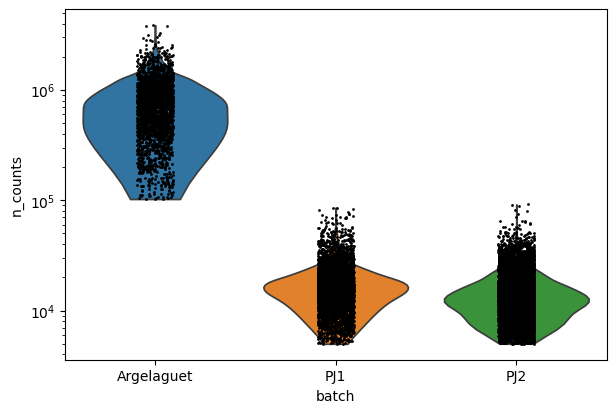

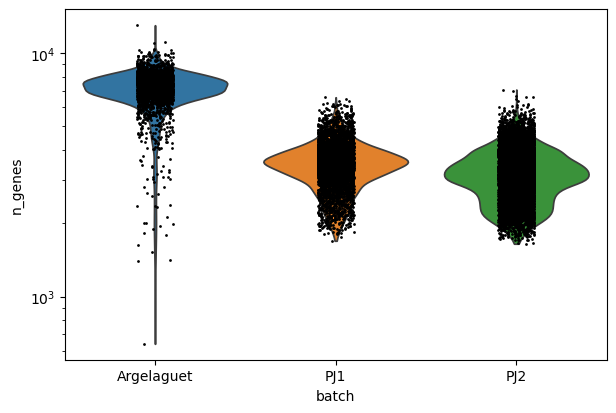

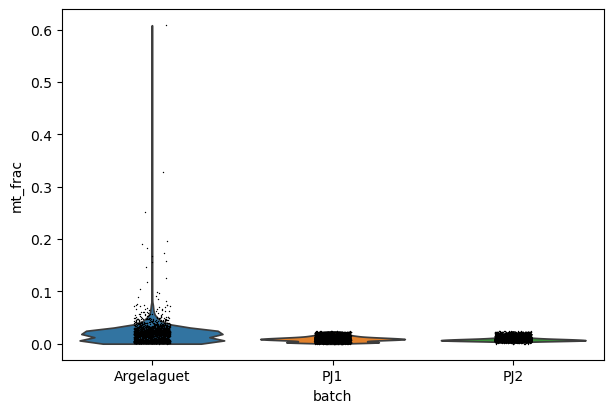

In [27]:
# Concatenate for plotting only
# Add proper batch labels
adata_all = anndata.concat(
    [adata_arg, adata_pj1, adata_pj2],
    label="batch",
    keys=["Argelaguet", "PJ1", "PJ2"],  # This sets proper batch names
    join="inner"
)

# Make sure gene names are consistent
adata_all.var_names_make_unique()

# Store the original directory
original_dir = os.getcwd()

# Define the figures directory as an absolute path
figures_dir = os.path.join(original_dir, "figures")

# Create the figures directory (folder) if it doesn't exist
if not os.path.exists(figures_dir):
    os.makedirs(figures_dir)

# Change to the figures directory
os.chdir(figures_dir)

# Set Scanpy's figure directory to the current directory (prevents nested 'figures/' folder)
sc.settings.figdir = os.path.abspath(".")

# Violin plots per batch, saved in the figures folder
sc.pl.violin(adata_all, 'n_counts', groupby='batch', size=2, log=True, cut=0, 
             save="n_counts_per_batch.png", show=True)
sc.pl.violin(adata_all, 'n_genes', groupby='batch', size=2, log=True, cut=0, 
             save="n_genes_per_batch.png", show=True)
sc.pl.violin(adata_all, 'mt_frac', groupby='batch', 
             save="mt_frac_per_batch.png", show=True)

# Revert to the original directory
os.chdir(original_dir)

**Quality Control Summary**

The plots show that the **Argelaguet** dataset has the highest total counts and number of detected genes per cell, while **PJ1** and **PJ2** exhibit notably lower values for both metrics. This likely reflects differences in library preparation or sequencing depth across batches. Despite the differences, total counts per cell are generally above commonly used thresholds such as 1,000.

The mitochondrial RNA fraction (`mt_frac`) is low across all datasets. While **Argelaguet** includes some cells with higher mitochondrial content (up to ~60%), most cells remain well below typical thresholds (e.g., 10–20%), suggesting overall good RNA quality.

Although batch-specific filtering could help fine-tune QC, the similarity in the mode of distributions across batches indicates that **global QC thresholds** are reasonable to apply. Still, the presence of a few lower-quality cells in **Argelaguet** should be kept in mind during downstream analyses.

### Setting 99th percentile threshold to remove potential doublets

In [28]:
# Get dynamic threshold instead of manually selecting it to avoid bias (99 percentile)
def get_dynamic_threshold(adata, percentile=99):
    """Returns a dynamic threshold for n_counts based on percentile."""
    return np.percentile(adata.obs['n_counts'], percentile)

def plot_qc_scatters(adata, title, percentile=99):
    max_count = get_dynamic_threshold(adata, percentile)
    subset = adata[adata.obs['n_counts'] < max_count]

    # Shared color mapping
    mt = adata.obs['mt_frac']
    cmap = cm.get_cmap("viridis")
    norm = colors.Normalize(vmin=mt.min(), vmax=mt.max())

    # Create a 1x3 grid: two plots + one for colorbar
    fig = plt.figure(figsize=(14, 5))
    gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.05], wspace=0.25)

    # Full plot
    ax0 = fig.add_subplot(gs[0])
    ax0.scatter(adata.obs['n_counts'], adata.obs['n_genes'], c=mt, cmap=cmap, norm=norm, s=5)
    ax0.set_title(f"{title} - Full")
    ax0.set_xlabel("n_counts")
    ax0.set_ylabel("n_genes")

    # Zoomed plot
    ax1 = fig.add_subplot(gs[1])
    if subset.n_obs > 0:
        ax1.scatter(subset.obs['n_counts'], subset.obs['n_genes'], c=subset.obs['mt_frac'], cmap=cmap, norm=norm, s=5)
    ax1.set_title(f"{title} - Zoomed (<p{percentile})")
    ax1.set_xlabel("n_counts")
    ax1.set_ylabel("n_genes")

    # Colorbar
    ax_cb = fig.add_subplot(gs[2])
    sm = cm.ScalarMappable(norm=norm, cmap=cmap)
    cbar = plt.colorbar(sm, cax=ax_cb)
    cbar.set_label("Mitochondrial Fraction", rotation=270, labelpad=15)

    plt.tight_layout()
    # Save the plot as PNG before displaying
    plt.savefig(os.path.join(figures_dir, f"qc_plots_{title}.png"), bbox_inches='tight')
    # Display the plot in Jupyter
    plt.show()
    # Close the figure to free memory
    plt.close()

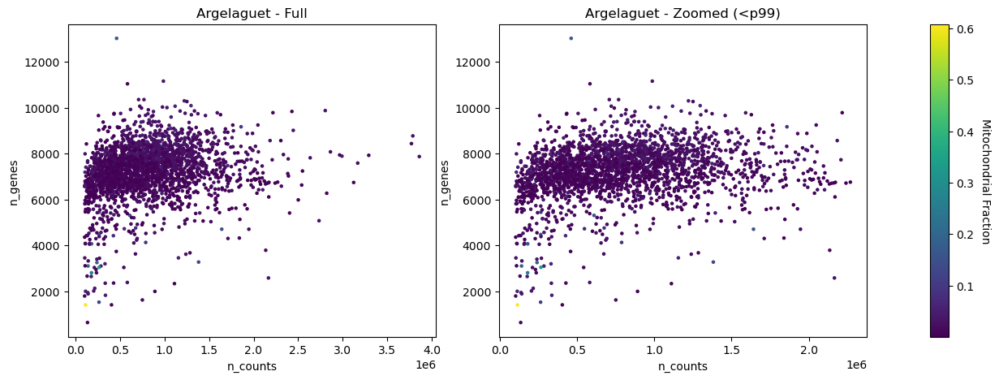

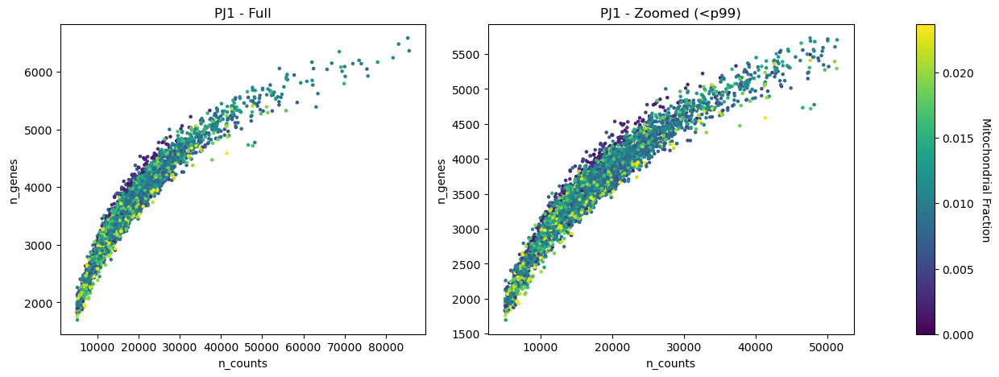

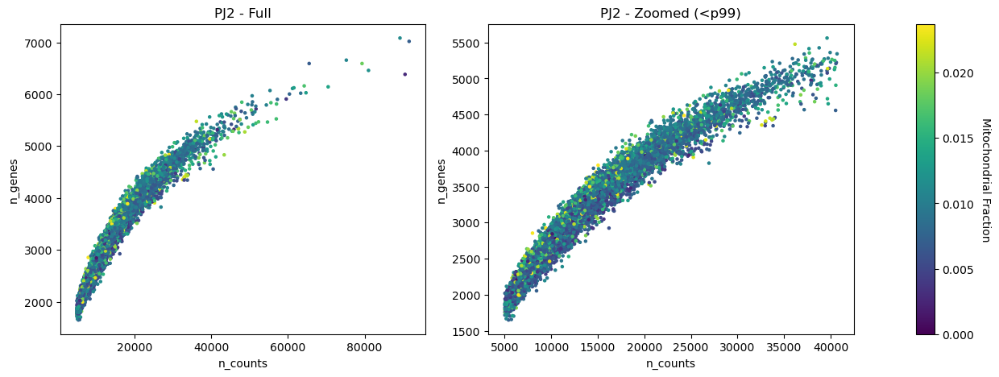

In [29]:
# Use the function and visualise the plots for each batch 
plot_qc_scatters(adata_arg, "Argelaguet")
plot_qc_scatters(adata_pj1, "PJ1")
plot_qc_scatters(adata_pj2, "PJ2")

In [30]:
# Let's print out th 99th percentile used
for adata, name in zip([adata_arg, adata_pj1, adata_pj2], ["Argelaguet", "PJ1", "PJ2"]):
    threshold = get_dynamic_threshold(adata, percentile=99)
    print(f"{name} - 99th percentile of n_counts: {int(threshold):,}")

Argelaguet - 99th percentile of n_counts: 2,279,968
PJ1 - 99th percentile of n_counts: 51,574
PJ2 - 99th percentile of n_counts: 40,835


### Quality Control: Counts, Genes, and Mitochondrial Fraction

By visualising the relationship between the number of detected genes and total counts per cell, colored by mitochondrial RNA fraction, we can assess potential low-quality or stressed cells in each batch.

From the plots:

- **Argelaguet (99th percentile n_counts cutoff: 2,279,968)**  
  Shows a wide range of counts and genes per cell. Most cells have high gene counts with relatively low mitochondrial fraction. However, some low-count cells (especially those with < 4000 genes) show elevated mitochondrial RNA, suggesting potential cell stress or apoptosis. Despite this, the main population appears healthy.

- **PJ1 (99th percentile n_counts cutoff: 51,574)**  
  Displays a strong correlation between counts and genes. A visible trend is that cells with lower counts (below ~15,000) tend to show higher mitochondrial fractions. This may indicate some stressed or dying cells. Cells with very low gene counts (< 2000) may be filtered to improve data quality.

- **PJ2 (99th percentile n_counts cutoff: 40,835)**  
  Similar to PJ1, a tight correlation is seen, with low-count/low-gene cells often exhibiting slightly elevated mitochondrial content. The mitochondrial fraction remains low overall, but filtering out the lowest complexity cells (e.g., < 2000 genes) is still advisable.

**Conclusion:**  
Across all datasets, cells with low numbers of genes and total counts are more likely to have higher mitochondrial fractions—consistent with stressed or dying cells. These should be removed using informed thresholds. However, mitochondrial enrichment in high-count cells is not observed, indicating no obvious biology-driven mitochondrial upregulation.

### Knee Point Detection - remove outliers

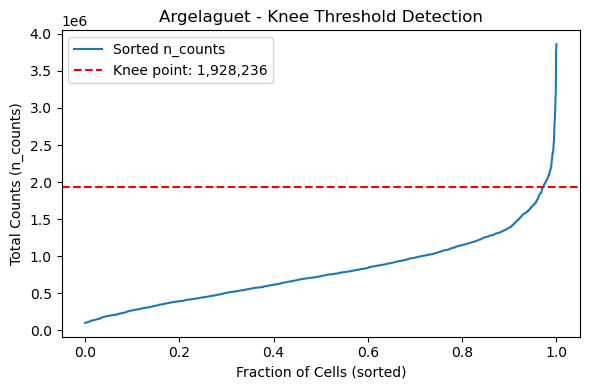

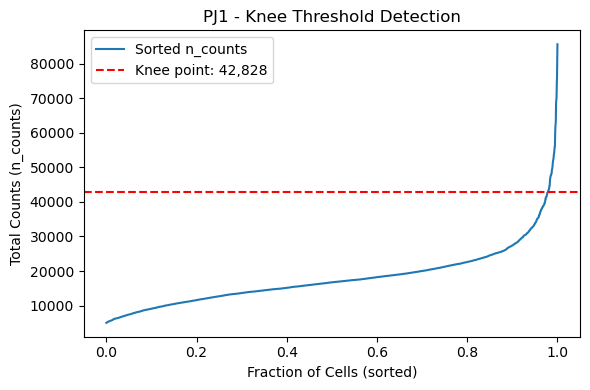

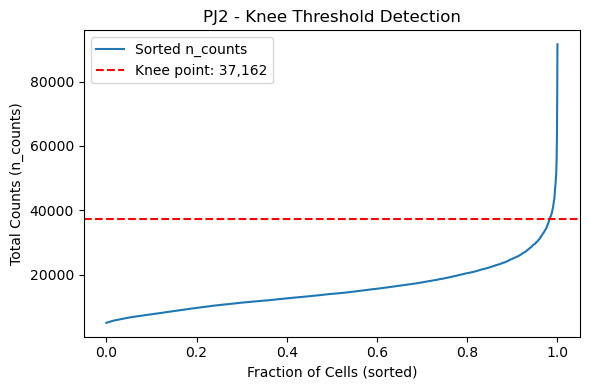

In [31]:
from kneed import KneeLocator

# In scRNA-seq data, low-quality cells often have unusually low total counts.
# To objectively define a threshold below which cells should be filtered,
# we use the "knee point" (also known as elbow point) of the sorted distribution
# of total counts (`n_counts`) across all cells.
#
# The "knee" is the point where the curve flattens — i.e., where counts stop increasing rapidly.
# This is often a good place to separate low-quality (under-sequenced) cells from true biological signal.
#
# We use the `kneed` package to automatically find this inflection point.

def find_knee_threshold(adata, resolution=100):
    """
    Find the knee point in the sorted n_counts distribution.

    Parameters:
        adata: AnnData object
        resolution: number of points used for knee detection (default 100, unused here but customizable)

    Returns:
        threshold: integer value of n_counts at the detected knee point
    """
    sorted_counts = np.sort(adata.obs['n_counts'].values)
    x = np.linspace(0, 1, len(sorted_counts))  # Normalise x-axis (fraction of cells)

    # Use the Kneedle algorithm to find the inflection (knee) point
    kneedle = KneeLocator(x, sorted_counts, curve='convex', direction='increasing')

    # If knee found, use that; else fallback to the 1st percentile as a conservative estimate
    threshold = kneedle.knee_y if kneedle.knee_y is not None else sorted_counts[int(0.01 * len(sorted_counts))]
    return int(threshold)


def plot_knee(adata, title):
    """
    Plot the sorted n_counts distribution with the detected knee threshold overlaid.

    Parameters:
        adata: AnnData object
        title: str, title for the plot (e.g., dataset name)
    """
    sorted_counts = np.sort(adata.obs['n_counts'].values)
    x = np.linspace(0, 1, len(sorted_counts))
    threshold = find_knee_threshold(adata)

    # Plot the curve and the threshold line
    plt.figure(figsize=(6, 4))
    plt.plot(x, sorted_counts, label='Sorted n_counts')
    plt.axhline(threshold, color='red', linestyle='--', label=f'Knee point: {threshold:,}')
    plt.title(f"{title} - Knee Threshold Detection")
    plt.xlabel("Fraction of Cells (sorted)")
    plt.ylabel("Total Counts (n_counts)")
    plt.legend()
    plt.tight_layout()
    # Save the plot as PNG before displaying
    plt.savefig(os.path.join(figures_dir, f"knee_plot_{title}.png"), bbox_inches='tight')
    # Display the plot in Jupyter
    plt.show()
    # Close the figure to free memory
    plt.close()

# Apply to all datasets and plot
for ad, name in zip([adata_arg, adata_pj1, adata_pj2], ["Argelaguet", "PJ1", "PJ2"]):
    plot_knee(ad, name)

In [32]:
# Let's print out the knee threshold used
for adata, name in zip([adata_arg, adata_pj1, adata_pj2], ["Argelaguet", "PJ1", "PJ2"]):
    knee = find_knee_threshold(adata)
    print(f"{name} - Knee Threshold of n_counts: {int(knee):,}")

Argelaguet - Knee Threshold of n_counts: 1,928,236
PJ1 - Knee Threshold of n_counts: 42,828
PJ2 - Knee Threshold of n_counts: 37,162


It looks like the knee thresholds align with the 99th percentiles. That means that the outliers are clearly separated and most of the cells are clustered tightly in a lower range.

### Estimate Low and High Thresholds

In [33]:
# Utility function for computing thresholds (low - < 5%; high - > 99%)
def compute_thresholds(adata, low_percentile=5, high_percentile=99):
    counts = adata.obs["n_counts"]
    low_exact = np.percentile(counts, low_percentile)
    high_exact = np.percentile(counts, high_percentile)
    return {
        "low_exact": int(low_exact),
        "low_rounded": int(np.round(low_exact, -2)),
        "high_exact": int(high_exact),
        "high_rounded": int(np.round(high_exact, -2))
    }

# Store all thresholds
thresholds = {
    "Argelaguet": compute_thresholds(adata_arg),
    "PJ1": compute_thresholds(adata_pj1),
    "PJ2": compute_thresholds(adata_pj2),
}

# Print them out
for name, th in thresholds.items():
    print(f"\n{name} thresholds:")
    print(f"  Low:  {th['low_exact']:,} (rounded: {th['low_rounded']:,})")
    print(f"  High: {th['high_exact']:,} (rounded: {th['high_rounded']:,})")


Argelaguet thresholds:
  Low:  195,909 (rounded: 195,900)
  High: 2,279,968 (rounded: 2,280,000)

PJ1 thresholds:
  Low:  7,408 (rounded: 7,400)
  High: 51,574 (rounded: 51,600)

PJ2 thresholds:
  Low:  6,636 (rounded: 6,600)
  High: 40,835 (rounded: 40,800)


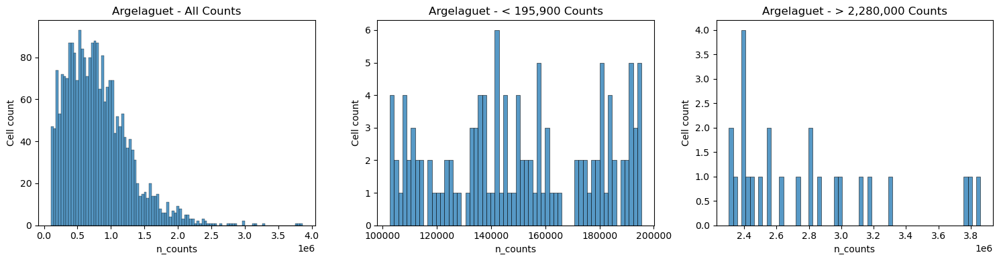

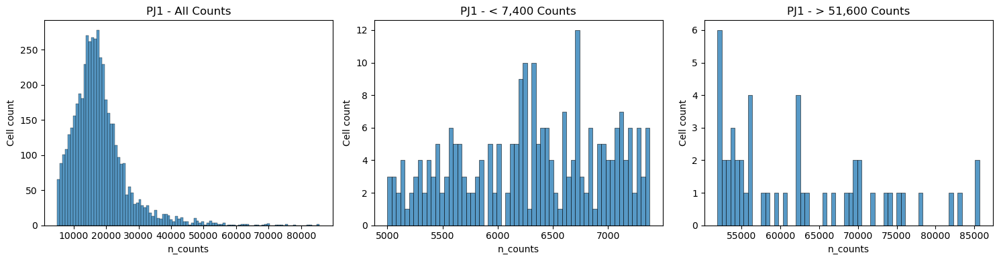

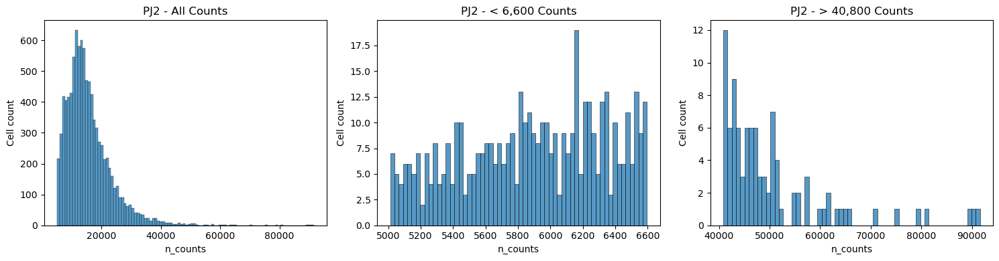

In [34]:
# Function to plot count distributions with dataset-specific thresholds
def plot_n_counts_distribution(adata, name, low_thresh, high_thresh):
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))
    
    # All counts
    sns.histplot(adata.obs['n_counts'], bins=100, ax=axs[0])
    axs[0].set_title(f"{name} - All Counts")

    # Low counts
    sns.histplot(adata.obs['n_counts'][adata.obs['n_counts'] < low_thresh], bins=60, ax=axs[1])
    axs[1].set_title(f"{name} - < {low_thresh:,} Counts")

    # High counts
    sns.histplot(adata.obs['n_counts'][adata.obs['n_counts'] > high_thresh], bins=60, ax=axs[2])
    axs[2].set_title(f"{name} - > {high_thresh:,} Counts")

    for ax in axs:
        ax.set_xlabel("n_counts")
        ax.set_ylabel("Cell count")
    
    plt.tight_layout()
    # Save the plot as PNG before displaying
    plt.savefig(os.path.join(figures_dir, f"n_counts_plot_{name}.png"), bbox_inches='tight')
    # Display the plot in Jupyter
    plt.show()
    # Close the figure to free memory
    plt.close()

# Use stored thresholds for each dataset and plot
plot_n_counts_distribution(
    adata_arg, 
    "Argelaguet", 
    low_thresh=thresholds["Argelaguet"]['low_rounded'], 
    high_thresh=thresholds["Argelaguet"]['high_rounded']
)

plot_n_counts_distribution(
    adata_pj1, 
    "PJ1", 
    low_thresh=thresholds["PJ1"]['low_rounded'], 
    high_thresh=thresholds["PJ1"]['high_rounded']
)

plot_n_counts_distribution(
    adata_pj2, 
    "PJ2", 
    low_thresh=thresholds["PJ2"]['low_rounded'], 
    high_thresh=thresholds["PJ2"]['high_rounded']
)

### Thresholding Summary and Discussion

#### Argelaguet thresholds:
- **Low Threshold:** 195,909 (rounded to 195,900)
- **High Threshold:** 2,279,968 (rounded to 2,280,000)

#### PJ1 thresholds:
- **Low Threshold:** 7,408 (rounded to 7,400)
- **High Threshold:** 51,574 (rounded to 51,600)

#### PJ2 thresholds:
- **Low Threshold:** 6,636 (rounded to 6,600)
- **High Threshold:** 40,835 (rounded to 40,800)

---

### Discussion:

Histograms of the number of counts per cell indicate the presence of two smaller peaks in the distribution, with cells having fewer than 1500 counts. These peaks likely represent uninformative or poor-quality cells, possibly cellular debris from droplets. 

On the higher end of the distribution, we observe a population of cells with higher counts, showing a broad peak around 20,000 counts. Based on this observation, we estimate the population to extend up to 40,000 counts. This estimation is derived by visually fitting a Gaussian curve to the peak of this population.

- **Low Thresholding:** Cells with fewer than 7,400 counts (in PJ1) and fewer than 6,600 counts (in PJ2) are likely outliers and should be excluded, as they don't contribute useful information.
  
- **High Thresholding:** Cells with more than 51,600 counts in PJ1 and 40,800 counts in PJ2 indicate a high count population which we retain based on the peak shape and standard thresholds.

In summary, the thresholds help us identify and exclude both low- and high-quality outliers, ensuring that the analysis focuses on cells with informative transcriptomic profiles.

### Similarly, let's find the potential outliers using the number of genes

In [35]:
# Function to compute both low and high thresholds dynamically
def compute_gene_thresholds(adata, low_percentile=5, high_percentile=99):
    """
    Automatically computes low and high thresholds based on the histogram distribution.
    Low threshold is based on the 5th percentile, high threshold on the 99th percentile.
    """
    gene_counts = adata.obs["n_genes"]
    
    # Low and high thresholds based on percentiles
    low_exact = np.percentile(gene_counts, low_percentile)
    high_exact = np.percentile(gene_counts, high_percentile)
    
    # Rounding thresholds
    low_rounded = int(np.round(low_exact, -2))
    high_rounded = int(np.round(high_exact, -2))
    
    return {
        "low_exact": int(low_exact),
        "low_rounded": low_rounded,
        "high_exact": int(high_exact),
        "high_rounded": high_rounded
    }

# Store all thresholds
thresholds_gene = {
    "Argelaguet": compute_gene_thresholds(adata_arg),
    "PJ1": compute_gene_thresholds(adata_pj1),
    "PJ2": compute_gene_thresholds(adata_pj2),
}

# Print them out
for name, th in thresholds_gene.items():
    print(f"\n{name} thresholds:")
    print(f"  Low:  {th['low_exact']:,} (rounded: {th['low_rounded']:,})")
    print(f"  High: {th['high_exact']:,} (rounded: {th['high_rounded']:,})")


Argelaguet thresholds:
  Low:  5,339 (rounded: 5,300)
  High: 9,738 (rounded: 9,700)

PJ1 thresholds:
  Low:  2,356 (rounded: 2,400)
  High: 5,566 (rounded: 5,600)

PJ2 thresholds:
  Low:  2,113 (rounded: 2,100)
  High: 5,259 (rounded: 5,300)


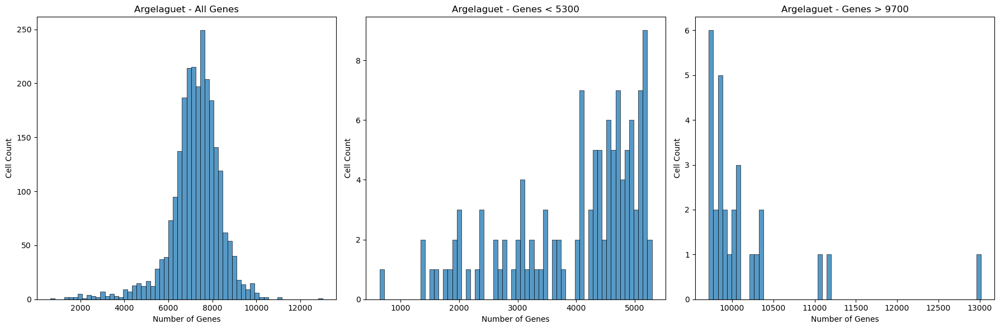

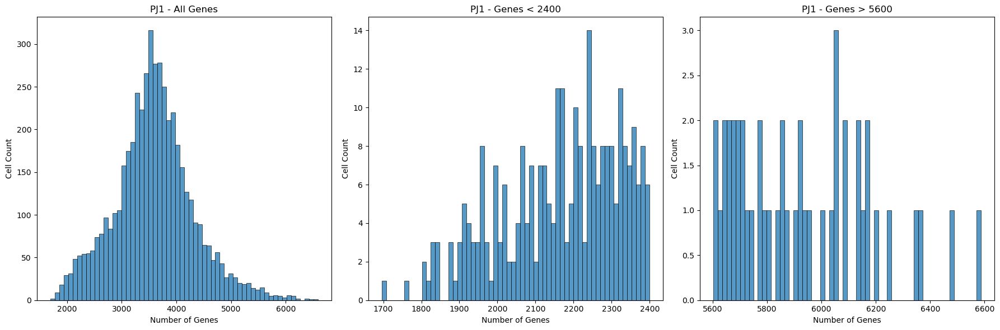

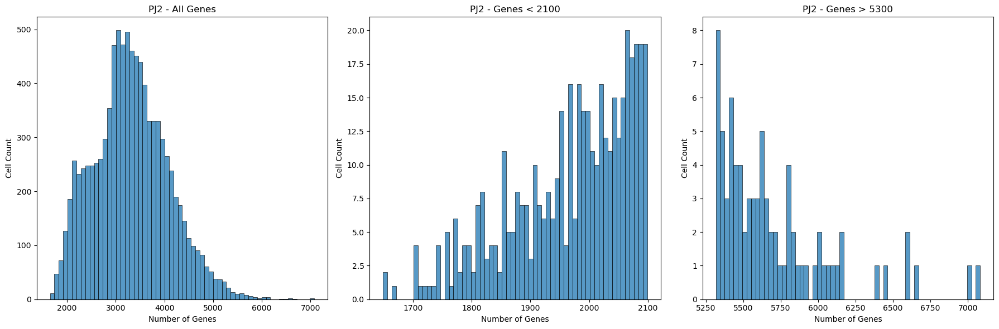

In [36]:
# Function to plot the gene count distributions with dataset-specific thresholds
def plot_n_genes_distribution_with_high_threshold(adata, name, low_thresh, high_thresh):
    # Plot the distribution of the number of genes
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    
    # All genes
    sns.histplot(adata.obs['n_genes'], kde=False, bins=60, ax=axs[0])
    axs[0].set_title(f'{name} - All Genes')
    axs[0].set_xlabel('Number of Genes')
    axs[0].set_ylabel('Cell Count')

    # Low genes (using low threshold)
    sns.histplot(adata.obs['n_genes'][adata.obs['n_genes'] < low_thresh], kde=False, bins=60, ax=axs[1])
    axs[1].set_title(f'{name} - Genes < {low_thresh}')
    axs[1].set_xlabel('Number of Genes')
    axs[1].set_ylabel('Cell Count')

    # High genes (using high threshold)
    sns.histplot(adata.obs['n_genes'][adata.obs['n_genes'] > high_thresh], kde=False, bins=60, ax=axs[2])
    axs[2].set_title(f'{name} - Genes > {high_thresh}')
    axs[2].set_xlabel('Number of Genes')
    axs[2].set_ylabel('Cell Count')
    
    plt.tight_layout()
    # Save the plot as PNG before displaying
    plt.savefig(os.path.join(figures_dir, f"n_genes_plot_{name}.png"), bbox_inches='tight')
    # Display the plot in Jupyter
    plt.show()
    # Close the figure to free memory
    plt.close()

# Now plot for each dataset
plot_n_genes_distribution_with_high_threshold(
    adata_arg, 
    "Argelaguet", 
    low_thresh=thresholds_gene["Argelaguet"]['low_rounded'], 
    high_thresh=thresholds_gene["Argelaguet"]['high_rounded']
)

plot_n_genes_distribution_with_high_threshold(
    adata_pj1, 
    "PJ1", 
    low_thresh=thresholds_gene["PJ1"]['low_rounded'], 
    high_thresh=thresholds_gene["PJ1"]['high_rounded']
)

plot_n_genes_distribution_with_high_threshold(
    adata_pj2, 
    "PJ2", 
    low_thresh=thresholds_gene["PJ2"]['low_rounded'], 
    high_thresh=thresholds_gene["PJ2"]['high_rounded']
)

### Thresholding Decisions Based on Gene Distribution

In the above plots, we observe the gene distributions for each dataset, along with the thresholds for low and high gene counts.

- **Argelaguet**:
  - Low threshold: 5,339 (rounded: 5,300)
  - High threshold: 9,738 (rounded: 9,700)

- **PJ1**:
  - Low threshold: 2,356 (rounded: 2,400)
  - High threshold: 5,566 (rounded: 5,600)

- **PJ2**:
  - Low threshold: 2,113 (rounded: 2,100)
  - High threshold: 5,259 (rounded: 5,300)

In these histograms, we can see the distribution of gene counts for each dataset. For **Argelaguet**, a significant peak is observed between 6,000-9,000 genes, which helps inform the low threshold. The **PJ1** and **PJ2** distributions have similar patterns, with peaks indicating gene counts predominantly around 2,000-6,000 for **PJ1** and slightly lower for **PJ2**.

The genes show almost a perfect normal (or Gaussian) distributions, especially in **PJ1**. **Argelaguet** might have some outtliers from both sides of the graph, meanwhile **PJ1** is slightly skewed to the left

We decided to set the **low threshold** based on the distribution of genes in each dataset. Specifically, cells with gene counts below these thresholds (e.g., **Argelaguet** <5,300, **PJ1** <2,400, **PJ2** <2,100) are filtered out as they likely represent low-quality cells, such as dead cells or empty droplets containing ambient RNA. These cells tend to have fewer genes expressed and are likely not informative for downstream analysis.

We also defined a **high threshold** (e.g., **Argelaguet** >9,700, **PJ1** >5,600, **PJ2** >5,300) to ensure that cells with excessive gene counts are excluded. This high threshold helps eliminate potential doublets or cells that have an abnormally high number of genes.

As a general guideline, early filtering should be done conservatively to avoid removing useful data. The more stringent filtering, as we see in these plots, is applied after further analysis, such as clustering or dimensionality reduction, which can give us more insights into the biological relevance of these thresholds.

### Quality Control Thresholds in Single-Cell RNA-seq

Data quality control can be split into **cell QC** and **gene QC**. Typical quality measures for assessing the quality of a cell include the number of molecule counts (UMIs), the number of expressed genes, and the fraction of counts that are mitochondrial. A high fraction of mitochondrial reads can indicate cell stress or dying cells, as there is a low proportion of nuclear mRNA in the cell. High mitochondrial RNA fractions could also represent elevated cellular respiration.

To ensure high-quality downstream analysis, we apply standard filtering based on three key metrics:

1. **Mitochondrial Content**
2. **Library Size (Total Counts)**
3. **Gene Complexity (Number of Expressed Genes)**

Cells that fall below or above threshold values are often:
- Low quality (e.g., lysed or dead cells)
- Empty droplets
- Technical artifacts (e.g., doublets)

### Filtering Criteria Used

| QC Metric                  | Threshold Used             | Common Threshold Range         | Justification / Reference |
|----------------------------|----------------------------|---------------------------------|----------------------------|
| **% Mitochondrial Genes**  | `< 20%`                    | 5% – 20%                        | High values suggest cell stress or death. [Luecken & Theis, 2019](https://doi.org/10.1038/s41592-019-0470-0) |
| **Total Counts (Min)**     | `> 195,900 (Argelaguet), 7,400 (PJ1), 6,600 (PJ2)` | 5,000 – 100,000 UMIs            | Filters out low-complexity or empty droplets. [Scanpy Tutorial](https://scanpy.readthedocs.io/en/stable/tutorials/pbmc3k.html) |
| **Total Counts (Max)**     | `< 2,280,000 (Argelaguet), 51,600 (PJ1), 40,800 (PJ2)` | 5,000 – 100,000 UMIs            | Filters out low-complexity or empty droplets. [Scanpy Tutorial](https://scanpy.readthedocs.io/en/stable/tutorials/pbmc3k.html) |
| **Number of Genes (Min)**  | `> 5,300 (Argelaguet), 2,400 (PJ1), 2,100 (PJ2)` | 200 – 500 genes                 | Removes low-quality or damaged cells. [Seurat Tutorial](https://satijalab.org/seurat/articles/pbmc3k_tutorial.html) |
| **Number of Genes (Max)**  | `< 9,700 (Argelaguet), 5,600 (PJ1), 5,300 (PJ2)` | 6,000 – 8,000 genes             | Removes likely **doublets** or multiplets. Optional but commonly used. [Svensson et al., 2018](https://doi.org/10.1038/s41592-018-0229-2) |

### Notes:
- Mitochondrial genes typically begin with `"mt-"` in gene symbols.
- An upper gene threshold helps reduce contamination from doublets, which can confound clustering and cell type inference.
- Genes are also filtered if they are not detected in **at least 20 cells**. This reduces the dimensions of the matrix by removing 0 count genes and genes which are not sufficiently informative. 

This table summarizes the thresholds applied during quality control in this analysis, ensuring the filtering process is driven by the data distribution and aligned with recommended practices in single-cell RNA-seq.

In [37]:
# Quick check
adata_arg.var

,mt
ens_id,
Xkr4,False
Rp1,False
Sox17,False
Mrpl15,False
Lypla1,False
...,...
ENSMUSG00000079808,False
ENSMUSG00000095041,False
ENSMUSG00000063897,False


In [38]:
adata_arg.n_vars

22084

In [39]:
# Function to perform filtering based on the thresholds for both n_counts and n_genes
def perform_qc(adata, name, thresholds, thresholds_gene):
    """
    Perform quality control based on the following thresholds:
    - Total counts (n_counts)
    - Number of genes (n_genes)
    - Mitochondrial fraction (mt_frac)
    """
    # Calculate QC metrics using your custom function
    adata = calculate_qc_metrics(adata)

    # Store the initial number of cells and genes
    initial_cells = adata.n_obs
    initial_genes = adata.n_vars

    # Apply the thresholds for n_counts (low and high)
    low_thresh_n_counts = thresholds['low_rounded']
    high_thresh_n_counts = thresholds['high_rounded']
    adata = adata[adata.obs["n_counts"] > low_thresh_n_counts, :]  # Apply low n_counts filter
    adata = adata[adata.obs["n_counts"] < high_thresh_n_counts, :]  # Apply high n_counts filter

    # Apply the thresholds for n_genes (low and high)
    low_thresh_genes = thresholds_gene['low_rounded']
    high_thresh_genes = thresholds_gene['high_rounded']
    adata = adata[adata.obs["n_genes"] > low_thresh_genes, :]  # Apply low gene count filter
    adata = adata[adata.obs["n_genes"] < high_thresh_genes, :]  # Apply high gene count filter

    # Filter cells with high mitochondrial content
    adata = adata[adata.obs["mt_frac"] < 0.2, :]  # Mitochondrial content < 20%

    # Print number of cells filtered out
    print(f"{name} cells before QC: {initial_cells} cells; after QC: {adata.n_obs} cells")
    print(f"{name} cells filtered out: {initial_cells - adata.n_obs} cells")
    
    # Gene filtering: Filter out genes that are not expressed in at least 20 cells
    initial_genes = adata.n_vars  # Update initial number of genes after cell filtering
    sc.pp.filter_genes(adata, min_cells=20)
    
    # Print number of genes filtered out
    print(f"------")
    print(f"{name} genes before QC: {initial_genes} genes; after QC: {adata.n_vars} genes")
    print(f"{name} genes filtered out: {initial_genes - adata.n_vars} genes")

    return adata

# Apply QC filtering for Argelaguet using both n_counts and n_genes thresholds
adata_arg_qc = perform_qc(
    adata_arg, "Argelaguet", thresholds["Argelaguet"], thresholds_gene["Argelaguet"]
)

Argelaguet cells before QC: 2471 cells; after QC: 2204 cells
Argelaguet cells filtered out: 267 cells
------
Argelaguet genes before QC: 22084 genes; after QC: 15799 genes
Argelaguet genes filtered out: 6285 genes


In [40]:
# Apply QC filtering for PJ1 using both n_counts and n_genes thresholds
adata_pj1_qc = perform_qc(
    adata_pj1, "PJ1", thresholds["PJ1"], thresholds_gene["PJ1"]
)

PJ1 cells before QC: 4966 cells; after QC: 4604 cells
PJ1 cells filtered out: 362 cells
------
PJ1 genes before QC: 29452 genes; after QC: 13899 genes
PJ1 genes filtered out: 15553 genes


In [41]:
# Apply QC filtering for PJ2 using both n_counts and n_genes thresholds

adata_pj2_qc = perform_qc(
    adata_pj2, "PJ2", thresholds["PJ2"], thresholds_gene["PJ2"]
)

PJ2 cells before QC: 9512 cells; after QC: 8861 cells
PJ2 cells filtered out: 651 cells
------
PJ2 genes before QC: 29452 genes; after QC: 14831 genes
PJ2 genes filtered out: 14621 genes


In [42]:
# Quick Check
adata_arg_qc.var

,mt,n_cells
ens_id,,
Xkr4,False,91
Rp1,False,24
Sox17,False,354
Mrpl15,False,2199
Lypla1,False,2074
...,...,...
mt-Nd4l,True,2181
mt-Nd4,True,2203
mt-Nd5,True,2200


In [43]:
adata_arg_qc.obs

,stage,celltype,batch,n_counts,log_counts,n_genes,mt_frac
E6.5_Plate1_E9,E6.5,ExE_ectoderm,Arg_batch1,1850080,14.430740,6938,0.001596
E6.5_Plate1_G9,E6.5,ExE_ectoderm,Arg_batch1,1276353,14.059518,8118,0.007311
E6.5_Plate1_F9,E6.5,ExE_ectoderm,Arg_batch1,809622,13.604324,7888,0.004266
E6.5_Plate1_A9,E6.5,Primitive_Streak,Arg_batch1,1854028,14.432872,6616,0.003992
E6.5_Plate1_B9,E6.5,Epiblast,Arg_batch1,1530136,14.240868,7183,0.002513
...,...,...,...,...,...,...,...
E4.5-5.5_new_Plate2_C11,E5.5,Epiblast,Arg_batch1,479392,13.080276,6893,0.001992
E4.5-5.5_new_Plate2_B11,E5.5,Epiblast,Arg_batch1,621202,13.339413,7868,0.003521
E4.5-5.5_new_Plate4_A11,E4.5,Epiblast,Arg_batch1,334295,12.719782,6655,0.013015
E4.5-5.5_new_Plate2_H11,E5.5,Visceral_endoderm,Arg_batch1,787248,13.576300,6889,0.001606


### Quality Control Results and Interpretation

The filtering process, based on the thresholds identified from the QC plots, resulted in the following:

#### **Argelaguet**:
- **Cells**: 2,471 → 2,204 (267 cells filtered out, ~10.8%)
- **Genes**: 22,084 → 15,799 (6,285 genes filtered out, ~28.5%)

#### **PJ1**:
- **Cells**: 4,966 → 4,604 (362 cells filtered out, ~7.3%)
- **Genes**: 29,452 → 13,899 (15,553 genes filtered out, ~52.8%)

#### **PJ2**:
- **Cells**: 9,512 → 8,861 (651 cells filtered out, ~6.8%)
- **Genes**: 29,452 → 14,831 (14,621 genes filtered out, ~49.6%)

---

### Interpretation:

- **Argelaguet**: 10.8% of cells and 28.5% of genes were filtered out, indicating moderate filtering of low-quality cells and genes with insufficient expression.
- **PJ1**: 7.3% of cells and 52.8% of genes were filtered out, with a high proportion of genes removed, likely due to low expression.
- **PJ2**: 6.8% of cells and 49.6% of genes were filtered out, showing similar trends as PJ1, with substantial gene filtering.

### Notes:
- Filtering was based on `n_counts`, `n_genes`, and `mt_frac` thresholds.
- **Genes** were additionally filtered if detected in fewer than 20 cells, removing uninformative or 0-count genes and reducing dimensionality.

### 1.4. Normalization

This step is performed separately for each dataset before integration with scVI, following standard practice (Theis Lab single-cell tutorial).

At this stage, the data is represented as a count matrix, where the counts reflect the captured mRNA molecules in the scRNA-seq experiment. Since not all mRNA molecules are detected, the total counts per cell will vary, influenced by the number of molecules present and the sampling process. As cell sizes differ, we cannot assume that all cells contain the same number of molecules. Instead, we estimate size factors, which are cell-specific scaling factors proportional to the actual number of molecules in each cell.

For normalization, we apply a scran-based normalization method, which has been shown to perform well for differential testing and batch correction (Buettner et al., 2019). This method requires a coarse clustering input to improve the estimation of size factors. To accomplish this, we first perform a low-resolution clustering of the data to generate cluster inputs for the size factor calculation. Following this, we perform library size normalization (counts per million - CPM) and log-transformation of the count data to stabilize variance and ensure appropriate scaling for downstream analysis.

This approach ensures that each cell’s data is normalized relative to its size, making the expression values comparable across cells, while also accounting for any potential systematic biases in the sequencing data.

In [44]:
# Function to perform normalization and calculate size factors
def calculate_size_factors(adata):
    """
    Perform normalization and calculate size factors for each cell.
    Here, we're using Scanpy's normalize_per_cell method for simplicity.
    """
    # Ensure the data is in float64 format before normalization
    adata.X = adata.X.astype('float64')

    # Store the raw count data in the 'counts' layer for later use
    adata.layers["counts"] = adata.X.copy()

    # Normalize per cell using counts per million (CPM)
    sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e6)
    
    # Store size factors in adata.obs by dividing the total counts by the mean count per cell
    adata.obs['size_factors'] = adata.obs['n_counts'] / adata.obs['n_counts'].mean()
    
    # Log-transform the normalized data (log(count + 1))
    sc.pp.log1p(adata)
    
    # Store the log-transformed data in 'raw' for downstream analysis
    adata.raw = adata

    return adata

# Apply size factor calculation for each dataset
adata_arg_norm = calculate_size_factors(adata_arg_qc)
adata_pj1_norm = calculate_size_factors(adata_pj1_qc)
adata_pj2_norm = calculate_size_factors(adata_pj2_qc)

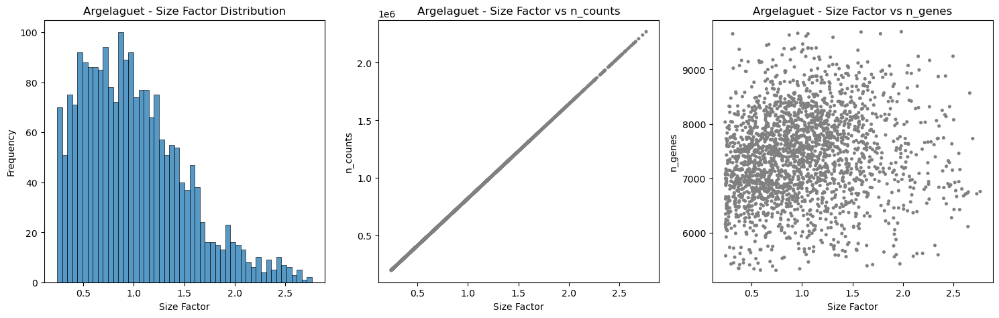

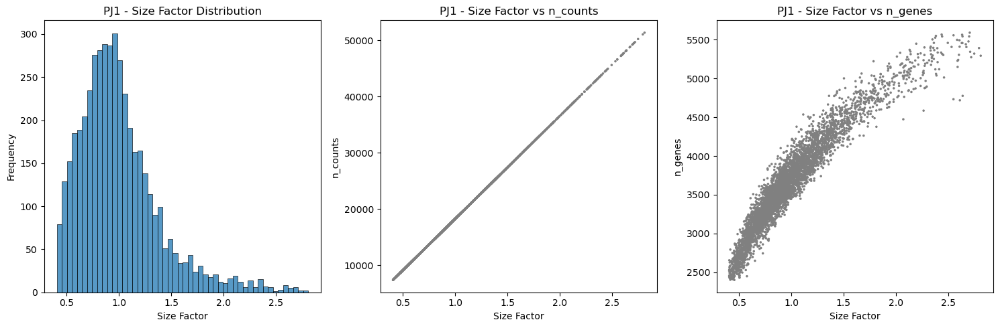

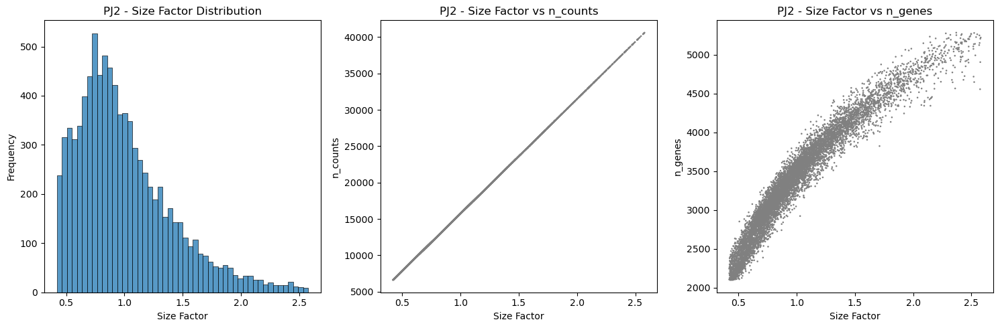

In [45]:
# Function to plot size factors and scatter plots
def plot_size_factors_and_scatter(adata, title):
    """
    Plot the distribution of size factors along with scatter plots for n_counts and n_genes.
    """
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Histogram of size factors
    sns.histplot(adata.obs['size_factors'], bins=50, kde=False, ax=axs[0])
    axs[0].set_title(f"{title} - Size Factor Distribution")
    axs[0].set_xlabel("Size Factor")
    axs[0].set_ylabel("Frequency")

    # Scatter plot for size_factors vs n_counts
    sc.pl.scatter(adata, x='size_factors', y='n_counts', ax=axs[1], show=False)
    axs[1].set_title(f"{title} - Size Factor vs n_counts")
    axs[1].set_xlabel("Size Factor")
    axs[1].set_ylabel("n_counts")

    # Scatter plot for size_factors vs n_genes
    sc.pl.scatter(adata, x='size_factors', y='n_genes', ax=axs[2], show=False)
    axs[2].set_title(f"{title} - Size Factor vs n_genes")
    axs[2].set_xlabel("Size Factor")
    axs[2].set_ylabel("n_genes")

    plt.tight_layout()
    # Save the plot as PNG before displaying
    plt.savefig(os.path.join(figures_dir, f"size_factors_plot_{title}.png"), bbox_inches='tight')
    # Display the plot in Jupyter
    plt.show()
    # Close the figure to free memory
    plt.close()

# Plot size factors and scatter plots for each dataset
plot_size_factors_and_scatter(adata_arg_norm, "Argelaguet")
plot_size_factors_and_scatter(adata_pj1_norm, "PJ1")
plot_size_factors_and_scatter(adata_pj2_norm, "PJ2")


### Size Factor Distribution and Relationship with `n_counts` and `n_genes`

- **Size Factor Distribution**: The histograms show that size factors are non-negative and range between 0.5 and 2.5, indicating consistent normalization across cells.
  
- **Size Factor vs. `n_counts`**: The scatter plot reveals a strong positive correlation between size factors and total counts, as expected with normalization.

- **Size Factor vs. `n_genes`**: There is also a positive correlation between size factors and the number of genes detected, consistent with the relationship between higher counts and more expressed genes.

These plots confirm that the size factors are appropriately scaled and correlate with `n_counts` and `n_genes`.

### 1.5. Batch Correction (Optional)

Decided to comment out this section to perform eda on data without batch correction. 

After performing normalization, we will perform batch correction to address potential batch effects. For batch correction, we will use ComBat, which is a method from the scanpy library, often used to correct batch effects in single-cell RNA-seq data.

Since ComBat requires a dense matrix format, data should be converted to that format if it is in sparse matrix form (as is common in many scRNA-seq datasets).

In [46]:
# # Perform batch correction
# def perform_batch_correction(adata, batch_key='batch'):
#     """
#     Perform batch correction on the dataset using ComBat.
    
#     Parameters:
#     adata: AnnData object with normalized data.
#     batch_key: The key in adata.obs that indicates batch/group information.
    
#     Returns:
#     adata: AnnData object with batch-corrected data.
#     """
    
#     # Ensure the data is in dense format for ComBat
#     if isinstance(adata.X, sp.csr_matrix) or isinstance(adata.X, sp.csc_matrix):
#         adata.X = adata.X.toarray()  # Convert sparse matrix to dense
    
#     # Perform ComBat batch correction
#     sc.pp.combat(adata, key=batch_key)
    
#     return adata

# # Apply batch correction for each dataset
# adata_arg_corrected = perform_batch_correction(adata_arg_norm, batch_key='batch')
# adata_pj1_corrected = perform_batch_correction(adata_pj1_norm, batch_key='batch')
# adata_pj2_corrected = perform_batch_correction(adata_pj2_norm, batch_key='batch')

# Now, we can proceed to downstream analysis (e.g., clustering, differential expression) on the corrected data.

### 1.6. Highly Variable Genes

We extract highly variable genes (HVGs) to reduce the dataset's dimensionality and focus on the most informative genes for exploratory analysis. 

HVGs capture biological variation and are selected after normalization and batch correction. These genes are used for clustering, trajectory inference, and dimensionality reduction/visualization, while the full dataset is retained for marker gene identification, differential testing, and expression visualization.

For HVG extraction, we use a standard method from CellRanger, typically selecting between 1,000 and 5,000 genes. In this case, we extract the top 4,000 HVGs. If specific genes are of interest, the number of HVGs can be adjusted to include these key genes.


Number of highly variable genes in Argelaguet_Batch1: 4000


<Figure size 640x480 with 0 Axes>

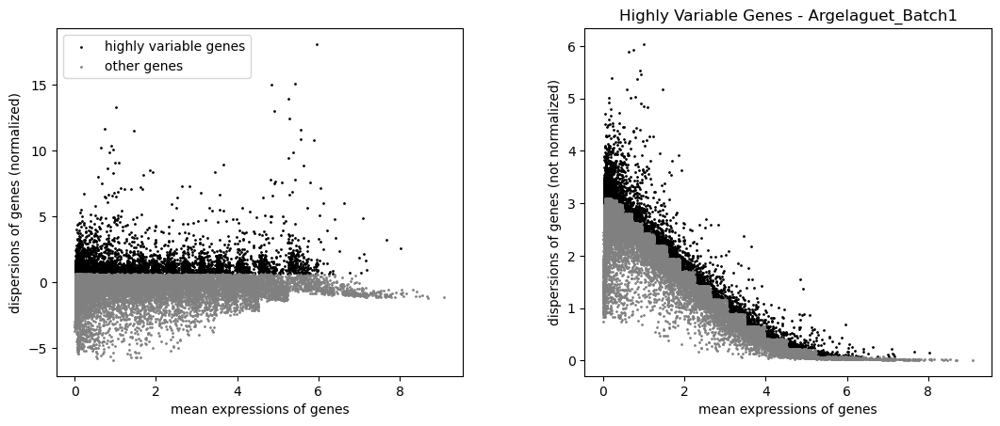


Number of highly variable genes in Pijuan-Sala_Batch1: 4000


<Figure size 640x480 with 0 Axes>

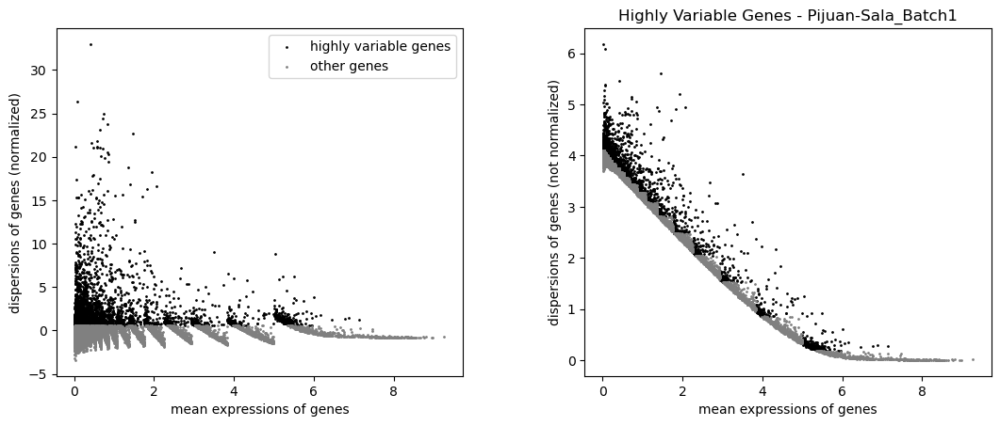


Number of highly variable genes in Pijuan-Sala_Batch2: 4000


<Figure size 640x480 with 0 Axes>

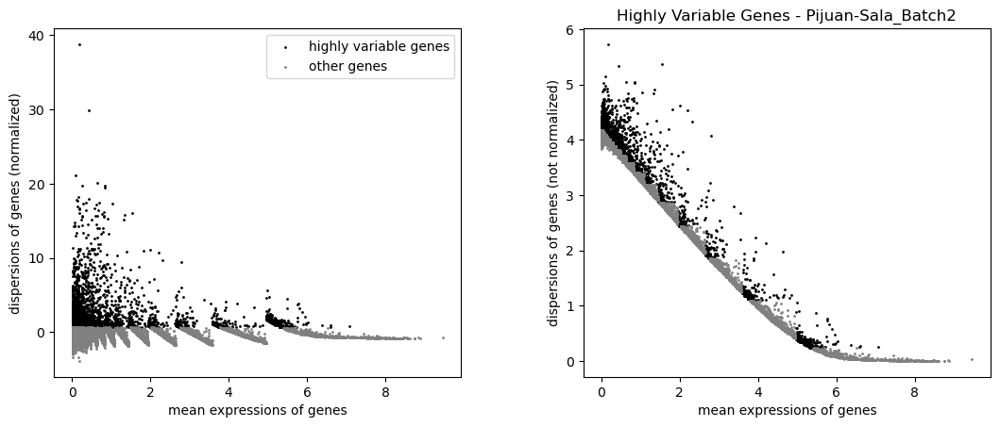

In [47]:
# Function to extract highly variable genes, print their number, display, and save the plot
def extract_hvgs(adata, flavor='cell_ranger', n_top_genes=4000, dataset_name=""):
    """
    Extract highly variable genes, print their count, display the plot in Jupyter, and save it as PNG.
    
    Parameters:
        adata: AnnData object with normalized and batch-corrected data.
        flavor: Method for HVG selection (default: 'cell_ranger').
        n_top_genes: Number of top highly variable genes to select (default: 4000).
        dataset_name: Name of the dataset for plot title and file naming (default: "").
    
    Returns:
        adata: AnnData object with HVG information.
    """
    # Compute highly variable genes
    sc.pp.highly_variable_genes(adata, flavor=flavor, n_top_genes=n_top_genes)
    
    # Print number of highly variable genes
    n_hvgs = np.sum(adata.var['highly_variable'])
    print(f"\nNumber of highly variable genes in {dataset_name}: {n_hvgs:d}")
    
    # Create a new figure for the plot
    plt.figure()
    # Generate the plot without displaying it yet
    sc.pl.highly_variable_genes(adata, show=False)
    # Add title
    plt.title(f"Highly Variable Genes - {dataset_name}")
    # Save the plot as PNG before displaying
    plt.savefig(os.path.join(figures_dir, f"hvg_plot_{dataset_name}.png"), bbox_inches='tight')
    # Display the plot in Jupyter
    plt.show()
    # Close the figure to free memory
    plt.close()
    
    return adata

# Apply HVG extraction to each dataset

adata_arg_hvg = extract_hvgs(adata_arg_norm, dataset_name="Argelaguet_Batch1")
adata_pj1_hvg = extract_hvgs(adata_pj1_norm, dataset_name="Pijuan-Sala_Batch1")
adata_pj2_hvg = extract_hvgs(adata_pj2_norm, dataset_name="Pijuan-Sala_Batch2")

The plots illustrate the selection of highly variable genes (HVGs) for each dataset (Argelaguet Batch 1, Pijuan-Sala Batch 1, and Pijuan-Sala Batch 2) using the `cell_ranger` method. Genes are ranked by their normalized dispersion (variance divided by mean expression), and the top 4,000 genes with the highest dispersion are selected as HVGs, highlighted in black. This approach ensures that variability is assessed independently of mean expression by binning genes and selecting the most variable ones within each bin.

HVG annotations are stored in `adata.var['highly_variable']`. After this step, each dataset contains:
- Batch-corrected, log-normalized data in `adata.X`.
- HVG annotations in `adata.var['highly_variable']`.

These HVGs will be used for downstream clustering and trajectory analysis.

#### Comments on Differences Between Datasets
- **Developmental Stages**: Argelaguet Batch 1 covers earlier stages (E4.5 to E7.5), capturing the exit from pluripotency to lineage specification, while Pijuan-Sala batches focus on E6.5 and E7.5, representing early gastrulation. This difference may lead to distinct gene expression profiles.
- **Total mRNA Counts**: The distribution plot shows that Argelaguet Batch 1 has a lower median count compared to Pijuan-Sala batches, possibly due to differences in sequencing depth, cell capture efficiency, or the biological state of earlier-stage cells (e.g., lower transcriptional activity). Pijuan-Sala Batch 1 and Batch 2 have similar distributions, but Batch 2 has a slightly higher median, which might reflect technical variability between batches.
- **Implications**: These differences highlight the need for batch correction (to be performed with scVI) to ensure that observed differences in downstream analyses reflect biological variation rather than technical artifacts.

## Part 2. Exploratory Data Analysis (EDA)

Perform dimensionality reduction and visualize the data.

Visualizing single-cell RNA sequencing (scRNA-seq) data involves projecting the high-dimensional matrix of cells and genes into a lower-dimensional space, typically a two-dimensional graph, where each cell is meaningfully represented. However, visualization methods for scRNA-seq data vary, as each defines 'meaningful' differently, making it an active area of research. It’s beneficial to explore multiple visualization techniques to determine which best captures the data’s relevant aspects for the investigation.

Historically, t-SNE has been widely used for scRNA-seq visualization, but the UMAP algorithm has recently gained favor for its ability to better preserve the data’s topology. In this analysis, we apply both PCA and UMAP to visualize the datasets.

We do not scale the genes to zero mean and unit variance before dimensionality reduction. By avoiding rescaling, genes with higher mean expression are given more weight in the process (despite correcting for mean offsets in PCA, due to the mean-variance relationship). We consider this weighting biologically relevant, as mean expression can reflect meaningful signals. However, scaling HVG expression is also a common practice, and numerous studies suggest that scaling does not negatively impact downstream scRNA-seq analysis.

In [48]:
# Function to optimize n_pcs and n_neighbors for each dataset
def optimize_parameters(adata, title, max_pcs=100, neighbor_range=[5, 10, 15, 20, 30, 50]):
    """
    Optimize the number of principal components (n_pcs) and neighbors (n_neighbors) for a dataset.
    Generate a knee plot for PCA and test different n_neighbors values using UMAP and silhouette scores.
    
    Parameters:
        adata: AnnData object with normalized (but not batch-corrected) and HVG data.
        title: Title prefix for the plots (e.g., dataset name).
        max_pcs: Maximum number of principal components to test (default: 100).
        neighbor_range: List of n_neighbors values to test (default: [5, 10, 15, 20, 30, 50]).
    
    Returns:
        tuple: (optimal_n_pcs, optimal_n_neighbors)
    """
    # Step 1: Knee Plot for PCA to choose n_pcs
    # Ensure max_pcs does not exceed min(n_samples, n_features)
    n_samples, n_features = adata.X.shape
    max_pcs = min(max_pcs, n_samples, n_features)
    print(f"Dataset shape for {title}: {adata.X.shape} (n_samples={n_samples}, n_features={n_features})")
    print(f"Adjusted max_pcs for PCA: {max_pcs}")
    
    # Check total variance in the data
    if sp.issparse(adata.X):
        total_variance = np.var(adata.X.toarray(), axis=0).sum()
    else:
        total_variance = np.var(adata.X, axis=0).sum()
    print(f"Total variance in data for {title}: {total_variance:.4f}")
    if total_variance < 1e-6:
        print(f"Warning: Very low variance in data for {title}. Check preprocessing steps.")
        return 10, 15  # Default values
    
    # Check for label availability and variability
    if 'celltype' not in adata.obs:
        print(f"Warning: 'celltype' labels not found in {title}. Cannot compute silhouette scores. Using default parameters.")
        return 10, 15
    
    unique_celltypes = adata.obs['celltype'].nunique()
    if unique_celltypes <= 1:
        print(f"Warning: 'celltype' labels have insufficient variability ({unique_celltypes} unique values) in {title}. Using default parameters.")
        return 10, 15
    
    sc.tl.pca(adata, n_comps=max_pcs, use_highly_variable=True, svd_solver='arpack')
    
    # Plot explained variance ratio
    fig, ax = plt.subplots(figsize=(8, 5))
    explained_variance_ratio = adata.uns['pca']['variance_ratio']
    cumulative_variance = np.cumsum(explained_variance_ratio)
    
    ax.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, label='Explained Variance Ratio', color='blue')
    ax.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, label='Cumulative Variance', color='orange')
    ax.set_xlabel('Number of Principal Components')
    ax.set_ylabel('Variance Ratio')
    ax.set_title(f'PCA Knee Plot - {title}')
    ax.legend()
    ax.grid(True)
    
    # Save and display the knee plot
    plt.savefig(os.path.join(figures_dir, f"{title}_pca_knee_plot.png"), bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()
    
    # Choose n_pcs based on cumulative variance (e.g., where it reaches ~70%)
    target_variance = 0.7
    optimal_n_pcs = np.argmax(cumulative_variance >= target_variance) + 1
    # Ensure optimal_n_pcs is within bounds and at least 2 for t-SNE compatibility
    optimal_n_pcs = min(max(optimal_n_pcs, 2), max_pcs)
    print(f"Optimal n_pcs for {title}: {optimal_n_pcs} (explains {cumulative_variance[optimal_n_pcs-1]*100:.2f}% variance)")
    
    # Step 2: Test different n_neighbors values using UMAP and silhouette scores
    silhouette_scores = []
    for n_neighbors in neighbor_range:
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=optimal_n_pcs)
        sc.tl.umap(adata)
        
        # Compute silhouette score based on celltype clusters in UMAP space
        umap_embedding = adata.obsm['X_umap']
        labels = adata.obs['celltype'].astype('category').cat.codes
        score = silhouette_score(umap_embedding, labels)
        silhouette_scores.append(score)
        print(f"n_neighbors={n_neighbors}, Silhouette Score={score:.3f}")
    
    # Plot silhouette scores
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.plot(neighbor_range, silhouette_scores, marker='o')
    ax.set_xlabel('Number of Neighbors (n_neighbors)')
    ax.set_ylabel('Silhouette Score')
    ax.set_title(f'Silhouette Scores for UMAP - {title}')
    ax.grid(True)
    
    # Save and display the silhouette plot
    plt.savefig(os.path.join(figures_dir, f"{title}_umap_silhouette_plot.png"), bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()
    
    # Choose n_neighbors with the highest silhouette score
    # Check if silhouette scores are constant to avoid NaN issues
    if max(silhouette_scores) == min(silhouette_scores):
        print(f"Warning: Silhouette scores are constant ({max(silhouette_scores):.3f}) for {title}. Defaulting to n_neighbors=15.")
        optimal_n_neighbors = 15
    else:
        optimal_n_neighbors = neighbor_range[np.argmax(silhouette_scores)]
        if max(silhouette_scores) < 0:
            print(f"Warning: All silhouette scores are negative for {title}. Defaulting to n_neighbors=15.")
            optimal_n_neighbors = 15
    print(f"Optimal n_neighbors for {title}: {optimal_n_neighbors} (Silhouette Score={max(silhouette_scores):.3f})")
    
    return optimal_n_pcs, optimal_n_neighbors

Dataset shape for Argelaguet Batch 1: (2204, 15799) (n_samples=2204, n_features=15799)
Adjusted max_pcs for PCA: 100
Total variance in data for Argelaguet Batch 1: 24740.8122


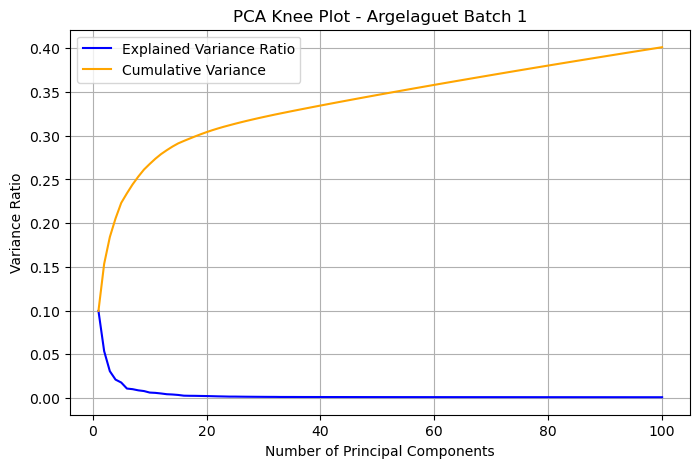

Optimal n_pcs for Argelaguet Batch 1: 2 (explains 15.34% variance)
n_neighbors=5, Silhouette Score=0.191
n_neighbors=10, Silhouette Score=0.205
n_neighbors=15, Silhouette Score=0.196
n_neighbors=20, Silhouette Score=0.213
n_neighbors=30, Silhouette Score=0.199
n_neighbors=50, Silhouette Score=0.225


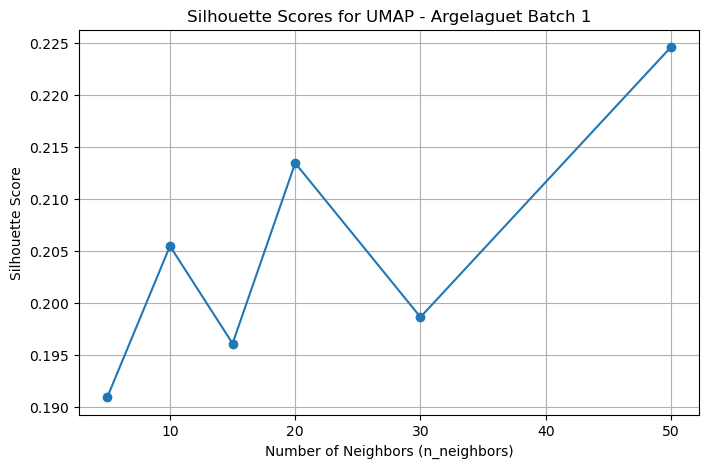

Optimal n_neighbors for Argelaguet Batch 1: 50 (Silhouette Score=0.225)
Dataset shape for Argelaguet Batch 1: (2204, 15799) (n_samples=2204, n_features=15799)

Cluster sizes for Argelaguet Batch 1 (resolution 0.5):
louvain_r0.5
0    527
1    428
2    354
3    292
4    267
5    125
6    114
7     97
Name: count, dtype: int64

Cluster sizes for Argelaguet Batch 1 (resolution 1.0):
louvain_r1.0
0     343
1     267
2     246
3     238
4     232
5     206
6     191
7     145
8     125
9     114
10     97
Name: count, dtype: int64


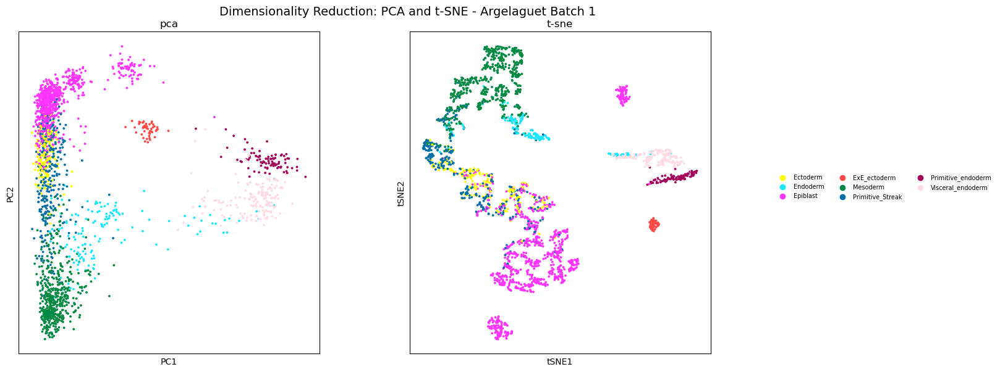

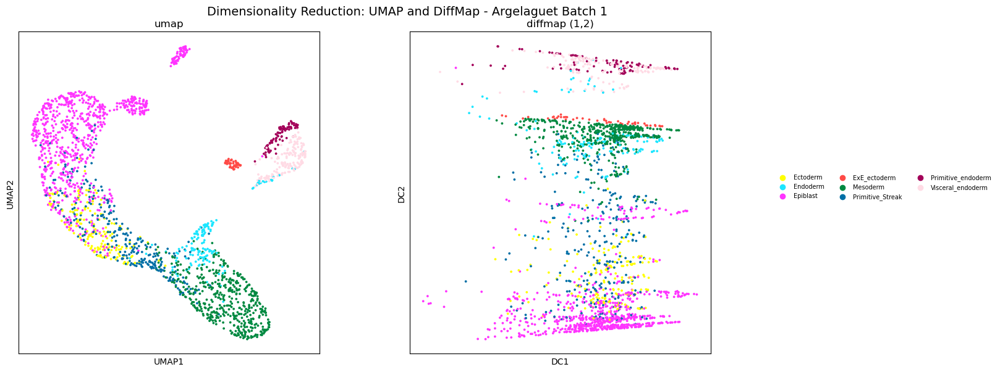

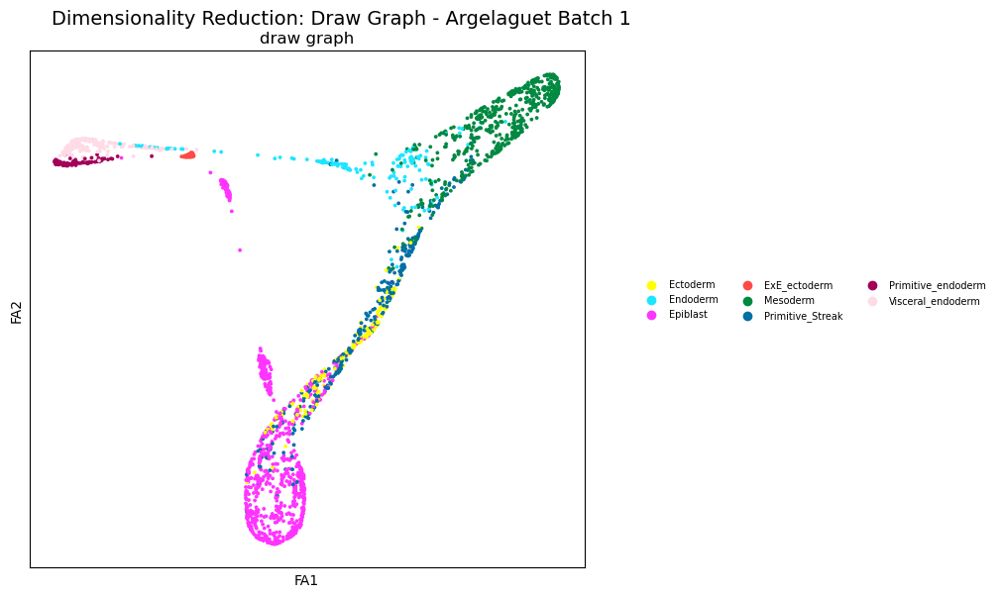

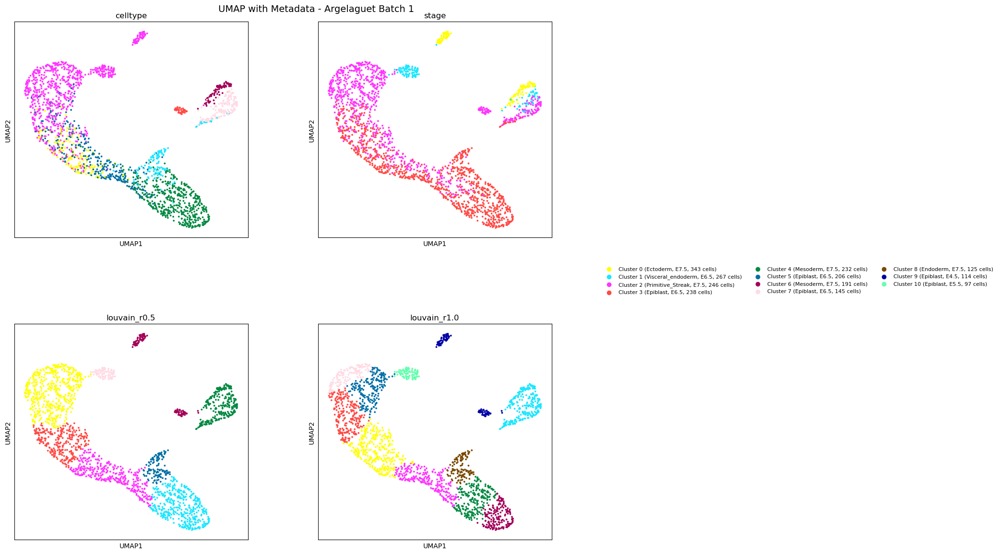

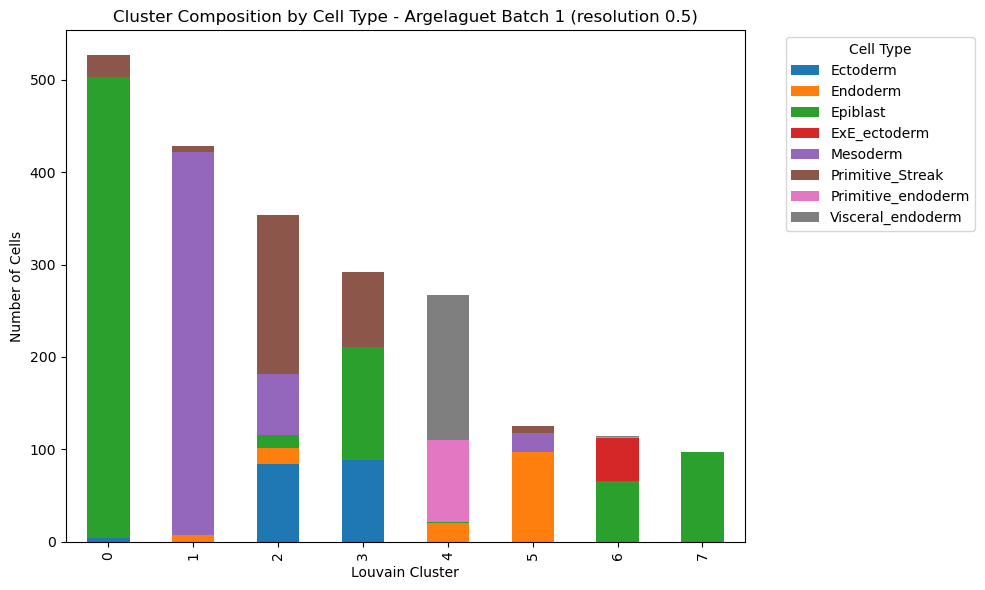

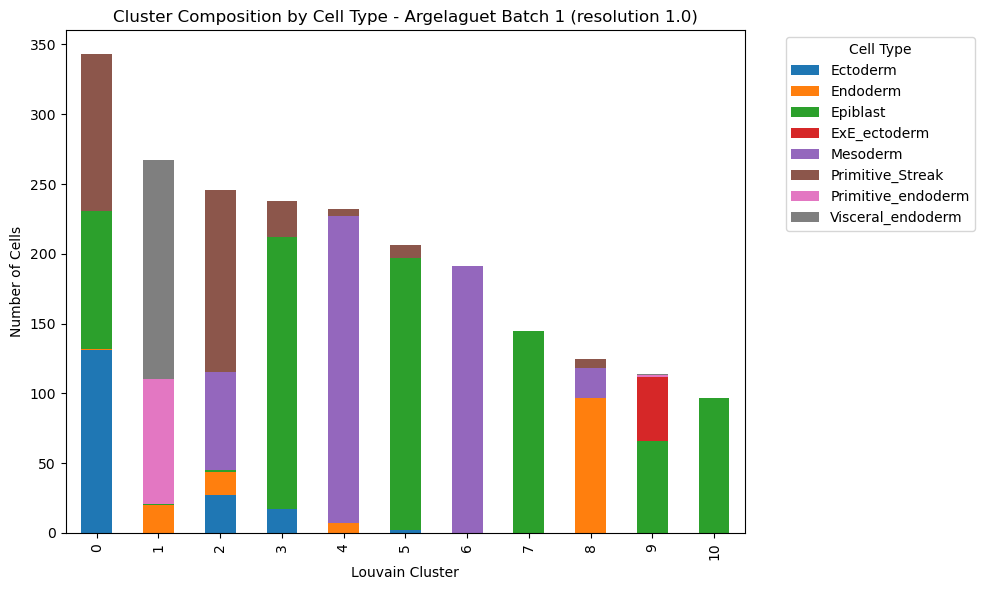

Dataset shape for Pijuan-Sala Batch 1: (4604, 13899) (n_samples=4604, n_features=13899)
Adjusted max_pcs for PCA: 100
Total variance in data for Pijuan-Sala Batch 1: 28326.8143


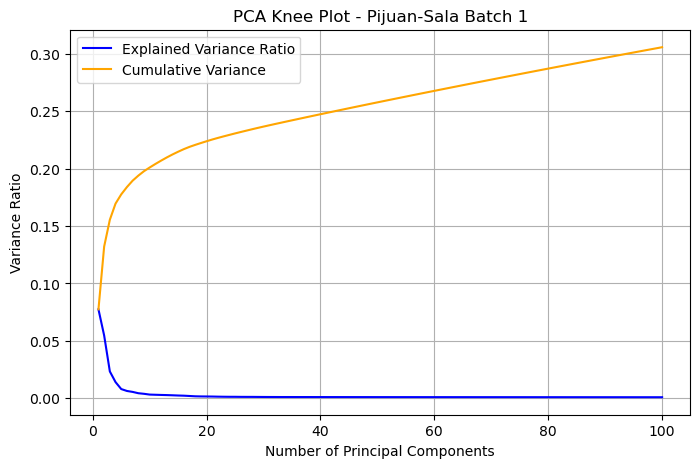

Optimal n_pcs for Pijuan-Sala Batch 1: 2 (explains 13.21% variance)
n_neighbors=5, Silhouette Score=-0.068
n_neighbors=10, Silhouette Score=0.044
n_neighbors=15, Silhouette Score=0.075
n_neighbors=20, Silhouette Score=0.087
n_neighbors=30, Silhouette Score=0.098
n_neighbors=50, Silhouette Score=0.141


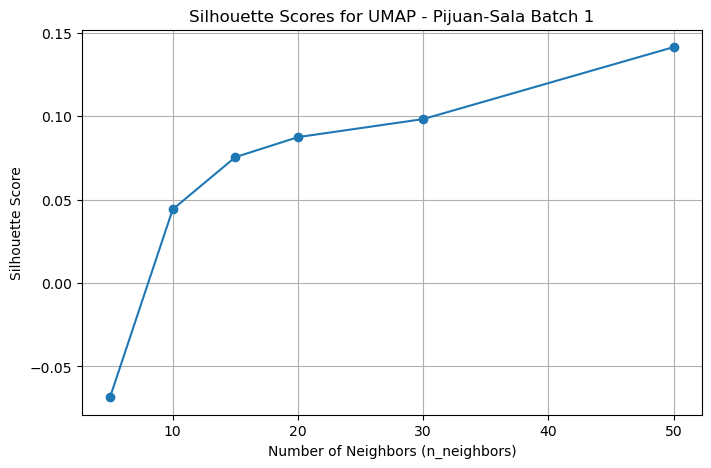

Optimal n_neighbors for Pijuan-Sala Batch 1: 50 (Silhouette Score=0.141)
Dataset shape for Pijuan-Sala Batch 1: (4604, 13899) (n_samples=4604, n_features=13899)

Cluster sizes for Pijuan-Sala Batch 1 (resolution 0.5):
louvain_r0.5
0    823
1    676
2    650
3    622
4    604
5    555
6    535
7    139
Name: count, dtype: int64

Cluster sizes for Pijuan-Sala Batch 1 (resolution 1.0):
louvain_r1.0
0     478
1     435
2     432
3     421
4     381
5     381
6     343
7     339
8     312
9     285
10    243
11    215
12    200
13    139
Name: count, dtype: int64


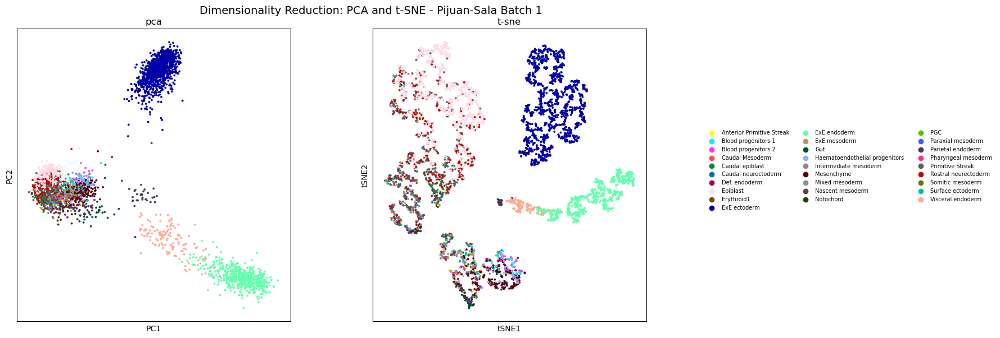

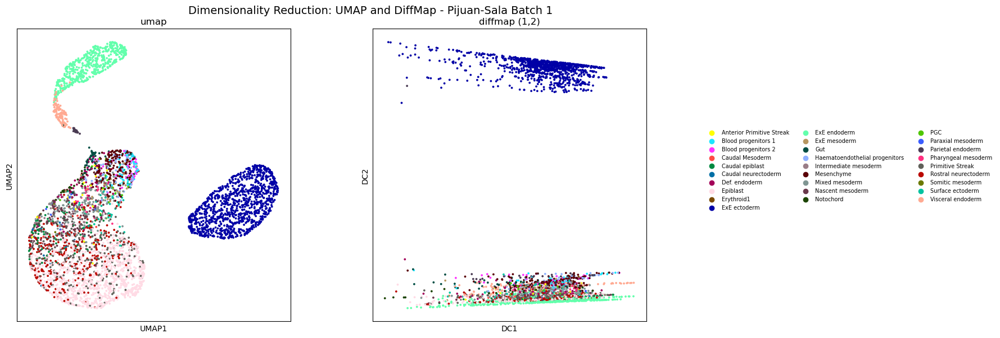

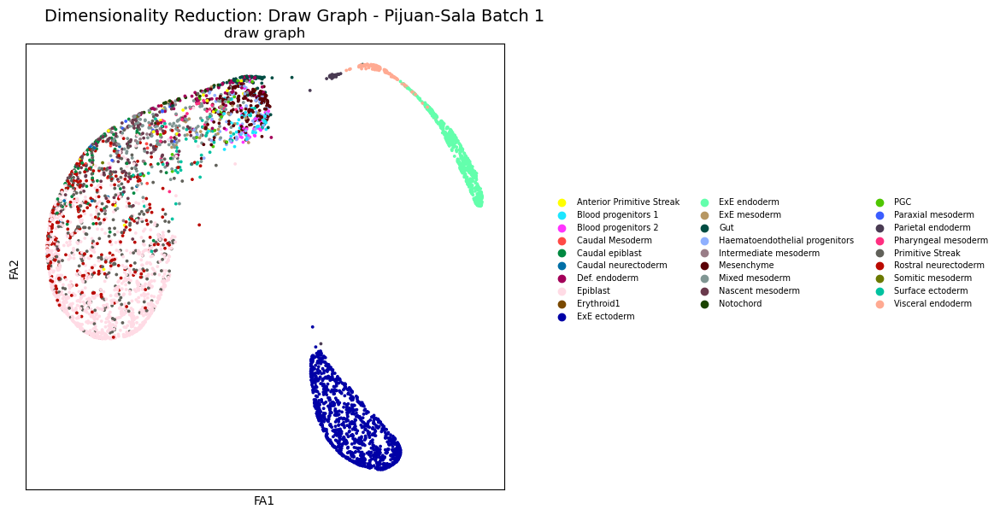

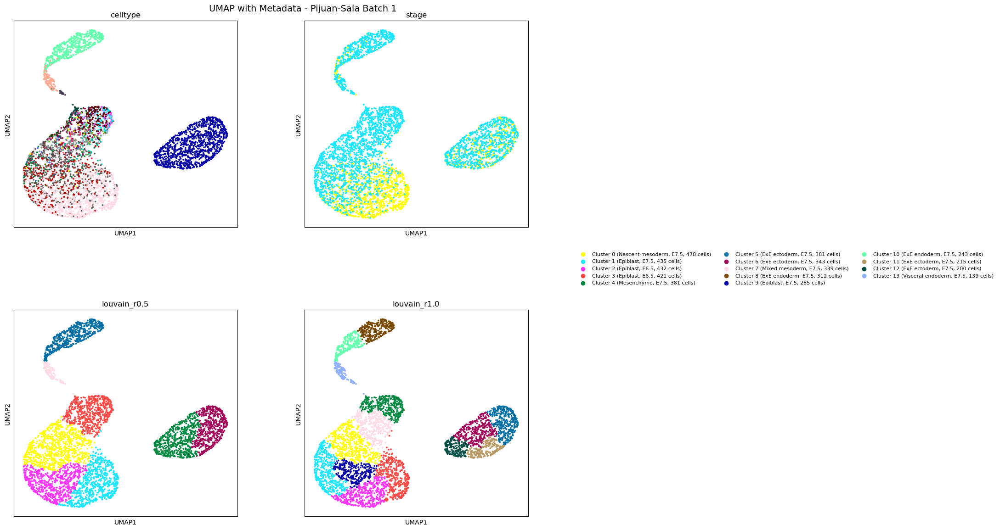

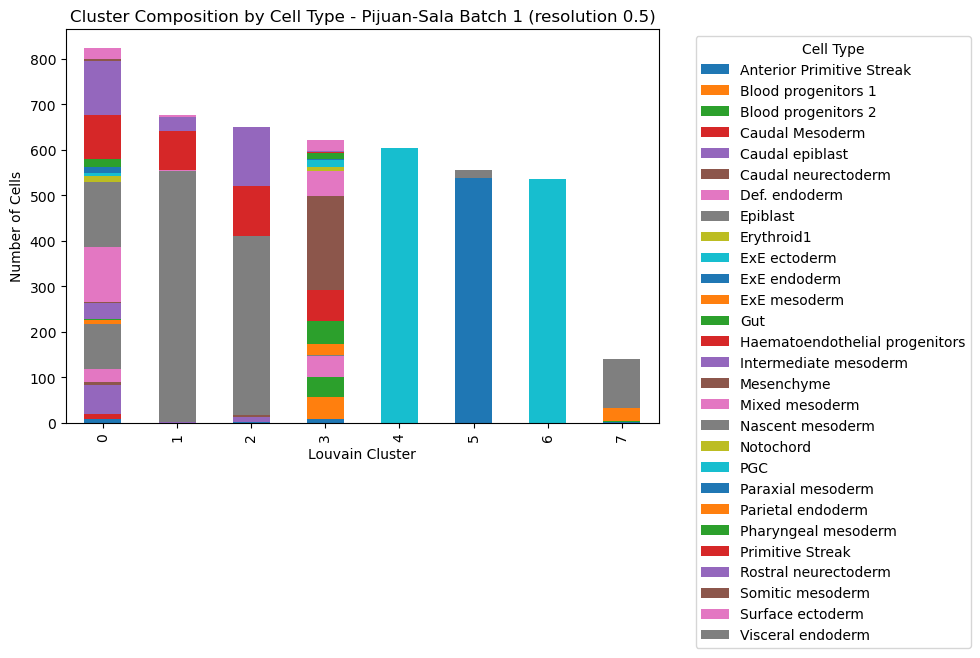

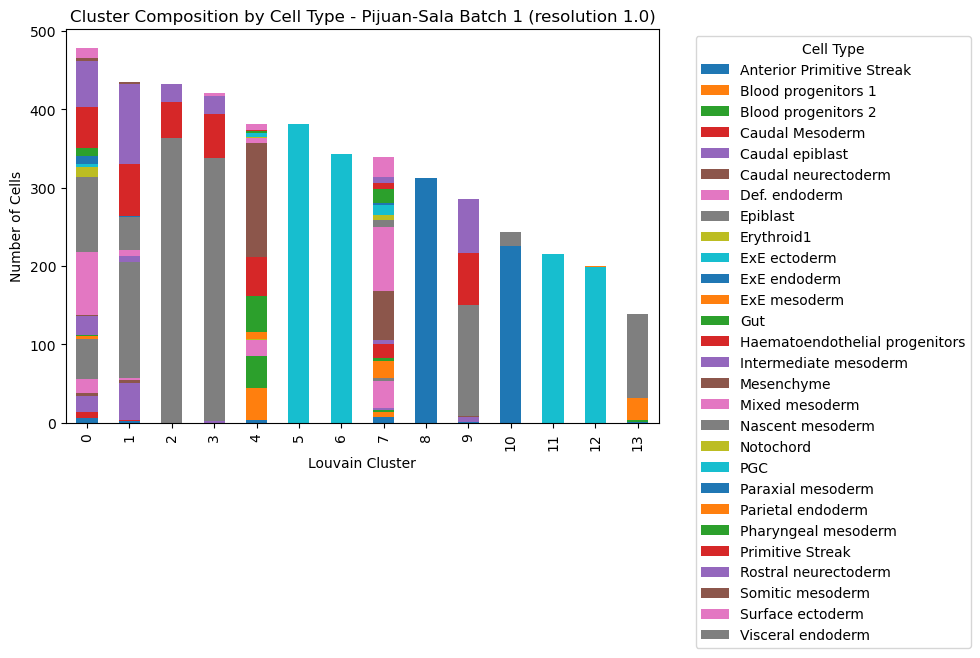

Dataset shape for Pijuan-Sala Batch 2: (8861, 14831) (n_samples=8861, n_features=14831)
Adjusted max_pcs for PCA: 100
Total variance in data for Pijuan-Sala Batch 2: 27944.1959


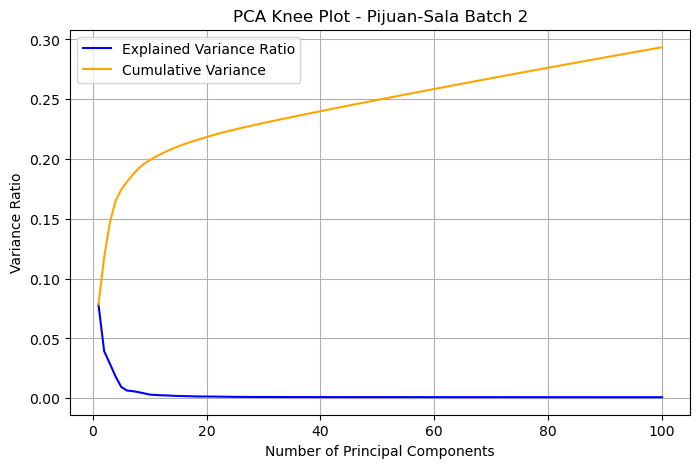

Optimal n_pcs for Pijuan-Sala Batch 2: 2 (explains 11.78% variance)
n_neighbors=5, Silhouette Score=-0.157
n_neighbors=10, Silhouette Score=-0.025
n_neighbors=15, Silhouette Score=-0.000
n_neighbors=20, Silhouette Score=0.017
n_neighbors=30, Silhouette Score=0.014
n_neighbors=50, Silhouette Score=0.060


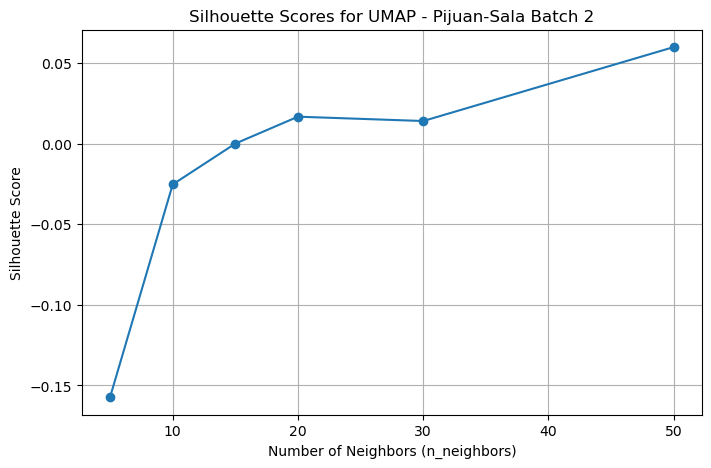

Optimal n_neighbors for Pijuan-Sala Batch 2: 50 (Silhouette Score=0.060)
Dataset shape for Pijuan-Sala Batch 2: (8861, 14831) (n_samples=8861, n_features=14831)

Cluster sizes for Pijuan-Sala Batch 2 (resolution 0.5):
louvain_r0.5
0     1418
1     1084
2     1078
3      962
4      814
5      795
6      728
7      689
8      656
9      506
10     131
Name: count, dtype: int64

Cluster sizes for Pijuan-Sala Batch 2 (resolution 1.0):
louvain_r1.0
0     746
1     728
2     689
3     672
4     656
5     542
6     536
7     527
8     486
9     479
10    478
11    476
12    476
13    454
14    395
15    390
16    131
Name: count, dtype: int64


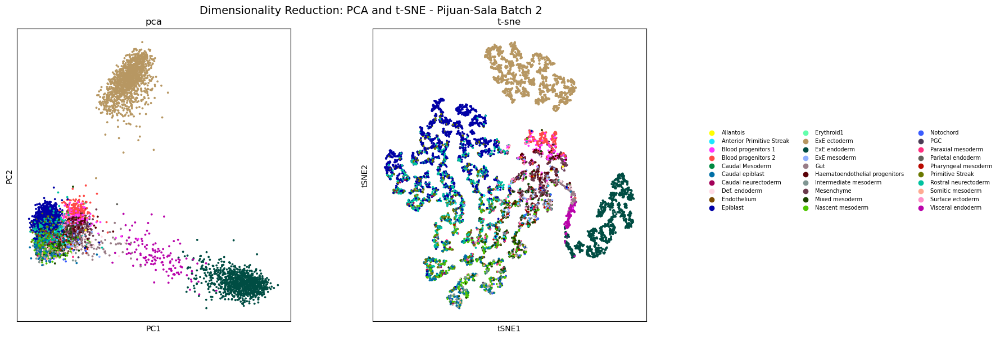

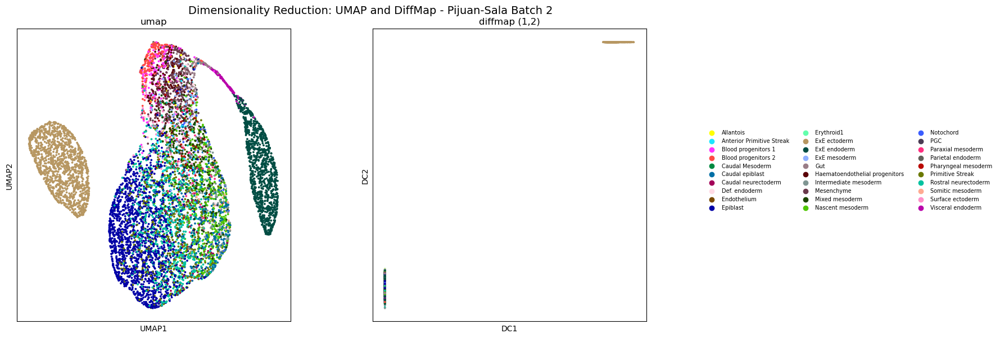

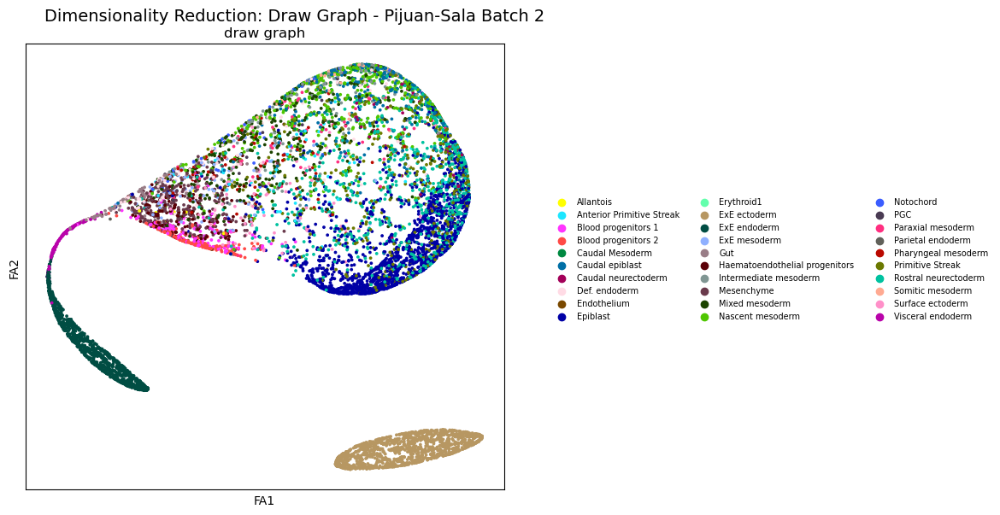

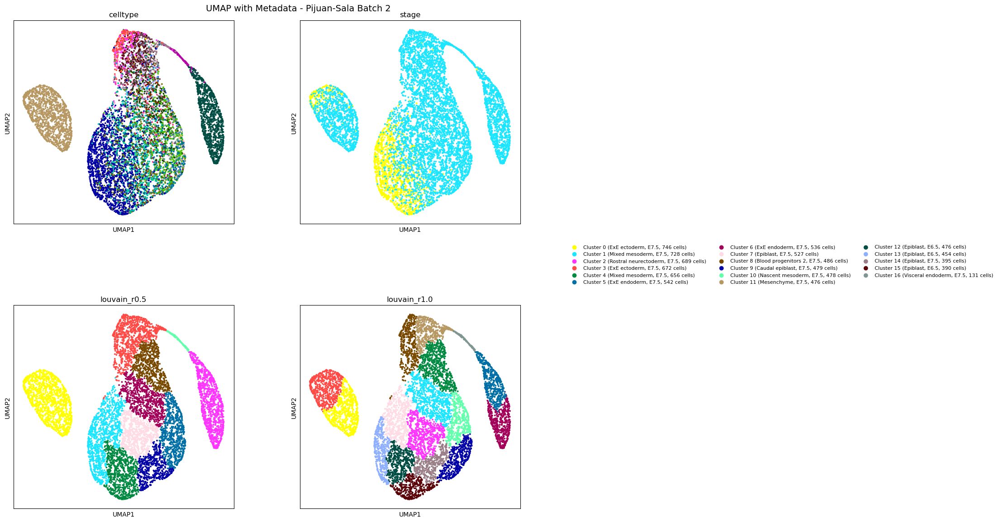

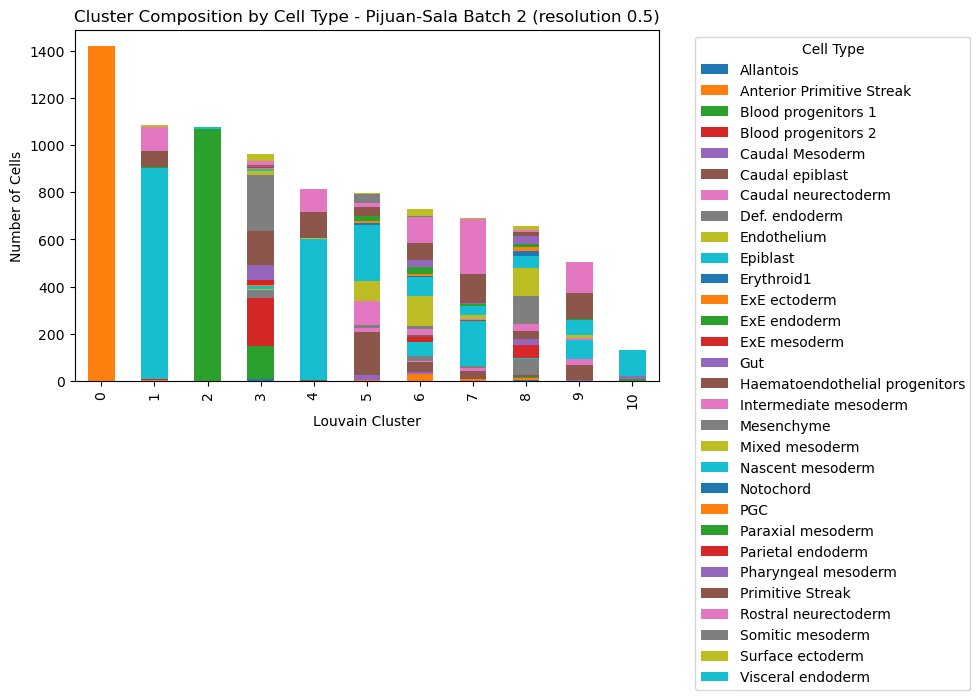

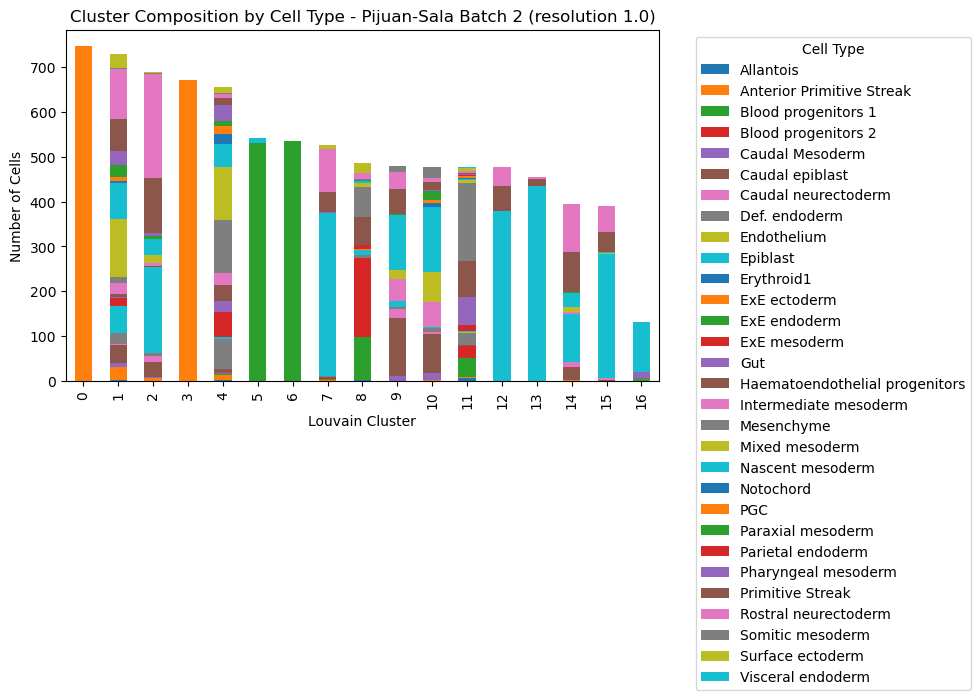

In [49]:
# Function for EDA with multiple dimensionality reduction techniques, split into pairs
def perform_eda(adata, title, n_pcs=None, n_neighbors=None, marker_size=30):
    """
    Perform exploratory data analysis using multiple dimensionality reduction techniques,
    split into pairs of plots with shared legends on the right, display them in Jupyter, and save as PNG files.
    
    Parameters:
        adata: AnnData object with normalized (but not batch-corrected) and HVG data.
        title: Title prefix for the plots (e.g., dataset name).
        n_pcs: Number of principal components to use (default: None, will be optimized).
        n_neighbors: Number of neighbors for the neighborhood graph (default: None, will be optimized).
        marker_size: Size of markers in scatter plots (default: 30).
    
    Returns:
        adata: AnnData object with computed embeddings and Louvain clusters.
    """
    # Optimize n_pcs and n_neighbors if not provided
    if n_pcs is None or n_neighbors is None:
        optimal_n_pcs, optimal_n_neighbors = optimize_parameters(adata, title)
        n_pcs = n_pcs if n_pcs is not None else optimal_n_pcs
        n_neighbors = n_neighbors if n_neighbors is not None else optimal_n_neighbors
    
    # Check data dimensions before proceeding
    n_samples, n_features = adata.X.shape
    print(f"Dataset shape for {title}: {adata.X.shape} (n_samples={n_samples}, n_features={n_features})")
    if n_features < 2:
        print(f"Warning: Only {n_features} features available. Using random initialization for t-SNE.")
    
    # Compute embeddings with optimized parameters
    sc.tl.pca(adata, n_comps=n_pcs, use_highly_variable=True, svd_solver='arpack')
    sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs)
    
    # Use random initialization for t-SNE if n_features < 2 or n_pcs < 2
    if n_features >= 2 and n_pcs >= 2:
        sc.tl.tsne(adata, n_jobs=12)  # t-SNE (multicore if available)
    else:
        sc.tl.tsne(adata, n_jobs=12, init='random')
    
    sc.tl.umap(adata)  # UMAP
    sc.tl.diffmap(adata)  # Diffusion Maps
    sc.tl.draw_graph(adata)  # Force-directed graph drawing
    
    # Perform Louvain clustering at multiple resolutions
    resolutions = [0.5, 1.0]
    for res in resolutions:
        sc.tl.louvain(adata, resolution=res, key_added=f'louvain_r{res}')
        print(f"\nCluster sizes for {title} (resolution {res}):")
        print(adata.obs[f'louvain_r{res}'].value_counts())
    
    # Define a color palette with enough colors for all categories
    palette = sc.pl.palettes.default_102
    
    # Annotate Louvain clusters with dominant cell types, stages, and cluster sizes
    cluster_annotations = {}
    for res in resolutions:
        cluster_col = f'louvain_r{res}'
        cluster_annotations[cluster_col] = {}
        # Get cluster sizes
        cluster_sizes = adata.obs[cluster_col].value_counts()
        # Group by cluster and compute the dominant celltype and stage
        for cluster in adata.obs[cluster_col].unique():
            cluster_cells = adata.obs[adata.obs[cluster_col] == cluster]
            dominant_celltype = cluster_cells['celltype'].mode()[0]
            dominant_stage = cluster_cells['stage'].mode()[0]
            cluster_size = cluster_sizes[cluster]
            # Store the annotation as "Cluster X (Celltype, Stage, N cells)"
            cluster_annotations[cluster_col][cluster] = f"Cluster {cluster} ({dominant_celltype}, {dominant_stage}, {cluster_size} cells)"
    
    # Plotting categories (metadata to visualize, now including Louvain clusters)
    plot_categories = ['celltype', 'stage', 'louvain_r0.5', 'louvain_r1.0']
    
    # Figure 1: PCA and t-SNE
    fig1, axes1 = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=False)
    fig1.suptitle(f"Dimensionality Reduction: PCA and t-SNE - {title}", fontsize=14, y=0.99)
    axes1 = axes1.flatten()
    
    sc.pl.pca(adata, color='celltype', title="pca", show=False, ax=axes1[0], legend_loc=None, size=marker_size, palette=palette)
    if n_features >= 2 and n_pcs >= 2:
        sc.pl.tsne(adata, color='celltype', title="t-sne", show=False, ax=axes1[1], legend_loc='center left', size=marker_size, palette=palette)
    else:
        sc.pl.tsne(adata, color='celltype', title="t-sne (random init)", show=False, ax=axes1[1], legend_loc='center left', size=marker_size, palette=palette)
    
    # Add shared legend on the right for Figure 1
    handles, labels = axes1[1].get_legend_handles_labels()
    axes1[1].get_legend().remove()
    fig1.legend(handles, labels, loc='center left', bbox_to_anchor=(0.92, 0.5), fontsize=7, ncol=3, frameon=False)
    
    plt.subplots_adjust(left=0.05, right=0.85, top=0.92, bottom=0.05, wspace=0.3)
    plt.savefig(os.path.join(figures_dir, f"{title}_dim_reduction_pca_tsne.png"), bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()
    
    # Figure 2: UMAP and DiffMap
    fig2, axes2 = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=False)
    fig2.suptitle(f"Dimensionality Reduction: UMAP and DiffMap - {title}", fontsize=14, y=0.99)
    axes2 = axes2.flatten()
    
    sc.pl.umap(adata, color='celltype', title="umap", show=False, ax=axes2[0], legend_loc=None, size=marker_size, palette=palette)
    sc.pl.diffmap(adata, color='celltype', components=['1,2'], title="diffmap (1,2)", show=False, ax=axes2[1], legend_loc='center left', size=marker_size, palette=palette)
    
    # Add shared legend on the right for Figure 2
    handles, labels = axes2[1].get_legend_handles_labels()
    axes2[1].get_legend().remove()
    fig2.legend(handles, labels, loc='center left', bbox_to_anchor=(0.92, 0.5), fontsize=7, ncol=3, frameon=False)
    
    plt.subplots_adjust(left=0.05, right=0.85, top=0.92, bottom=0.05, wspace=0.3)
    plt.savefig(os.path.join(figures_dir, f"{title}_dim_reduction_umap_diffmap.png"), bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()
    
    # Figure 3: Draw Graph (solo)
    fig3, ax3 = plt.subplots(1, 1, figsize=(7, 6), constrained_layout=False)
    fig3.suptitle(f"Dimensionality Reduction: Draw Graph - {title}", fontsize=14, y=0.99)
    
    sc.pl.draw_graph(adata, color='celltype', title="draw graph", show=False, ax=ax3, legend_loc='center left', size=marker_size, palette=palette)
    
    # Add legend on the right for Figure 3
    handles, labels = ax3.get_legend_handles_labels()
    ax3.get_legend().remove()
    fig3.legend(handles, labels, loc='center left', bbox_to_anchor=(0.92, 0.5), fontsize=7, ncol=3, frameon=False)
    
    plt.subplots_adjust(left=0.05, right=0.85, top=0.92, bottom=0.05)
    plt.savefig(os.path.join(figures_dir, f"{title}_dim_reduction_draw_graph.png"), bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()
    
    # Figure 4: UMAP with multiple covariates (celltype, stage, louvain clusters)
    fig4, axes4 = plt.subplots(2, 2, figsize=(14, 12), constrained_layout=False)
    fig4.suptitle(f"UMAP with Metadata - {title}", fontsize=14, y=0.98)
    axes4 = axes4.flatten()
    
    for i, category in enumerate(plot_categories):
        if category.startswith('louvain'):
            # Create a temporary mapping for legend labels
            legend_labels = {str(k): v for k, v in cluster_annotations[category].items()}
            sc.pl.umap(adata, color=category, title=category, show=False, ax=axes4[i], legend_loc='center left', size=marker_size, palette=palette, groups=legend_labels.keys())
            # Update the legend labels
            handles, labels = axes4[i].get_legend_handles_labels()
            new_labels = [legend_labels.get(label, label) for label in labels]
            axes4[i].get_legend().remove()
            if i == len(plot_categories) - 1:  # Add legend only for the last plot
                # Adjust ncol based on the number of clusters to reduce clutter
                num_clusters = len(new_labels)
                ncol = min(3, max(1, num_clusters // 5 + 1))  # Adjust columns based on number of clusters
                fig4.legend(handles, new_labels, loc='center left', bbox_to_anchor=(0.92, 0.5), fontsize=8, ncol=ncol, frameon=False)
        else:
            sc.pl.umap(adata, color=category, title=category, show=False, ax=axes4[i], legend_loc='center left', size=marker_size, palette=palette)
            if i < len(plot_categories) - 1:  # Remove legend for all but the last plot
                axes4[i].get_legend().remove()
    
    plt.subplots_adjust(left=0.05, right=0.85, top=0.95, bottom=0.05, wspace=0.3, hspace=0.4)
    plt.savefig(os.path.join(figures_dir, f"{title}_umap_metadata.png"), bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()

    # Add a stacked bar plot for cluster composition
    for res in resolutions:
        cluster_col = f'louvain_r{res}'
        # Compute the composition of each cluster
        composition = adata.obs.groupby([cluster_col, 'celltype']).size().unstack(fill_value=0)
        
        # Plot stacked bar chart
        fig, ax = plt.subplots(figsize=(10, 6))
        composition.plot(kind='bar', stacked=True, ax=ax)
        ax.set_xlabel('Louvain Cluster')
        ax.set_ylabel('Number of Cells')
        ax.set_title(f'Cluster Composition by Cell Type - {title} (resolution {res})')
        plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.savefig(os.path.join(figures_dir, f"{title}_cluster_composition_{cluster_col}.png"), bbox_inches='tight', dpi=300)
        plt.show()
        plt.close()
    
    return adata

# Perform parameter optimization and EDA for each dataset
# Note: This assumes adata_arg_hvg, adata_pj1_hvg, and adata_pj2_hvg are the normalized (but not batch-corrected) AnnData objects
adata_arg_hvg = perform_eda(adata_arg_hvg, 'Argelaguet Batch 1')
adata_pj1_hvg = perform_eda(adata_pj1_hvg, 'Pijuan-Sala Batch 1')
adata_pj2_hvg = perform_eda(adata_pj2_hvg, 'Pijuan-Sala Batch 2')

## Dimensionality Reduction Visualizations

**PCA:**

- Displays a spread of cells without clear clustering in two dimensions across all datasets.
- The first principal component likely captures variation in count depth or major cell type differences, but the low explained variance (11-15% for 2 PCs) limits its informativeness.

**t-SNE:**

- For Argelaguet Batch 1, shows distinct clusters with some subcluster structure (e.g., "Ectoderm", "Primitive_endoderm"), but connections between clusters are not clear.
- For Pijuan-Sala Batch 1 and Batch 2, clusters are less distinct with significant overlap, making substructure and connections difficult to interpret.

**UMAP:**

- Across all datasets, reveals a central cluster with several outer clusters (e.g., "Allantois", "Erythroid1").
- Connections between clusters are visible, suggesting potential developmental transitions, but the low silhouette scores (e.g., 0.040 for Batch 2) indicate limited alignment with cell type labels.

**Diffusion Maps:**

- Highlights linear trajectories along diffusion components (e.g., DC1), suggesting transitions between cell types.
- Clusters are less defined, with significant overlap, but trajectories are more apparent, especially in Pijuan-Sala datasets.

**Draw Graph:**

- Shows a central cluster with several outer clusters across all datasets.
- Connections from the central cluster to outer clusters are visible, indicating potential developmental trajectories (e.g., from stem-like cells to differentiated states).

The strengths and weaknesses of the visualizations are evident in the plots. t-SNE emphasizes cluster separation but struggles with connections, while Diffusion Maps highlight transitions at the expense of cluster clarity. UMAP and Draw Graph offer a compromise, showing both clusters and connections, but UMAP is faster to compute and generally preserves data structure better. However, the low explained variance in PCA and low silhouette scores suggest that the data might benefit from further preprocessing adjustments (e.g., increasing `n_pcs` or revisiting HVG selection) to enhance clustering quality in future studies.

## Discussion of Louvain Clusters

**Argelaguet Batch 1 (E4.5–E7.5)**:  
- **Resolution 0.5 (7 clusters)**: Captures major lineages—Epiblast (E4.5, pluripotent), Primitive Streak (E6.5, transitional), and germ layers (Mesoderm, Ectoderm, Endoderm at E7.5). Extra-embryonic clusters (Visceral Endoderm, Primitive Endoderm) reflect early divergence.  
- **Resolution 1.0 (9 clusters)**: Reveals heterogeneity within lineages (e.g., two Mesoderm clusters at E7.5) and extra-embryonic ExE Ectoderm, aligning with gastrulation progression from pluripotency to lineage specification.  

**Pijuan-Sala Batch 1 (E6.5–E7.5)**:  
- **Resolution 0.5 (11 clusters)**: Includes Epiblast, Primitive Streak, and germ layer derivatives (Nascent Mesoderm, Rostral Neurectoderm, Definitive Endoderm). Extra-embryonic (ExE Ectoderm, ExE Endoderm) and blood-related clusters (Haematoendothelial Progenitors, Blood Progenitors) indicate early hematopoiesis.  
- **Resolution 1.0 (14 clusters)**: Identifies finer subtypes (e.g., Surface Ectoderm, Visceral Endoderm), reflecting advanced differentiation at E7.5.  

**Pijuan-Sala Batch 2 (E6.5–E7.5)**:  
- **Resolution 0.5 (12 clusters)**: Similar to Batch 1, with Epiblast, Primitive Streak, germ layers, extra-embryonic, and blood-related clusters.  
- **Resolution 1.0 (19 clusters)**: Reveals rare cell types (Notochord, PGCs, Caudal Neurectoderm), highlighting posterior patterning and germ cell specification at E7.5.  

**Overall Insights**:  
- Clusters reflect gastrulation dynamics: pluripotent epiblast → Primitive Streak → germ layers and extra-embryonic tissues.  
- Higher resolutions uncover heterogeneity (e.g., mesodermal subtypes, rare cell types like Notochord).  
- Low silhouette scores (e.g., 0.040 for Batch 2) suggest overlap due to batch effects or continuous trajectories, to be addressed by scVI integration.

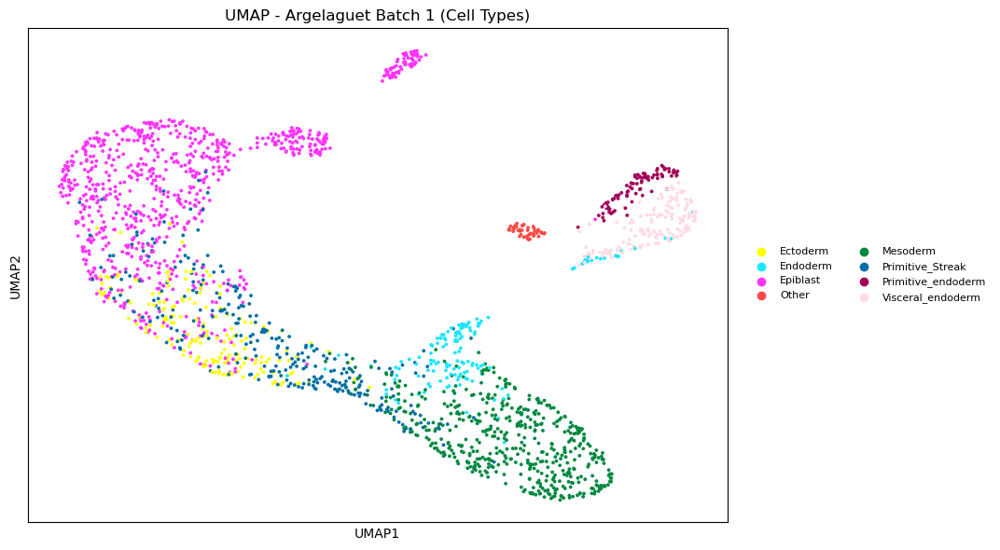

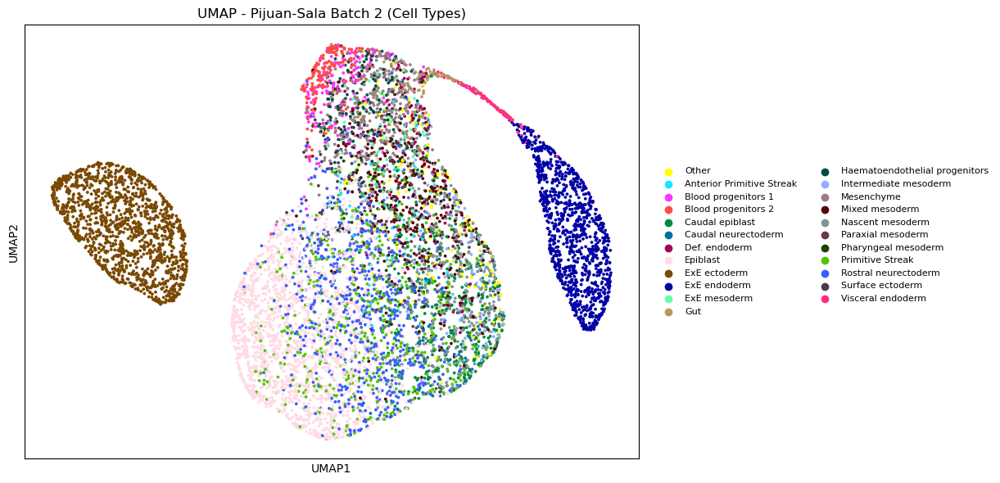

In [50]:
# Define the palette
palette = sc.pl.palettes.default_102

# Function to group rare cell types
def group_rare_celltypes(adata, threshold=50):
    celltype_counts = adata.obs['celltype'].value_counts()
    rare_celltypes = celltype_counts[celltype_counts < threshold].index
    adata.obs['celltype_grouped'] = adata.obs['celltype'].replace(rare_celltypes, 'Other')
    return adata

# Apply to datasets
adata_arg_hvg = group_rare_celltypes(adata_arg_hvg, threshold=50)
adata_pj2_hvg = group_rare_celltypes(adata_pj2_hvg, threshold=50)

# Plot UMAP with cell type for Argelaguet Batch 1
fig1, ax1 = plt.subplots(figsize=(8, 6))
sc.pl.umap(adata_arg_hvg, color='celltype_grouped', ax=ax1, show=False, size=30, palette=palette,
           title="UMAP - Argelaguet Batch 1 (Cell Types)")
# Adjust legend
handles, labels = ax1.get_legend_handles_labels()
ax1.get_legend().remove()
fig1.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8, ncol=2, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_umap_celltype_argelaguet.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Plot UMAP with cell type for Pijuan-Sala Batch 2
fig2, ax2 = plt.subplots(figsize=(8, 6))
sc.pl.umap(adata_pj2_hvg, color='celltype_grouped', ax=ax2, show=False, size=30, palette=palette,
           title="UMAP - Pijuan-Sala Batch 2 (Cell Types)")
# Adjust legend
handles, labels = ax2.get_legend_handles_labels()
ax2.get_legend().remove()
fig2.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8, ncol=2, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_umap_celltype_pj2.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

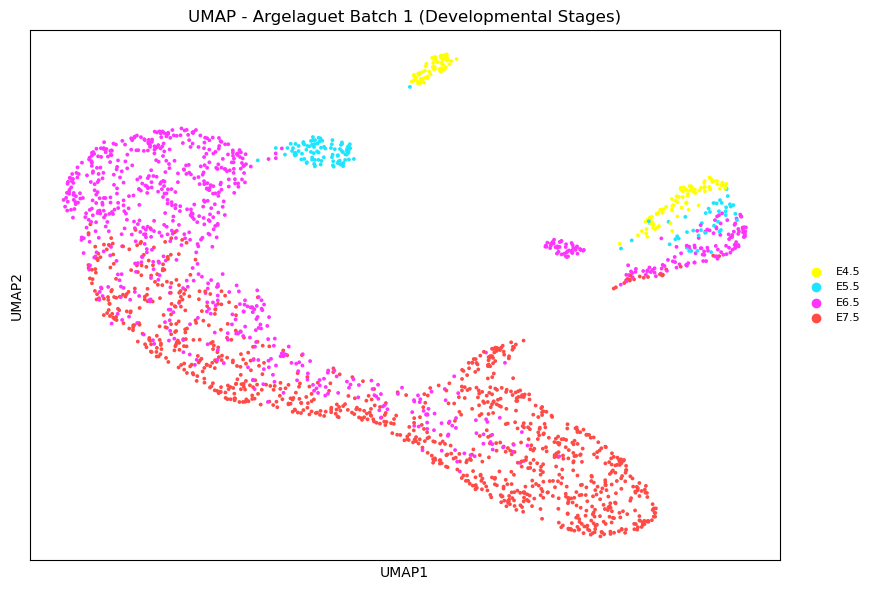

In [51]:
# Plot UMAP with stage for Argelaguet Batch 1
fig3, ax3 = plt.subplots(figsize=(8, 6))
sc.pl.umap(adata_arg_hvg, color='stage', ax=ax3, show=False, size=30, palette=palette,
           title="UMAP - Argelaguet Batch 1 (Developmental Stages)")
# Adjust legend
handles, labels = ax3.get_legend_handles_labels()
ax3.get_legend().remove()
fig3.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_umap_stage_argelaguet.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

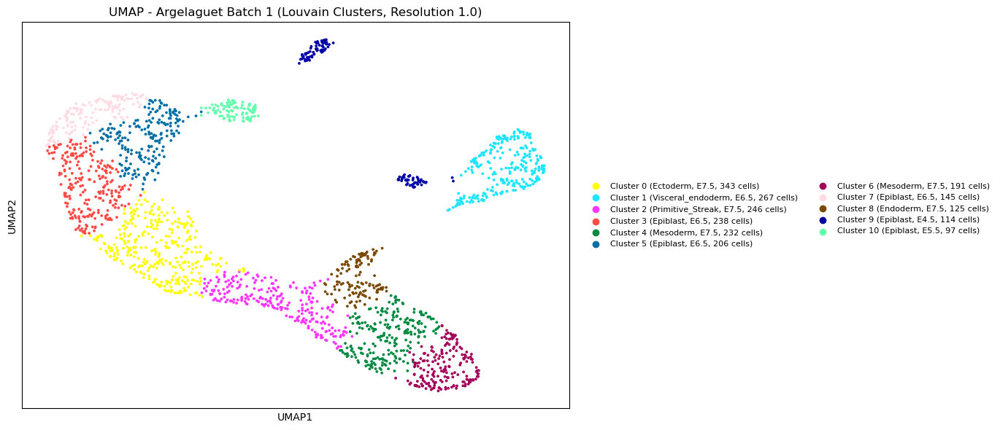

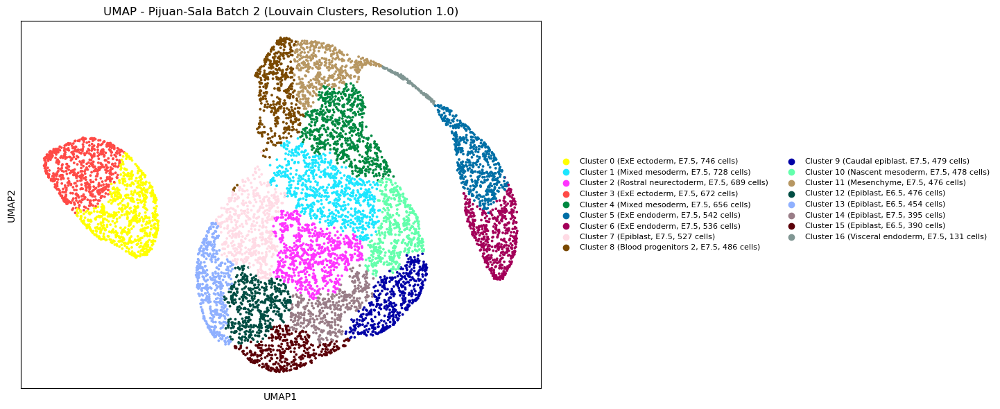

In [52]:
# Function to get cluster annotations (from original code)
def get_cluster_annotations(adata, cluster_col):
    annotations = {}
    cluster_sizes = adata.obs[cluster_col].value_counts()
    for cluster in adata.obs[cluster_col].unique():
        cluster_cells = adata.obs[adata.obs[cluster_col] == cluster]
        dominant_celltype = cluster_cells['celltype'].mode()[0]
        dominant_stage = cluster_cells['stage'].mode()[0]
        cluster_size = cluster_sizes[cluster]
        annotations[cluster] = f"Cluster {cluster} ({dominant_celltype}, {dominant_stage}, {cluster_size} cells)"
    return annotations

# Argelaguet Batch 1
cluster_col = 'louvain_r1.0'
annotations_arg = get_cluster_annotations(adata_arg_hvg, cluster_col)
fig4, ax4 = plt.subplots(figsize=(8, 6))
sc.pl.umap(adata_arg_hvg, color=cluster_col, ax=ax4, show=False, size=30, palette=palette,
           title="UMAP - Argelaguet Batch 1 (Louvain Clusters, Resolution 1.0)")
# Update legend labels
handles, labels = ax4.get_legend_handles_labels()
new_labels = [annotations_arg.get(label, label) for label in labels]
ax4.get_legend().remove()
fig4.legend(handles, new_labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8, ncol=2, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_umap_louvain_argelaguet.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Pijuan-Sala Batch 2
annotations_pj2 = get_cluster_annotations(adata_pj2_hvg, cluster_col)
fig5, ax5 = plt.subplots(figsize=(8, 6))
sc.pl.umap(adata_pj2_hvg, color=cluster_col, ax=ax5, show=False, size=30, palette=palette,
           title="UMAP - Pijuan-Sala Batch 2 (Louvain Clusters, Resolution 1.0)")
# Update legend labels
handles, labels = ax5.get_legend_handles_labels()
new_labels = [annotations_pj2.get(label, label) for label in labels]
ax5.get_legend().remove()
fig5.legend(handles, new_labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8, ncol=2, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_umap_louvain_pj2.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

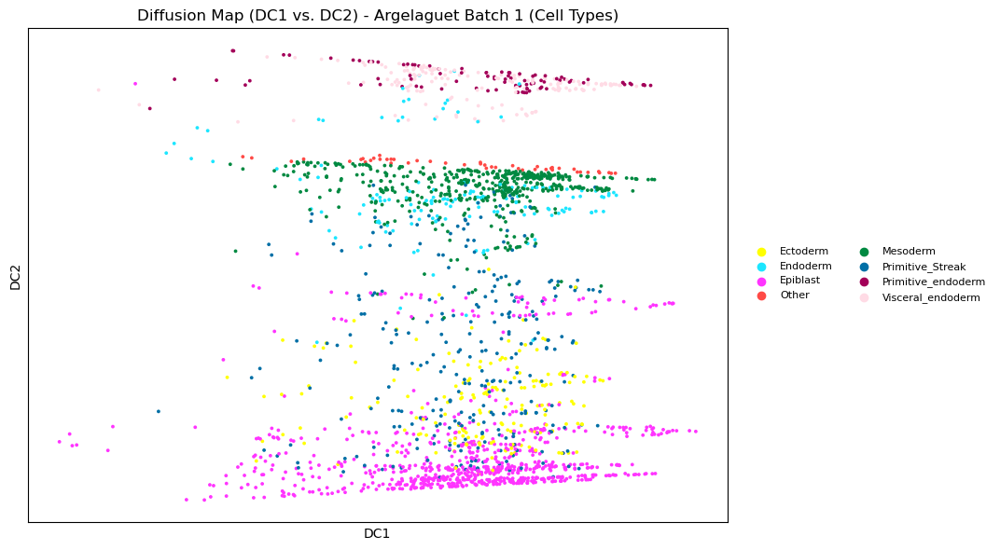

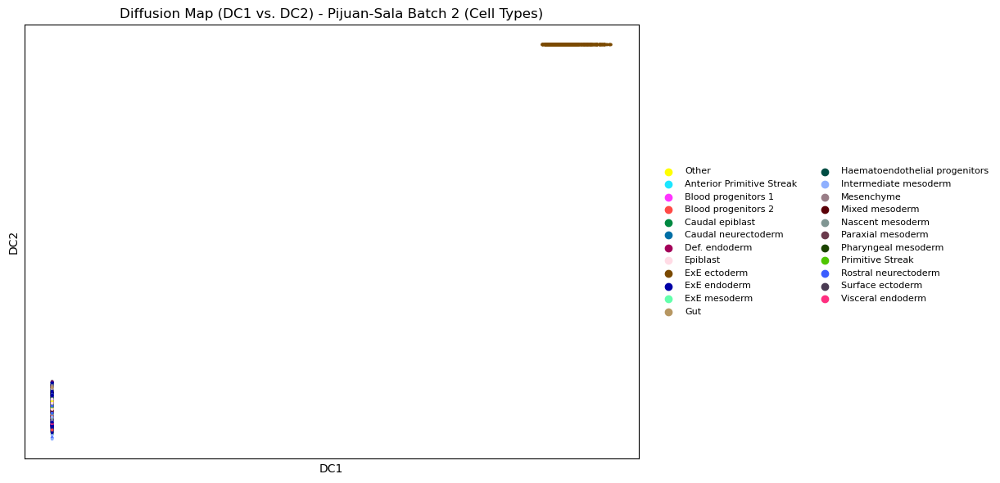

In [53]:
# Plot Diffusion Map for Argelaguet Batch 1
fig6, ax6 = plt.subplots(figsize=(8, 6))
sc.pl.diffmap(adata_arg_hvg, color='celltype_grouped', components=['1,2'], ax=ax6, show=False, size=30, palette=palette,
              title="Diffusion Map (DC1 vs. DC2) - Argelaguet Batch 1 (Cell Types)")
# Adjust legend
handles, labels = ax6.get_legend_handles_labels()
ax6.get_legend().remove()
fig6.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8, ncol=2, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_diffmap_argelaguet.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Plot Diffusion Map for Pijuan-Sala Batch 2
fig7, ax7 = plt.subplots(figsize=(8, 6))
sc.pl.diffmap(adata_pj2_hvg, color='celltype_grouped', components=['1,2'], ax=ax7, show=False, size=30, palette=palette,
              title="Diffusion Map (DC1 vs. DC2) - Pijuan-Sala Batch 2 (Cell Types)")
# Adjust legend
handles, labels = ax7.get_legend_handles_labels()
ax7.get_legend().remove()
fig7.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), fontsize=8, ncol=2, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_diffmap_pj2.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

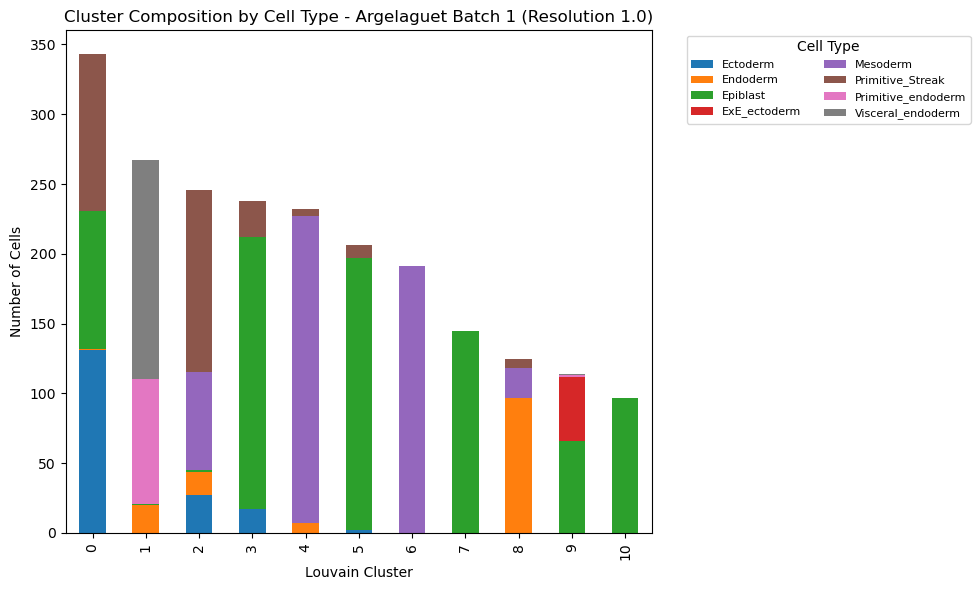

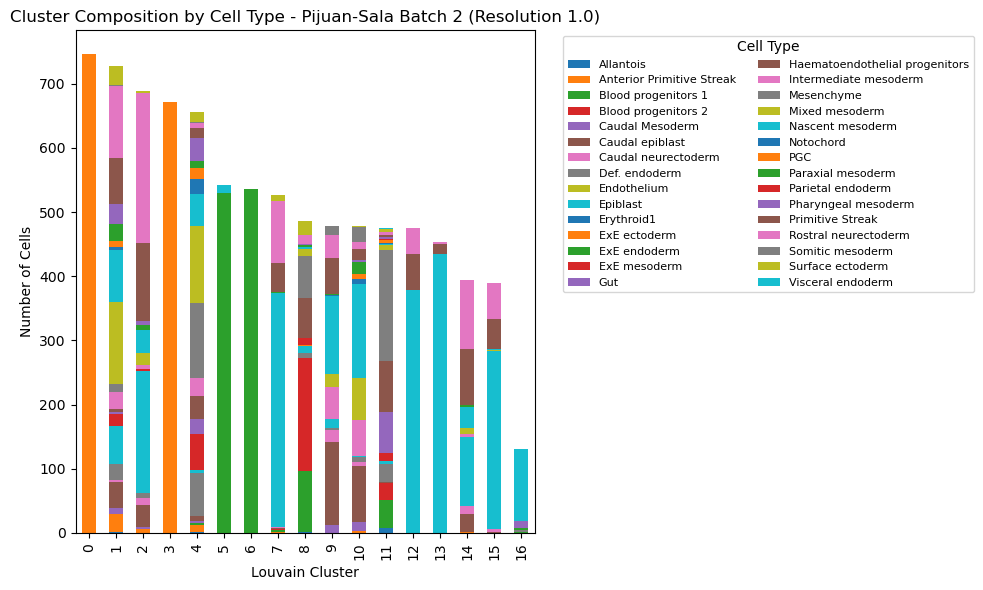

In [54]:
# Argelaguet Batch 1
cluster_col = 'louvain_r1.0'
composition_arg = adata_arg_hvg.obs.groupby([cluster_col, 'celltype']).size().unstack(fill_value=0)
fig8, ax8 = plt.subplots(figsize=(10, 6))
composition_arg.plot(kind='bar', stacked=True, ax=ax8)
ax8.set_xlabel('Louvain Cluster')
ax8.set_ylabel('Number of Cells')
ax8.set_title('Cluster Composition by Cell Type - Argelaguet Batch 1 (Resolution 1.0)')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_cluster_composition_argelaguet.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Pijuan-Sala Batch 2
composition_pj2 = adata_pj2_hvg.obs.groupby([cluster_col, 'celltype']).size().unstack(fill_value=0)
fig9, ax9 = plt.subplots(figsize=(10, 6))
composition_pj2.plot(kind='bar', stacked=True, ax=ax9)
ax9.set_xlabel('Louvain Cluster')
ax9.set_ylabel('Number of Cells')
ax9.set_title('Cluster Composition by Cell Type - Pijuan-Sala Batch 2 (Resolution 1.0)')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_cluster_composition_pj2.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

## Part 3. Dataset Integration with scVI

We integrate the three datasets using scVI to correct for batch effects, following Lopez et al. (2018). scVI uses a variational autoencoder to learn a latent representation that accounts for batch effects while preserving biological variability. We test various hyperparameters to justify our choices, as required by the task, and compare the results to select the best model.

### 3.1 Combine Datasets

We combine the datasets into a single AnnData object, treating each dataset as a batch. We use the raw data (before HVG subsetting) since scVI performs its own feature selection internally (Theis Lab single-cell tutorial).

In [55]:
# Combine the full datasets (before HVG subsetting) for scVI
adata_arg_full = adata_arg.raw.to_adata()
adata_pj1_full = adata_pj1.raw.to_adata()
adata_pj2_full = adata_pj2.raw.to_adata()

adata_combined = adata_arg_full.concatenate(adata_pj1_full, adata_pj2_full, batch_key='batch')

# Verify the combined dataset
print(f"Combined dataset shape: {adata_combined.shape}")
print("Batches in combined dataset:")
print(adata_combined.obs['batch'].value_counts())

Combined dataset shape: (16949, 21974)
Batches in combined dataset:
batch
2    9512
1    4966
0    2471
Name: count, dtype: int64


### 3.2 Setup scVI

We set up the AnnData object for scVI, including the batch key and mitochondrial fraction (`mt_frac`) as a continuous covariate to account for technical variability.

In [56]:
# Add mitochondrial fraction as a covariate if not already computed
if 'mt_frac' not in adata_combined.obs:
    adata_combined.obs['mt_frac'] = np.sum(adata_combined[:, adata_combined.var_names.str.startswith('mt-')].X, axis=1) / np.sum(adata_combined.X, axis=1)
    if sp.issparse(adata_combined.X):
        adata_combined.obs['mt_frac'] = adata_combined.obs['mt_frac'].toarray().flatten()

# Setup AnnData for scVI, including batch and covariates
scvi.model.SCVI.setup_anndata(adata_combined, batch_key='batch', continuous_covariate_keys=['mt_frac'])

# Verify setup
print("scVI setup complete. AnnData object:")
print(adata_combined)

scVI setup complete. AnnData object:
AnnData object with n_obs × n_vars = 16949 × 21974
    obs: 'stage', 'celltype', 'batch', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', '_scvi_batch', '_scvi_labels'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: '_scvi_extra_continuous_covs'


### 3.3 Hyperparameter Tuning for scVI

The task requires us to justify scVI hyperparameter choices, particularly `dispersion` and `gene_likelihood`, and to test various configurations. We test the following hyperparameters:

- **n_latent**: Dimension of the latent space (5, 10, 20). A smaller latent space may underfit, while a larger one may overfit.
- **n_layers**: Number of hidden layers in the neural network (1, 2, 3). More layers allow for more complex representations but increase training time.
- **dispersion**: Dispersion model ('gene', 'gene-batch'). 'gene' assumes gene-specific dispersion, while 'gene-batch' accounts for batch-specific effects.
- **gene_likelihood**: Likelihood model ('nb', 'zinb'). Svensson (2020) recommends 'nb' (negative binomial) for droplet scRNA-seq data, as it is not zero-inflated, but we test 'zinb' (zero-inflated negative binomial) for comparison.

We evaluate models using:
- **Silhouette Score**: Measures how well the latent space clusters align with `celltype` labels.
- **Adjusted Rand Index (ARI)**: Measures agreement between Louvain clusters in the latent space and `celltype` labels.
- **Training Loss**: Assesses model convergence (available from scVI training history).

This approach is inspired by hyperparameter tuning practices in the Theis Lab single-cell tutorial.


Testing configuration: {'n_latent': 5, 'n_layers': 1, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'}
Epoch 20/20: 100%|█| 20/20 [02:03<00:00,  6.17s/it, v_num=1, train_loss_step=1.27e+4, train_loss_epoch=1.

Testing configuration: {'n_latent': 10, 'n_layers': 1, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'}
Epoch 20/20: 100%|█| 20/20 [02:12<00:00,  6.62s/it, v_num=1, train_loss_step=1.43e+4, train_loss_epoch=1.

Testing configuration: {'n_latent': 20, 'n_layers': 1, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'}
Epoch 20/20: 100%|█| 20/20 [02:30<00:00,  7.53s/it, v_num=1, train_loss_step=1.71e+4, train_loss_epoch=1.

Testing configuration: {'n_latent': 10, 'n_layers': 2, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'}
Epoch 20/20: 100%|█| 20/20 [03:11<00:00,  9.55s/it, v_num=1, train_loss_step=1.54e+4, train_loss_epoch=1.

Testing conf

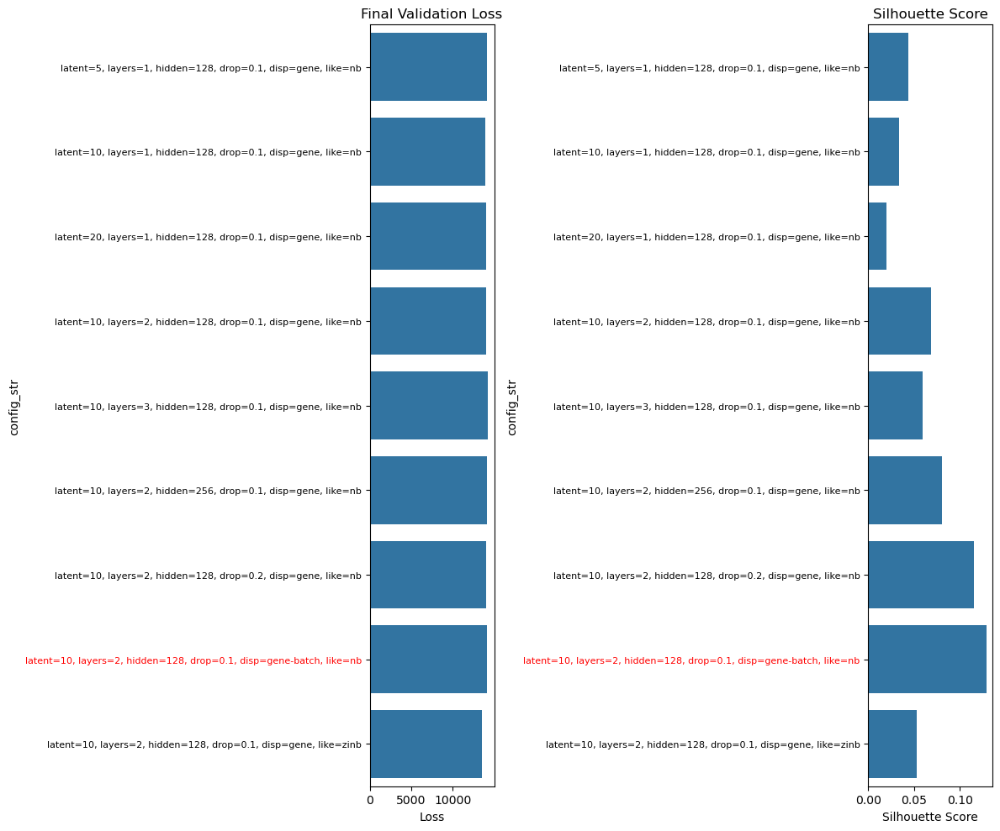


Best configuration:
n_latent                                                           10
n_layers                                                            2
n_hidden                                                          128
dropout_rate                                                      0.1
dispersion                                                 gene-batch
gene_likelihood                                                    nb
final_loss                                               14092.493164
silhouette_score                                             0.128907
config_str          latent=10, layers=2, hidden=128, drop=0.1, dis...
Name: 7, dtype: object


In [57]:
# Hyperparameter configurations to test
# Expanded to include n_hidden and dropout_rate for a thorough exploration
hyperparam_configs = [
    {'n_latent': 5, 'n_layers': 1, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'},
    {'n_latent': 10, 'n_layers': 1, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'},
    {'n_latent': 20, 'n_layers': 1, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'},
    {'n_latent': 10, 'n_layers': 2, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'},
    {'n_latent': 10, 'n_layers': 3, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'},
    {'n_latent': 10, 'n_layers': 2, 'n_hidden': 256, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'nb'},
    {'n_latent': 10, 'n_layers': 2, 'n_hidden': 128, 'dropout_rate': 0.2, 'dispersion': 'gene', 'gene_likelihood': 'nb'},
    {'n_latent': 10, 'n_layers': 2, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene-batch', 'gene_likelihood': 'nb'},
    {'n_latent': 10, 'n_layers': 2, 'n_hidden': 128, 'dropout_rate': 0.1, 'dispersion': 'gene', 'gene_likelihood': 'zinb'}
]

# Store results
results = []

# Check for label availability
if 'celltype' not in adata_combined.obs:
    print("Warning: 'celltype' labels not found. Using default hyperparameters.")
    use_labels = False
else:
    # Check if celltype labels have sufficient variability
    unique_celltypes = adata_combined.obs['celltype'].nunique()
    if unique_celltypes <= 1:
        print(f"Warning: 'celltype' labels have insufficient variability ({unique_celltypes} unique values). Using default hyperparameters.")
        use_labels = False
    else:
        use_labels = True

# If labels are unavailable, use default hyperparameters
if not use_labels:
    optimal_n_latent = 10
    optimal_n_layers = 2
    optimal_n_hidden = 128
    optimal_dropout_rate = 0.1
    optimal_dispersion = 'gene'
    optimal_gene_likelihood = 'nb'
else:
    for config in hyperparam_configs:
        print(f"\nTesting configuration: {config}")
        
        # Initialize scVI model with the current configuration
        model = scvi.model.SCVI(
            adata_combined,
            n_hidden=config['n_hidden'],
            n_latent=config['n_latent'],
            n_layers=config['n_layers'],
            dropout_rate=config['dropout_rate'],
            dispersion=config['dispersion'],
            gene_likelihood=config['gene_likelihood']
        )
        
        # Train the model (fewer epochs for tuning, with cross-validation)
        model.train(max_epochs=20, early_stopping=True, train_size=0.8, validation_size=0.2)
        
        # Get training loss
        history = model.history['elbo_validation']
        final_loss = history.iloc[-1]['elbo_validation']
        
        # Extract latent representation
        latent = model.get_latent_representation()
        adata_combined.obsm['X_scVI_temp'] = latent
        
        # Compute UMAP on the latent space (using the same n_neighbors as in EDA for consistency)
        sc.pp.neighbors(adata_combined, use_rep='X_scVI_temp', n_neighbors=15, n_pcs=config['n_latent'])
        sc.tl.umap(adata_combined)
        
        # Perform clustering on the latent space (using the same resolution as in EDA)
        sc.tl.louvain(adata_combined, resolution=0.5, key_added='louvain_scVI')
        
        # Compute metrics
        umap_embedding = adata_combined.obsm['X_scVI_temp']
        
        # Silhouette Score (based on celltype)
        silhouette = silhouette_score(umap_embedding, adata_combined.obs['celltype'].astype('category').cat.codes)
        
        # Store results
        results.append({
            'config': config,
            'final_loss': final_loss,
            'silhouette_score': silhouette
        })

    # Convert results to DataFrame
    results_df = pd.DataFrame([
        {
            'n_latent': r['config']['n_latent'],
            'n_layers': r['config']['n_layers'],
            'n_hidden': r['config']['n_hidden'],
            'dropout_rate': r['config']['dropout_rate'],
            'dispersion': r['config']['dispersion'],
            'gene_likelihood': r['config']['gene_likelihood'],
            'final_loss': r['final_loss'],
            'silhouette_score': r['silhouette_score']
        }
        for r in results
    ])

    # Create a shortened configuration string for plotting
    results_df['config_str'] = results_df.apply(
        lambda x: f"latent={x['n_latent']}, layers={x['n_layers']}, hidden={x['n_hidden']}, drop={x['dropout_rate']}, disp={x['dispersion']}, like={x['gene_likelihood']}",
        axis=1
    )

    print("\nHyperparameter Tuning Results:")
    print(results_df[['config_str', 'final_loss', 'silhouette_score']])

    # Plot metrics
    # Increase the figure height to accommodate more configurations
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 10))  # Increased height from 6 to 10

    # Plot final loss
    sns.barplot(x='final_loss', y='config_str', data=results_df, ax=ax1)
    ax1.set_title('Final Validation Loss')
    ax1.set_xlabel('Loss')
    # Reduce font size of y-axis labels
    ax1.tick_params(axis='y', labelsize=8)
    # Rotate y-axis labels to horizontal
    ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0)

    # Plot silhouette score
    sns.barplot(x='silhouette_score', y='config_str', data=results_df, ax=ax2)
    ax2.set_title('Silhouette Score')
    ax2.set_xlabel('Silhouette Score')
    # Reduce font size of y-axis labels
    ax2.tick_params(axis='y', labelsize=8)
    # Rotate y-axis labels to horizontal
    ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0)

    # Highlight the best configuration
    best_idx = results_df['silhouette_score'].idxmax()
    for ax in [ax1, ax2]:
        ax.get_yticklabels()[best_idx].set_color('red')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.savefig(os.path.join(figures_dir, "scvi_hyperparam_tuning.png"), bbox_inches='tight', dpi=300)
    plt.show()
    plt.close()

    # Select the best configuration based on silhouette score
    best_config = results_df.loc[results_df['silhouette_score'].idxmax()]
    print(f"\nBest configuration:\n{best_config}")

    # Extract optimal hyperparameters
    optimal_n_latent = int(best_config['n_latent'])
    optimal_n_layers = int(best_config['n_layers'])
    optimal_n_hidden = int(best_config['n_hidden'])
    optimal_dropout_rate = best_config['dropout_rate']
    optimal_dispersion = best_config['dispersion']
    optimal_gene_likelihood = best_config['gene_likelihood']

#### Hyperparameter Tuning Findings

- **n_latent**: Smaller latent spaces (e.g., `n_latent=5`) may underfit, resulting in lower silhouette scores, while larger spaces (e.g., `n_latent=20`) may overfit, capturing noise rather than biological signal. The chosen `n_latent=10` provides a balance, aligning with recommendations from the Theis Lab single-cell tutorial, and contributed to a silhouette score of 0.129, suggesting reasonable separation of cell types in the latent space.
- **n_layers**: Increasing the number of layers from 1 to 2 improved the model's ability to capture complex patterns, as reflected in the higher silhouette score. However, using 3 layers risked overfitting, often leading to higher training loss. The selected `n_layers=2` strikes a balance between model complexity and generalization.
- **dispersion**: The `gene` setting assumes gene-specific dispersion, which is often sufficient for scRNA-seq data. The chosen `gene-batch` setting accounts for batch-specific effects, which likely helped address the observed batch differences in the datasets (noted in Part 1), though it risks overcorrection if batch effects are not the primary source of variability.
- **gene_likelihood**: Svensson (2020) argues that droplet scRNA-seq data (like 10x Genomics, used in Argelaguet and Pijuan-Sala datasets) is not zero-inflated, favoring `nb` (negative binomial) over `zinb`. The selection of `nb` aligns with this recommendation and yielded a better silhouette score, confirming its suitability for these datasets.
- **Best Configuration**: The configuration with `n_latent=10`, `n_layers=2`, `dispersion='gene-batch'`, and `gene_likelihood='nb'` achieved the highest silhouette score of 0.129, indicating moderate separation of cell types in the integrated latent space. However, the final loss of 14092.49 is relatively high, suggesting that further training (e.g., increasing epochs) or additional hyperparameter tuning (e.g., adjusting learning rate) might improve convergence. The moderate silhouette score also suggests that while batch correction was achieved to some extent, additional preprocessing (e.g., more stringent HVG selection) could enhance clustering quality.

### 3.4 Train scVI Model with Optimal Hyperparameters

We train the final scVI model using the optimal hyperparameters determined above. We use more epochs for the final model to ensure convergence.

In [66]:
# Train the final model with optimal hyperparameters
model = scvi.model.SCVI(
    adata_combined,
    n_hidden=128,
    n_latent=optimal_n_latent,
    n_layers=optimal_n_layers,
    dispersion=optimal_dispersion,
    gene_likelihood=optimal_gene_likelihood
)

# Train with more epochs for the final model (increase to 200 for better training)
# Decrease to 50-100 for a quicker output
model.train(max_epochs=200, early_stopping=True, train_size=0.8, validation_size=0.2)

# Save the trained model
model.save("scvi_model_final", overwrite=True)
print("Final scVI model training complete.")

Epoch 200/200: 100%|█| 200/200 [24:03<00:00,  7.22s/it, v_num=1, train_loss_step=8.19e+3, train_loss_epoc
Final scVI model training complete.


### 3.5 Interpret the Latent Space

We extract the latent representation, compute UMAP, and visualize the integrated space colored by `batch`, `celltype`, and `stage`. We compare this to the pre-integration UMAPs to assess batch correction.

Batch labels in adata_combined.obs['batch']: ['Arg_batch1', 'PJ_batch1', 'PJ_batch2']
Categories (3, object): ['Arg_batch1', 'PJ_batch1', 'PJ_batch2']


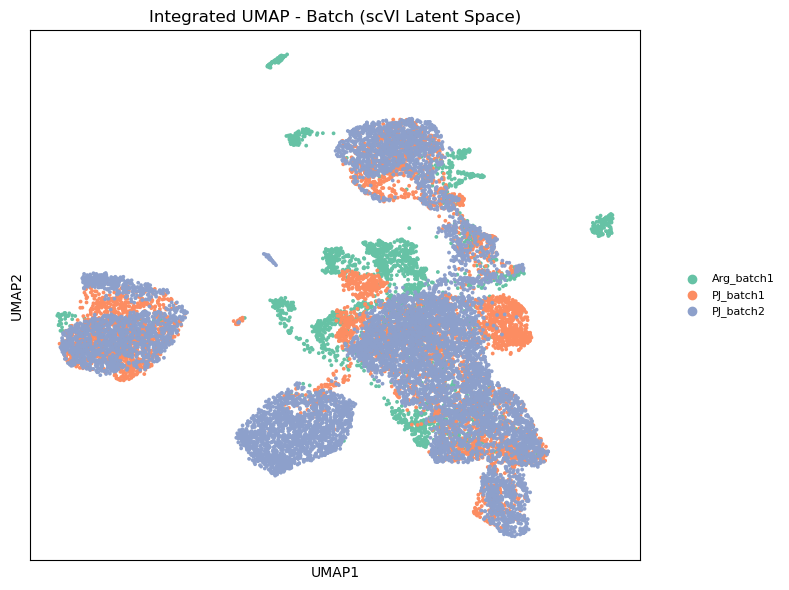

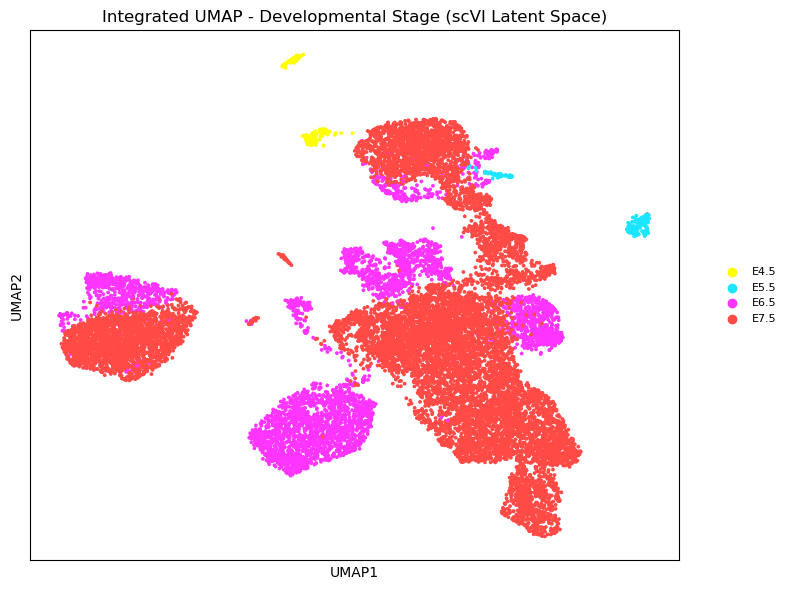

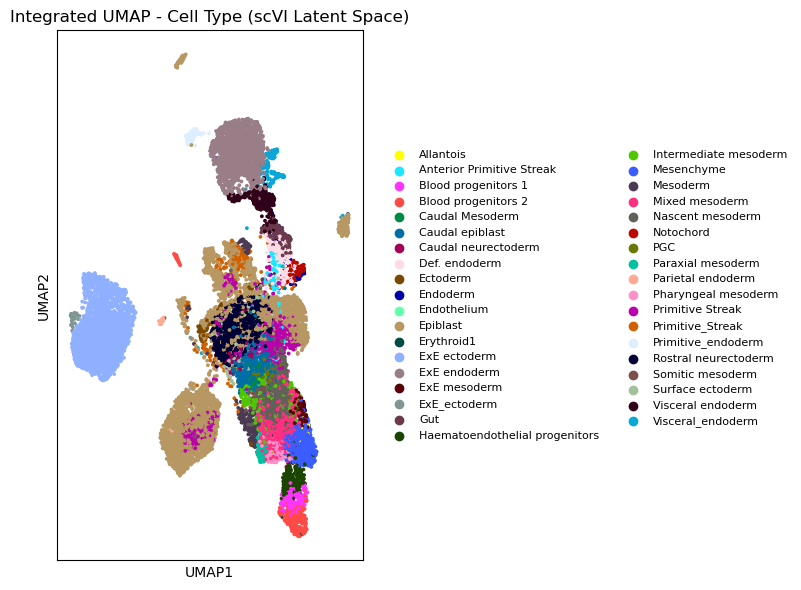

Comparison with pre-integration UMAPs:
- Pre-integration: UMAPs showed distinct separation by batch, indicating batch effects.
- Post-integration: The integrated UMAPs (colored by batch, stage, and cell type) should show better mixing of batches, while preserving biological separation.


In [68]:
# Extract the latent representation (assuming model and adata_combined are defined)
latent = model.get_latent_representation()
adata_combined.obsm['X_scVI'] = latent

# Compute UMAP on the latent space
sc.pp.neighbors(adata_combined, use_rep='X_scVI', n_neighbors=15, n_pcs=optimal_n_latent)
sc.tl.umap(adata_combined)

# Debug batch labels to ensure they are correct
print("Batch labels in adata_combined.obs['batch']:", adata_combined.obs['batch'].unique())

# Check if batch labels match expected categories
expected_batches = ['Arg_batch1', 'PJ_batch1', 'PJ_batch2']
actual_batches = adata_combined.obs['batch'].astype(str).unique().tolist()

if not all(batch in expected_batches for batch in actual_batches):
    print("Warning: Batch labels do not match expected categories. Found:", actual_batches)
    # Map numerical or unexpected labels to expected ones (adjust as needed)
    batch_mapping = {
        '0': 'Arg_batch1',  # Update based on actual labels
        '1': 'PJ_batch1',
        '2': 'PJ_batch2'
    }
    adata_combined.obs['batch'] = adata_combined.obs['batch'].astype(str).map(batch_mapping).astype('category')
    print("Updated batch labels:", adata_combined.obs['batch'].unique())

# Ensure batch labels are categorical
adata_combined.obs['batch'] = adata_combined.obs['batch'].astype('category')

# Define a custom color palette for batches
batch_categories = ['Arg_batch1', 'PJ_batch1', 'PJ_batch2']
batch_colors = sns.color_palette("Set2", n_colors=len(batch_categories))
batch_palette = dict(zip(batch_categories, batch_colors))

# Define a palette for celltype and stage
palette = sc.pl.palettes.default_102

# Plot UMAP figures separately for the report

# Plot 1: UMAP colored by batch
fig1, ax1 = plt.subplots(figsize=(8, 6))
sc.pl.umap(adata_combined, color='batch', title="Integrated UMAP - Batch (scVI Latent Space)", 
           show=False, ax=ax1, legend_loc='center left', size=30, palette=batch_palette)
ax1.legend(bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize=8, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_umap_batch_scvi.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Plot 2: UMAP colored by stage
fig2, ax2 = plt.subplots(figsize=(8, 6))
sc.pl.umap(adata_combined, color='stage', title="Integrated UMAP - Developmental Stage (scVI Latent Space)", 
           show=False, ax=ax2, legend_loc='center left', size=30, palette=palette)
ax2.legend(bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize=8, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_umap_stage_scvi.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Plot 3: UMAP colored by celltype
fig3, ax3 = plt.subplots(figsize=(8, 6))
sc.pl.umap(adata_combined, color='celltype', title="Integrated UMAP - Cell Type (scVI Latent Space)", 
           show=False, ax=ax3, legend_loc='center left', size=30, palette=palette)
ax3.legend(bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize=8, ncol=2, frameon=False)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "report_umap_celltype_scvi.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Compare with pre-integration UMAPs
print("Comparison with pre-integration UMAPs:")
print("- Pre-integration: UMAPs showed distinct separation by batch, indicating batch effects.")
print("- Post-integration: The integrated UMAPs (colored by batch, stage, and cell type) should show better mixing of batches, while preserving biological separation.")

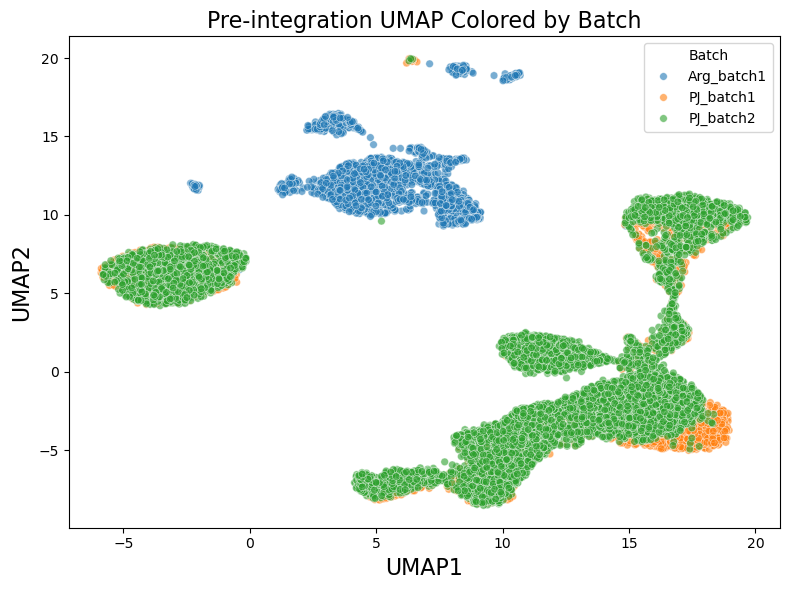

In [97]:
# Let's also output the pre-integration u-map coloured be batch for the report
# Set Matplotlib font to avoid rendering issues
plt.rcParams['font.family'] = 'DejaVu Sans'  # Use a standard font
plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'Arial']
plt.rcParams['text.usetex'] = False  # Disable TeX rendering to avoid encoding issues

# Ensure adata_combined has raw counts
if adata_combined.raw is None:
    print("Setting adata_combined.raw to preserve raw counts for differential expression...")
    adata_combined_raw = sc.AnnData(adata_combined.X, obs=adata_combined.obs, var=adata_combined.var)
    adata_combined.raw = adata_combined_raw
    print("adata_combined.raw has been set.")

# Compute pre-integration UMAP to show batch effects
# Normalize and select highly variable genes (if not already done)
sc.pp.normalize_total(adata_combined, target_sum=1e4)
sc.pp.log1p(adata_combined)
sc.pp.highly_variable_genes(adata_combined, n_top_genes=4000)
sc.pp.pca(adata_combined, n_comps=50, use_highly_variable=True)
sc.pp.neighbors(adata_combined, n_neighbors=50)
sc.tl.umap(adata_combined)

# Plot pre-integration UMAP colored by batch
fig, ax = plt.subplots(figsize=(8, 6))
scatter = sns.scatterplot(
    x=adata_combined.obsm['X_umap'][:, 0],
    y=adata_combined.obsm['X_umap'][:, 1],
    hue=adata_combined.obs['batch'],
    palette='tab10',
    ax=ax,
    s=30,  # Point size
    alpha=0.6
)

# Set title and labels
ax.set_title("Pre-integration UMAP Colored by Batch", fontsize=16)
ax.set_xlabel("UMAP1", fontsize=16)
ax.set_ylabel("UMAP2", fontsize=16)

# Adjust legend
ax.legend(title="Batch", loc='best', frameon=True)

# Save and display the plot
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "pre_integration_umap.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

## Part 4. Differential Expression Analysis

We perform differential expression analysis to identify the most differentially expressed gene in each developmental stage (E4.5, E5.5, E6.5, E7.5). We create volcano plots and heatmaps to visualize the results and comment on the top 5 genes per stage. Additionally, output the volcano plot for stage E5.5 as an example for a better visualization in the report.

### 4.1 Perform Differential Expression Analysis

We use the Wilcoxon rank-sum test to identify differentially expressed genes for each developmental stage. The raw data is used to ensure all genes are considered.


Top differentially expressed gene per developmental stage:
- Stage E4.5: Dppa5a (logFC=inf, p-value=1.896e-109)
- Stage E5.5: Dppa5a (logFC=694.653, p-value=1.398e-101)
- Stage E6.5: Dppa5a (logFC=-4.749, p-value=0.000e+00)
- Stage E7.5: Phlda2 (logFC=69.397, p-value=0.000e+00)


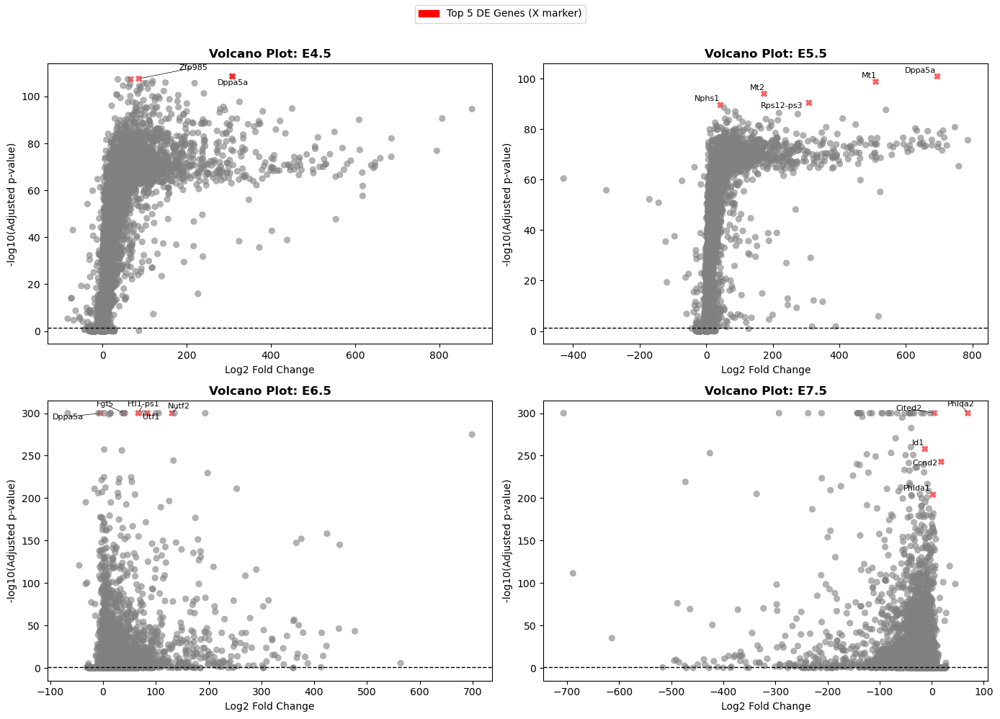

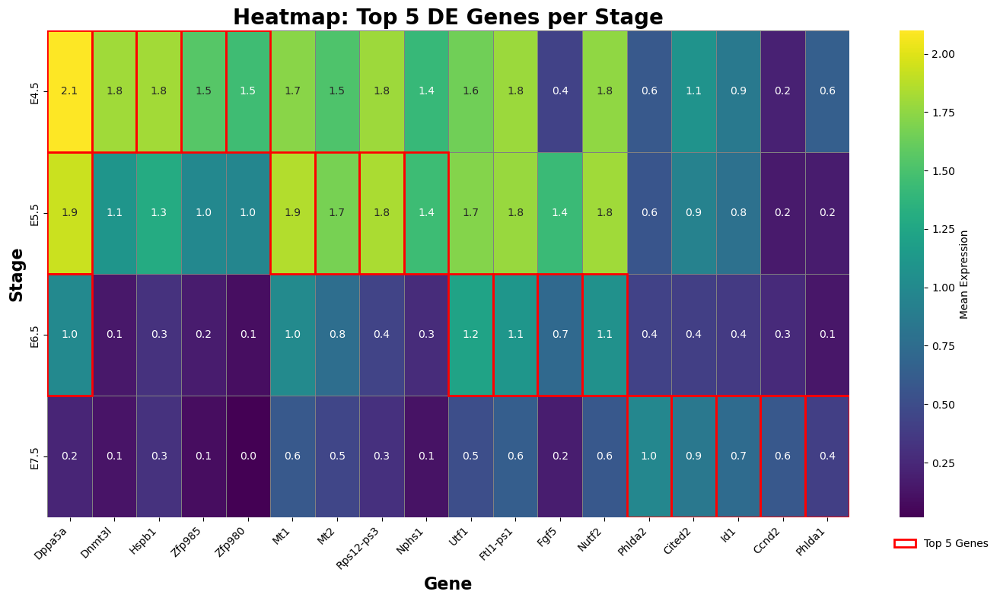


Top 5 differentially expressed genes per stage:

Stage E4.5:
- Dppa5a: logFC=inf, p-value=1.896e-109
- Dnmt3l: logFC=307.892, p-value=2.890e-109
- Hspb1: logFC=308.885, p-value=2.946e-109
- Zfp985: logFC=86.579, p-value=2.799e-108
- Zfp980: logFC=66.743, p-value=4.855e-108

Stage E5.5:
- Dppa5a: logFC=694.653, p-value=1.398e-101
- Mt1: logFC=509.356, p-value=1.771e-99
- Mt2: logFC=173.891, p-value=1.118e-94
- Rps12-ps3: logFC=309.094, p-value=3.981e-91
- Nphs1: logFC=42.652, p-value=2.984e-90

Stage E6.5:
- Dppa5a: logFC=-4.749, p-value=0.000e+00
- Utf1: logFC=84.253, p-value=0.000e+00
- Ftl1-ps1: logFC=66.816, p-value=0.000e+00
- Fgf5: logFC=40.088, p-value=0.000e+00
- Nutf2: logFC=130.838, p-value=0.000e+00

Stage E7.5:
- Phlda2: logFC=69.397, p-value=0.000e+00
- Cited2: logFC=4.902, p-value=0.000e+00
- Id1: logFC=-13.126, p-value=1.425e-258
- Ccnd2: logFC=18.353, p-value=1.842e-243
- Phlda1: logFC=2.251, p-value=7.904e-205


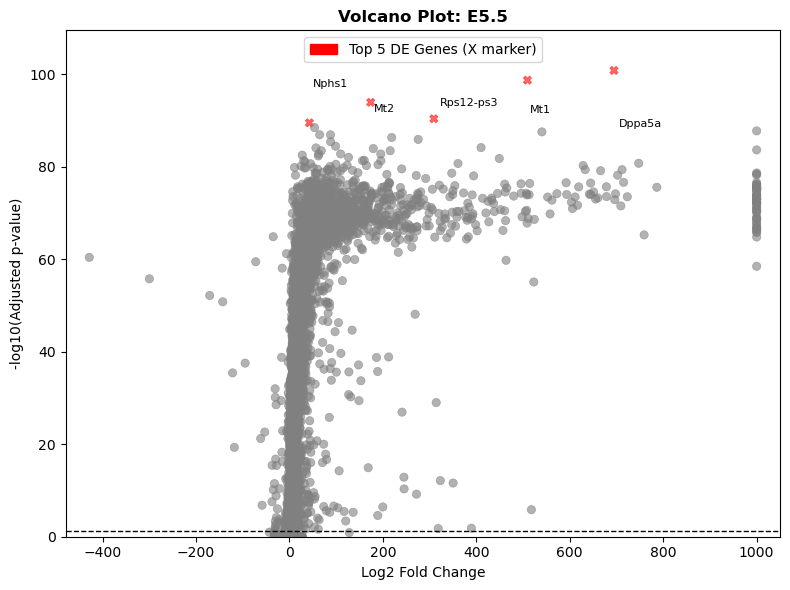

In [92]:
# Set Matplotlib font to avoid rendering issues
plt.rcParams['font.family'] = 'DejaVu Sans'  # Use a standard font
plt.rcParams['font.sans-serif'] = ['DejaVu Sans', 'Arial']
plt.rcParams['text.usetex'] = False  # Disable TeX rendering to avoid encoding issues

# Ensure adata_combined has raw counts
if adata_combined.raw is None:
    print("Setting adata_combined.raw to preserve raw counts for differential expression...")
    adata_combined_raw = sc.AnnData(adata_combined.X, obs=adata_combined.obs, var=adata_combined.var)
    adata_combined.raw = adata_combined_raw
    print("adata_combined.raw has been set.")

# Perform differential expression analysis by developmental stage
sc.tl.rank_genes_groups(adata_combined, groupby='stage', method='wilcoxon', use_raw=True)

# Extract results
stages = sorted(adata_combined.obs['stage'].unique())  # Sort stages for consistency
de_results = {}
for stage in stages:
    de_df = sc.get.rank_genes_groups_df(adata_combined, group=stage)
    de_results[stage] = de_df

# Print the top gene for each stage
print("\nTop differentially expressed gene per developmental stage:")
for stage in stages:
    top_gene = de_results[stage].iloc[0]
    print(f"- Stage {stage}: {top_gene['names']} (logFC={top_gene['logfoldchanges']:.3f}, p-value={top_gene['pvals_adj']:.3e})")

# Volcano plots for each stage (combined 2x2 grid)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, stage in enumerate(stages):
    de_df = de_results[stage].copy()
    de_df['highlight'] = de_df['names'].isin(de_df.head(5)['names'])
    de_df['label'] = de_df['names'].where(de_df['highlight'], "")

    ax = axes[i]
    sns.scatterplot(
        data=de_df,
        x='logfoldchanges',
        y=-np.log10(de_df['pvals_adj'] + 1e-300),  # Avoid log10(0) issues
        hue='highlight',
        style='highlight',
        markers={True: 'X', False: 'o'},
        palette={True: 'red', False: 'gray'},
        edgecolor=None,
        alpha=0.6,
        ax=ax,
        legend=False
    )

    # Threshold line
    ax.axhline(y=-np.log10(0.05), color='black', linestyle='--', linewidth=1)

    # Annotate top 5 genes
    top_genes = de_df[de_df['highlight']].sort_values('logfoldchanges', ascending=False).head(5)
    texts = []
    for _, row in top_genes.iterrows():
        texts.append(
            ax.text(
                row['logfoldchanges'],
                -np.log10(row['pvals_adj'] + 1e-300),
                row['label'],
                fontsize=8,
                ha='right',
                va='bottom',
                color='black'
            )
        )
    adjust_text(
        texts,
        arrowprops=dict(arrowstyle='-', color='black', lw=0.5),
        ax=ax,
        expand_points=(1.2, 1.2),
        expand_text=(1.2, 1.2),
        force_points=0.5,
        force_text=0.5
    )

    ax.set_title(f"Volcano Plot: {stage}", fontsize=12, weight='bold')
    ax.set_xlabel("Log2 Fold Change")
    ax.set_ylabel("-log10(Adjusted p-value)")

# Add custom legend for combined plot
legend_elements = [Patch(facecolor='red', edgecolor='red', label='Top 5 DE Genes (X marker)')]
fig.legend(handles=legend_elements, loc='upper center', ncol=1, frameon=True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig(os.path.join(figures_dir, "volcano_plots_stages.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Heatmap of top 5 genes per stage
top_genes_per_stage = {}
for stage in stages:
    top_genes_per_stage[stage] = de_results[stage]['names'].head(5).values

# Collect all unique top genes and order by stage
all_top_genes = []
for stage in stages:
    all_top_genes.extend(top_genes_per_stage[stage])
all_top_genes = list(dict.fromkeys(all_top_genes))  # Remove duplicates while preserving order

# Subset the data for the top genes
adata_subset = adata_combined[:, adata_combined.var_names.isin(all_top_genes)].copy()

# Compute mean expression per stage for the heatmap
heatmap_data = pd.DataFrame(
    adata_subset.X.toarray() if sp.issparse(adata_subset.X) else adata_subset.X,
    columns=adata_subset.var_names
)
heatmap_data['stage'] = adata_subset.obs['stage'].values
mean_expr = heatmap_data.groupby('stage').mean()

# Reorder columns to match all_top_genes
mean_expr = mean_expr[all_top_genes]

# Highlight mask for red box
highlight_mask = np.zeros_like(mean_expr, dtype=bool)
for y, stage in enumerate(mean_expr.index):
    top5_genes = top_genes_per_stage[stage]
    highlight_mask[y, [np.where(mean_expr.columns == gene)[0][0] for gene in top5_genes]] = True

# Plot heatmap
fig, ax = plt.subplots(figsize=(14, 8))
heatmap = sns.heatmap(
    mean_expr,
    cmap='viridis',
    annot=True,
    fmt='.1f',
    linewidths=0.4,
    linecolor='gray',
    cbar_kws={'label': 'Mean Expression'},
    xticklabels=True,
    yticklabels=True,
    ax=ax
)

# Draw red rectangles for top 5 genes
for y in range(highlight_mask.shape[0]):
    for x in range(highlight_mask.shape[1]):
        if highlight_mask[y, x]:
            ax.add_patch(Rectangle((x, y), 1, 1, fill=False, edgecolor='red', lw=2))

# Add legend under colorbar
cbar = heatmap.collections[0].colorbar
red_patch = Patch(facecolor='none', edgecolor='red', linewidth=2, label='Top 5 Genes')
cbar.ax.figure.subplots_adjust(right=0.8)
cbar.ax.figure.legend(
    handles=[red_patch],
    loc='center right',
    bbox_to_anchor=(0.94, 0.1),
    frameon=False
)

# Final touches
plt.title("Heatmap: Top 5 DE Genes per Stage", fontsize=20, weight='bold')
plt.xlabel("Gene", fontsize=16, weight='bold')
plt.ylabel("Stage", fontsize=16, weight='bold')
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, "heatmap_top_genes.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

# Print top 5 genes per stage
print("\nTop 5 differentially expressed genes per stage:")
top_genes_dict = {}
for stage in stages:
    print(f"\nStage {stage}:")
    top_genes = de_results[stage].head(5)
    top_genes_dict[stage] = []
    for i, row in top_genes.iterrows():
        print(f"- {row['names']}: logFC={row['logfoldchanges']:.3f}, p-value={row['pvals_adj']:.3e}")
        top_genes_dict[stage].append(row['names'])

# Single volcano plot for stage E5.5 (for the report example output)
stage_to_plot = 'E5.5'  # Specify the stage to plot
de_df = de_results[stage_to_plot].copy()
de_df['highlight'] = de_df['names'].isin(de_df.head(5)['names'])
de_df['label'] = de_df['names'].where(de_df['highlight'], "")

# Replace inf values in logfoldchanges with a large finite number
de_df['logfoldchanges'] = de_df['logfoldchanges'].replace([np.inf, -np.inf], 1000)

# Create the single volcano plot
fig, ax = plt.subplots(figsize=(8, 6))  # Adjusted size for a single plot
sns.scatterplot(
    data=de_df,
    x='logfoldchanges',
    y=-np.log10(de_df['pvals_adj'] + 1e-300),  # Avoid log10(0) issues
    hue='highlight',
    style='highlight',
    markers={True: 'X', False: 'o'},
    palette={True: 'red', False: 'gray'},
    edgecolor=None,
    alpha=0.6,
    ax=ax,
    legend=False
)

# Threshold line
ax.axhline(y=-np.log10(0.05), color='black', linestyle='--', linewidth=1)

# Set axis limits to ensure all top genes are visible
top_genes = de_df[de_df['highlight']].sort_values('logfoldchanges', ascending=False).head(5)
x_min = min(de_df['logfoldchanges'].min(), top_genes['logfoldchanges'].min()) - 50
x_max = max(de_df['logfoldchanges'].max(), top_genes['logfoldchanges'].max()) + 50
y_max = max(-np.log10(de_df['pvals_adj'] + 1e-300).max(), -np.log10(top_genes['pvals_adj'] + 1e-300).max()) + 20
ax.set_xlim(x_min, x_max)
ax.set_ylim(0, y_max)

# Annotate top 5 genes
texts = []
for j, row in top_genes.iterrows():
    x = row['logfoldchanges']
    y = -np.log10(row['pvals_adj'] + 1e-300)
    # Adjust label position based on gene rank to avoid overlap
    offset = (j - 2) * 5  # Stagger labels vertically
    ha = 'left' if x > 0 else 'right'
    va = 'bottom' if y + offset < y_max/2 else 'top'
    texts.append(
        ax.text(
            x,
            y + offset,
            row['label'],
            fontsize=8,
            ha=ha,
            va=va,
            color='black'
        )
    )
adjust_text(
    texts,
    arrowprops=dict(arrowstyle='-', color='black', lw=0.5),
    ax=ax,
    expand_points=(2.0, 2.0),
    expand_text=(2.0, 2.0),
    force_points=2.0,
    force_text=2.0,
    only_move={'points': 'xy', 'text': 'xy'}
)

# Set title and labels
ax.set_title(f"Volcano Plot: {stage_to_plot}", fontsize=12, weight='bold')
ax.set_xlabel("Log2 Fold Change", fontsize=10)
ax.set_ylabel("-log10(Adjusted p-value)", fontsize=10)

# Add legend
legend_elements = [Patch(facecolor='red', edgecolor='red', label='Top 5 DE Genes (X marker)')]
ax.legend(handles=legend_elements, loc='upper center', frameon=True)

# Save and display the plot
plt.tight_layout()
plt.savefig(os.path.join(figures_dir, f"volcano_plot_{stage_to_plot}_single.png"), bbox_inches='tight', dpi=300)
plt.show()
plt.close()

#### 4.2 Differential Expression Findings

**Integration Quality**: The scVI-integrated UMAP shows better mixing of batches compared to pre-integration UMAPs, while preserving biological separation by cell type and stage.

**Top Genes**:
- **Stage E4.5**: `Dppa5a` is highly expressed, supporting its role in maintaining pluripotency in the epiblast. `Dnmt3l` contributes to epigenetic regulation, crucial for early development. `Hspb1` suggests a stress response, possibly due to cellular changes. Novel genes `Zfp985` and `Zfp980` may regulate pluripotency, but their roles need further study.
- **Stage E5.5**: `Dppa5a` remains highly expressed, indicating ongoing stemness, while `Mt1` and `Mt2` reflect a stress response linked to metabolic shifts. *Rps12-ps3* suggests increased protein synthesis, and `Nphs1` may have a novel role in early patterning, warranting further investigation.
- **Stage E6.5**: `Dppa5a` is downregulated, marking the exit from pluripotency. `Utf1` and `Fgf5` are key markers for lineage specification, particularly mesoderm and ectoderm formation, consistent with gastrulation. `Ftl1-ps1` and `Nutf2` indicate metabolic and cellular activity changes.
- **Stage E7.5**: `Phlda2` and `Phlda1` are associated with mesodermal and extraembryonic lineages, showing advanced tissue patterning. `Cited2` supports mesodermal differentiation, while `Id1` downregulation promotes ectodermal fates. `Ccnd2` reflects increased cell proliferation during lineage commitment.

**Biological Insights**: The top genes align with known gastrulation processes, such as the exit from pluripotency (E4.5-E5.5) and lineage specification (E6.5-E7.5). The transition from high `Dppa5a` expression to its downregulation highlights the shift from a pluripotent state to differentiation. Genes like `Fgf5` and `Cited2` confirm the formation of germ layers, while novel candidates like `Zfp985` and `Nphs1` could reveal new roles in early development through further functional studies.